# **1.** Geometries

Import packages

In [3]:
from atlite.gis import ExclusionContainer
from atlite.gis import shape_availability
import atlite
import rasterio as rio
from rasterio.plot import show
import geopandas as gpd
import pandas as pd
import numpy as np
import xarray as xr
import os
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import country_converter as coco
import atlite
import pypsa
from pypsa.plot import add_legend_patches
import cartopy.crs as ccrs

import warnings
warnings.filterwarnings("ignore")

import gurobi

In [4]:
potential_pv

NameError: name 'potential_pv' is not defined

import file from tubcloud 

In [5]:
italy = gpd.read_file("https://tubcloud.tu-berlin.de/s/567ckizz2Y6RLQq/download?path=%2Fgadm&files=gadm_410-levels-ADM_1-ITA.gpkg")
EEZ = gpd.read_file("https://tubcloud.tu-berlin.de/s/567ckizz2Y6RLQq/download?path=%2Fmarineregions%2FWorld_EEZ_v11_20191118_gpkg&files=eez_v11.gpkg")

EEZ_italy = EEZ[EEZ.SOVEREIGN1 == 'Italy'].rename(index = {221:'EEZ'})

KeyboardInterrupt: 

<AxesSubplot: >

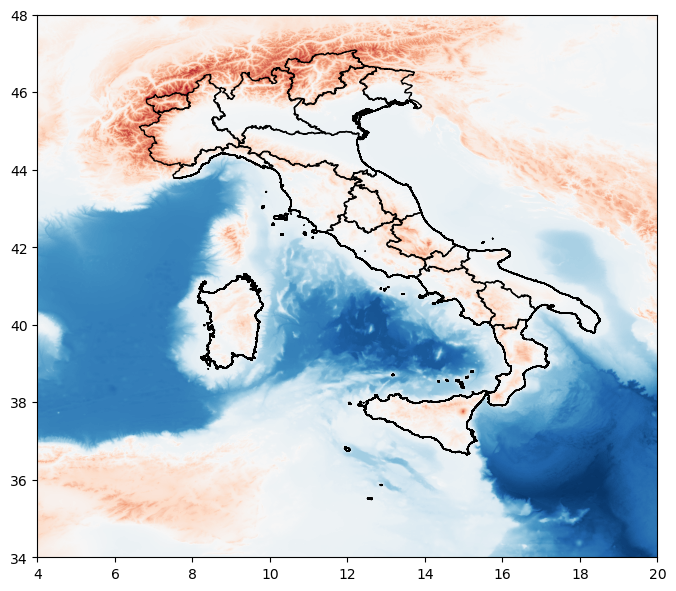

In [3]:
#gebco in folder data
h = rio.open('https://tubcloud.tu-berlin.de/s/kDYHFRtaWPKj4QZ/download/gebco_2022_n48.0_s34.0_w4.0_e20.0.tif')
band = h.read(1)
fig, ax = plt.subplots(figsize=(8,8))
italy.plot(ax=ax, color='none')
show(band, transform = h.transform, cmap='RdBu_r', ax=ax)

merge regions to 6 market zones

In [4]:
e_market = ['CSUD','SUD','SUD','CALA','CSUD',
            'NORD','NORD','CSUD','NORD','NORD',
            'CNOR','SUD','NORD','SARD','SICI',
            'CNOR','NORD','CSUD','NORD','NORD']
italy['e_market'] = e_market

italy_geom = italy.dissolve(by = 'e_market').geometry
joined = pd.concat([EEZ_italy.geometry, italy_geom])

In [5]:
EEZ_point = gpd.points_from_xy(x = [13.5], y = [44.0], z=None, crs= "EPSG:4326")
EEZ_point = gpd.GeoSeries(EEZ_point).rename(index = {0:'EEZ'})

points = italy_geom.representative_point()
points = pd.concat([points, EEZ_point])

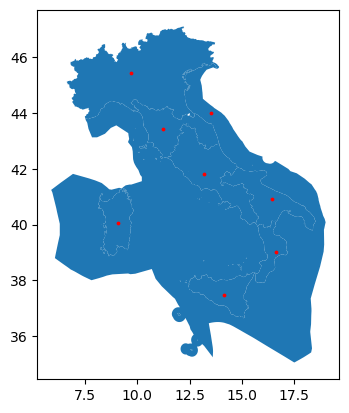

In [6]:
fig, ax = plt.subplots()
joined.plot(ax=ax)
points.plot(ax=ax, color='red', markersize=3);

In [7]:
minx, miny, maxx, maxy = italy.total_bounds
buffer = 0.25

In [2]:
cutout = atlite.Cutout(
   path="test_ITA.nc",
   module="era5",
   x=slice(minx-buffer, maxx+buffer),
   y=slice(miny-buffer, maxy+buffer),
   time="2013",
)

NameError: name 'minx' is not defined

In [2]:
cutout = atlite.Cutout('/Users/jeremykurniawan/Desktop/RES/ESM/Assignments/Groupwork/Data/test_ITA.nc')

TypeError: Arguments 'time' and 'module' must be specified. Spatial bounds must either be passed via argument 'bounds' or 'x' and 'y'.

In [11]:
cutout.prepare()

2023-02-05 08:50:35,979 INFO Cutout already prepared.


<Cutout "test_ITA">
 x = 6.50 ⟷ 18.75, dx = 0.25
 y = 35.25 ⟷ 47.25, dy = 0.25
 time = 2013-01-01 ⟷ 2013-12-31, dt = H
 module = era5
 prepared_features = ['height', 'wind', 'influx', 'temperature', 'runoff']

# **2.** Renewable Potentials

Renewable potentials should be computed for solar PV, onshore wind and, where applicable, offshore wind. The preparation consists of two main components.

First, perform a **land eligibility analysis** like in previous assignments based on the criteria listed in the table below. Make your own judgement about which land cover classes would be suitable.

Second, using atlite download **historical weather data** from the ERA5 dataset into an atlite.Cutout as shown in the lecture for a year of your choice and the geographical bounds of your selected country (add a buffer of 0.25 degrees).

Then, together with the availability matrix and the corresponding atlite conversion functions, calculate the **wind and solar capacity factor time series** per modelled region.
- For onshore wind, use a "Vestas_V112_3MW" as reference turbine.
- For offshore wind, use a "NREL_ReferenceTurbine_5MW_offshore" as reference turbine. 
- For solar, use a "CdTe" solar panel with optimal latitude orientation.
- For both wind and solar, assume a deployment density of 3 MW/km2.

## **2.1** Land eligibility analysis

In [12]:
raster = rio.open('https://tubcloud.tu-berlin.de/s/567ckizz2Y6RLQq/download?path=%2Fcopernicus-glc&files=PROBAV_LC100_global_v3.0.1_2019-nrt_Discrete-Classification-map_EPSG-4326-IT.tif')

In [13]:
def plot_le(masked, transform, shape):
    fig, ax = plt.subplots(figsize=(10,10))
    ax = show(masked, transform=transform, cmap='Greens', vmin=0, ax=ax)
    shape.plot(ax=ax, edgecolor='k', color='None', linewidth=1)

### **2.1.1.** Onshore wind land eligibility analysis

- 10 km distance to airports </br>
- 300 m distance to major roads </br>
- no natural protection areas </br>
- maximum elevation of 2000 m The data for it is in folder elevation raster data</br>
- 1000 m to built up areas (code 50 in the copernicus cover classes)</br>
- only on suitable land cover classes:</br>
    - 20: shrubs
    - 30: herbacious vegetation
    - 40: cultivated and managed vegetation/agriculture (cropland)
    - 60: bare / sparse vegetation


2023-02-05 08:50:55,587 WARNING File /vsimem/090bee630dfe4c6b9653f5795e98c4ec has GPKG application_id, but non conformant file extension
2023-02-05 08:51:09,199 WARNING File /vsimem/813bec5004834bdbaee371b4360a8bd8 has GPKG application_id, but non conformant file extension


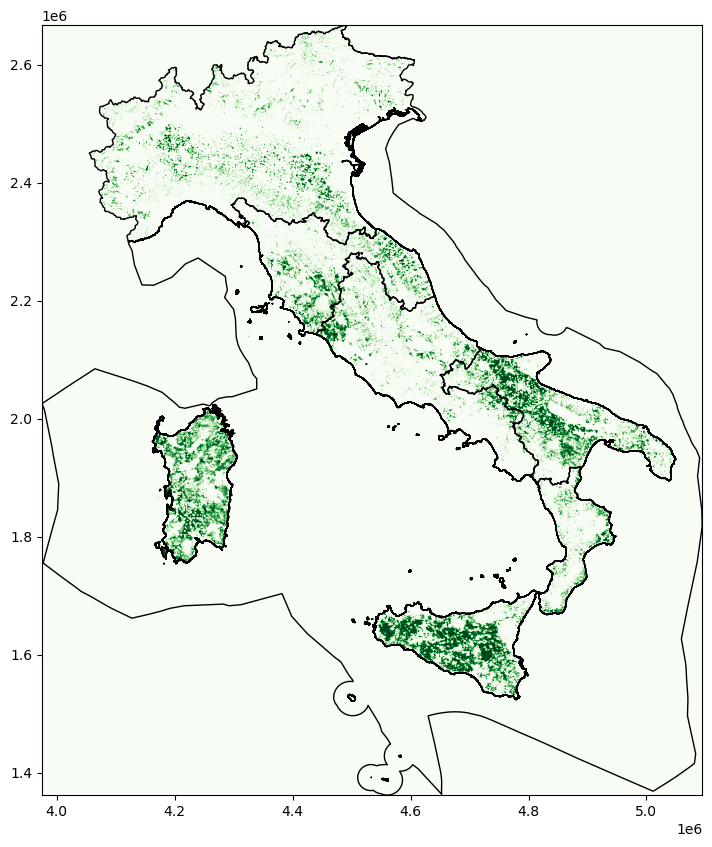

In [14]:
excluder_on = ExclusionContainer(crs=3035, res=300)

#road exclusion
excluder_on.add_geometry("https://tubcloud.tu-berlin.de/s/567ckizz2Y6RLQq/download?path=%2F&files=ne_10m_roads.gpkg", buffer=300)

#EEZ exclusion
excluder_on.add_geometry(EEZ_italy)

#airport
excluder_on.add_geometry("https://tubcloud.tu-berlin.de/s/567ckizz2Y6RLQq/download?path=%2F&files=ne_10m_airports.gpkg", buffer=10000)

#copernicus land cover classes
rs = rio.open('https://tubcloud.tu-berlin.de/s/567ckizz2Y6RLQq/download?path=%2Fcopernicus-glc&files=PROBAV_LC100_global_v3.0.1_2019-nrt_Discrete-Classification-map_EPSG-4326-IT.tif')
excluder_on.add_raster(rs, codes=[50], buffer=1000, crs=4326)
excluder_on.add_raster(rs, codes=[20,30,40,60], crs=4326, invert=True)

#natural protection areas
wdpa = rio.open('https://tubcloud.tu-berlin.de/s/567ckizz2Y6RLQq/download?path=%2Fwdpa&files=WDPA_Oct2022_Public_shp-ITA.tif')
excluder_on.add_raster(wdpa, crs=3035)
#excluder.add_raster(wdpa, codes=func, crs=4326, nodata=-1000, invert=True)
#idk what this is

#Elevation constraint
h_incl = [] #included elevations

for i in np.unique(band):
    if ((i <= 2000) and (i>=0)):
        h_incl.append(i)
        
excluder_on.add_raster(h, codes = h_incl, invert=True, crs= 4326)

masked_on, transform = shape_availability(joined.to_crs(3035).geometry, excluder_on)
plot_le(masked_on, transform, joined.to_crs(3035).geometry)

### **2.1.2.** PV (rooftop and utility) land eligibility analysis

constraints: </br>
- suitable land cover classes </br>
- no natural protection areas </br>
- no roads (buffer 100m) or airports (buffer 5km).
- suitable land cover classes: </br>
    - 20: shrubs
    - 30: herbacious vegetation
    - 40: cultivated and managed vegetation/agriculture (cropland)
    - 60: bare / sparse vegetation
    - 50: urban areas (for rooftop pv applications)



2023-02-05 08:52:12,135 WARNING File /vsimem/426f48ab72b247cfabcb7410b5108c73 has GPKG application_id, but non conformant file extension
2023-02-05 08:52:24,762 WARNING File /vsimem/42e5cc1f7c834a6d8d8e7607b39118fe has GPKG application_id, but non conformant file extension


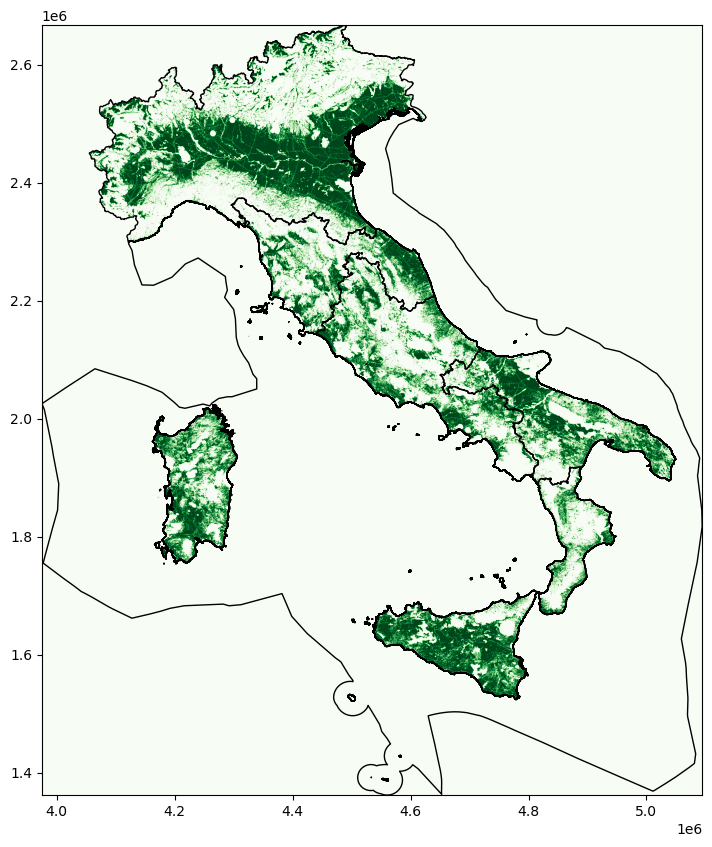

In [15]:
excluder_pv = ExclusionContainer(crs=3035, res=300)

#suitable Land cover classes
excluder_pv.add_raster(rs, codes=[20,30,40,50,60], crs=4326, invert=True)

#EEZ exclusion
excluder_pv.add_geometry(EEZ_italy)

#Exclusion nat protection
excluder_pv.add_raster(wdpa, crs=3035)

#road exclusion
excluder_pv.add_geometry("https://tubcloud.tu-berlin.de/s/567ckizz2Y6RLQq/download?path=%2F&files=ne_10m_roads.gpkg", buffer = 100)

#airport
excluder_pv.add_geometry("https://tubcloud.tu-berlin.de/s/567ckizz2Y6RLQq/download?path=%2F&files=ne_10m_airports.gpkg", buffer = 5000)

masked_pv, transform = shape_availability(joined.to_crs(3035).geometry, excluder_pv)
plot_le(masked_pv, transform, joined.to_crs(3035).geometry)

### **2.1.3.** Offshore wind land eligibility analysis

contraints:
- within EEZ
- up to water depth of 50m
- no natural protection areas
- 10km minimum distance to shore

2023-02-05 08:53:10,719 WARNING File /vsimem/67827aa977f14868958b22150722a823 has GPKG application_id, but non conformant file extension


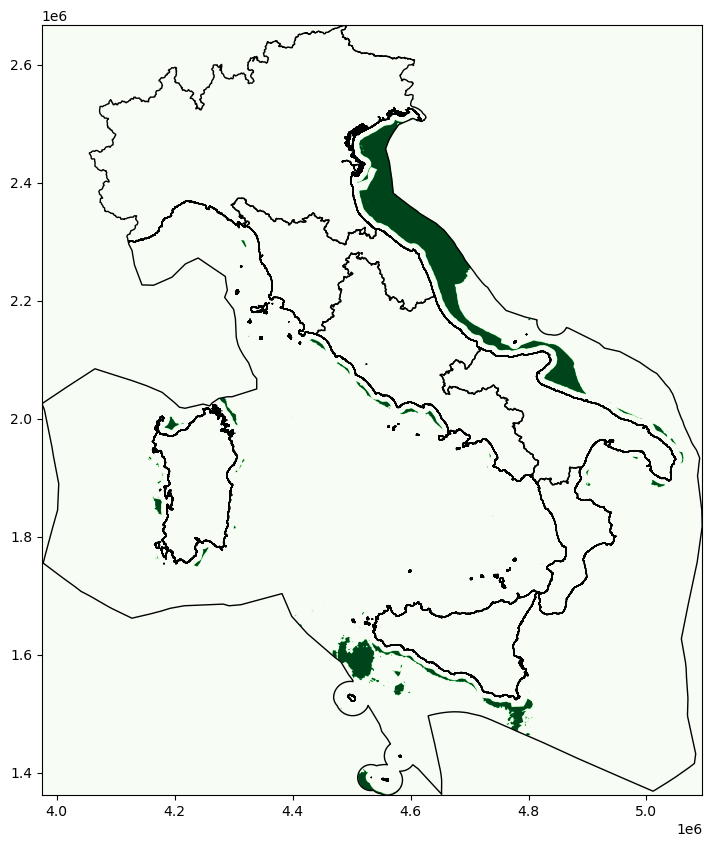

In [16]:
excluder_off = ExclusionContainer(crs=3035, res=300)

#10km distance to shore
excluder_off.add_geometry("https://tubcloud.tu-berlin.de/s/567ckizz2Y6RLQq/download?path=%2Fgadm&files=gadm_410-levels-ADM_1-ITA.gpkg", buffer = 10000)

#Exclusion nat protection
excluder_off.add_raster(wdpa, crs=3035)

#water depth <=100
h_off = []
for i in np.unique(band):
    if i < -100:
        h_off.append(i)
        
excluder_off.add_raster(h, codes = h_off, crs= 4326)

masked_off, transform = shape_availability(joined.to_crs(3035).geometry, excluder_off)
plot_le(masked_off, transform, joined.to_crs(3035).geometry)

available onwind, offwind and solar potential in each region as a dictionary

In [17]:
potential_on = {}
potential_off = {}
potential_pv = {}
excluder =[excluder_on, excluder_pv, excluder_off]
for j in excluder:
    for i in joined.index:
        shape_region = joined.loc[[i]].geometry.to_crs(3035)
        masked, transform = shape_availability(shape_region, j)
    
        eligible_cells= masked.sum()
        eligible_cells= eligible_cells.item()
        cell_area = j.res**2/1e6 #km2
        eligible_area=cell_area*eligible_cells #km2
        
        cap_per_sqkm = 3 #MW/km2
        max_potential = cap_per_sqkm*eligible_area #MW
        if j == excluder_on:
            potential_on["{0}".format(i)] = round(max_potential,0)
        elif j == excluder_pv:
            potential_pv["{0}".format(i)] = round(max_potential,0)
        elif j == excluder_off:
            potential_off["{0}".format(i)] = round(max_potential,0)

   **2.1.4.** Available matrix


In [18]:
joined.index

Index(['EEZ', 'CALA', 'CNOR', 'CSUD', 'NORD', 'SARD', 'SICI', 'SUD'], dtype='object')

In [19]:
#cutout = atlite.Cutout('test_ITA.nc')

In [20]:
#availability matrix onwind
A_on = cutout.availabilitymatrix(joined, excluder_on)

Compute availability matrix: 100%|████████| 8/8 [01:50<00:00, 13.80s/ gridcells]


In [21]:
#availabilty matrix offwind
A_off = cutout.availabilitymatrix(joined, excluder_off)

Compute availability matrix: 100%|████████| 8/8 [00:25<00:00,  3.19s/ gridcells]


In [22]:
#availability matrix pv
A_pv = cutout.availabilitymatrix(joined, excluder_pv)

Compute availability matrix: 100%|████████| 8/8 [01:42<00:00, 12.87s/ gridcells]


### **2.1.5.** Capacity matrix


In [23]:
#capacity matrix onwind
cap_per_sqkm = 3 #MW/km2

area = cutout.grid.set_index(['y', 'x']).to_crs(3035).area / 1e6

area = xr.DataArray(area, dims=('spatial'))

capacity_matrix_on = A_on.stack(spatial=['y', 'x']) * area * cap_per_sqkm

In [24]:
#capacity matrix pv
cap_per_sqkm = 3 #MW/km2

area = cutout.grid.set_index(['y', 'x']).to_crs(3035).area / 1e6

area = xr.DataArray(area, dims=('spatial'))

capacity_matrix_pv = A_pv.stack(spatial=['y', 'x']) * area * cap_per_sqkm

In [25]:
#capacity matrix offwind
cap_per_sqkm = 3 #MW/km2

area = cutout.grid.set_index(['y', 'x']).to_crs(3035).area / 1e6

area = xr.DataArray(area, dims=('spatial'))

capacity_matrix_off = A_off.stack(spatial=['y', 'x']) * area * cap_per_sqkm

### **2.1.6.** Capacity factors


In [26]:
pv = cutout.pv(
    panel=atlite.solarpanels.CdTe,
    matrix=capacity_matrix_pv,
    orientation='latitude_optimal',
    index=joined.index,
    per_unit=True,
)

2023-02-05 09:02:01,159 INFO Convert and aggregate 'pv'.


[########################################] | 100% Completed | 4.04 s


In [27]:
df_pv = pv.to_pandas()
df_pv.head()

dim_0,EEZ,CALA,CNOR,CSUD,NORD,SARD,SICI,SUD
time,,,,,,,,
2013-01-01 00:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2013-01-01 01:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2013-01-01 02:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2013-01-01 03:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2013-01-01 04:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<AxesSubplot: xlabel='time'>

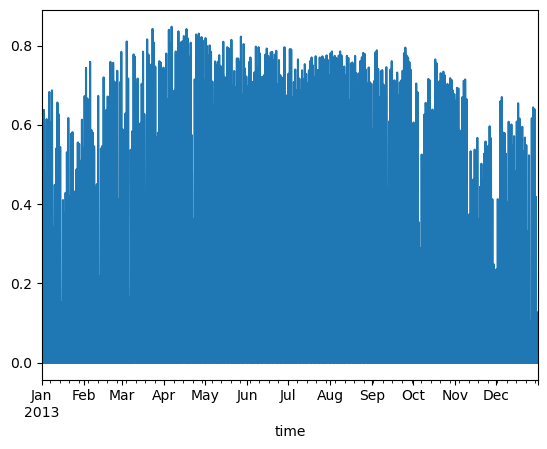

In [28]:
df_pv.iloc[:,1].plot()

In [29]:
cutout.prepare()
onwind = cutout.wind(
    atlite.windturbines.Vestas_V112_3MW,
    matrix=capacity_matrix_on,
    index=joined.index,
    per_unit=True,
)

2023-02-05 09:02:05,941 INFO Cutout already prepared.
2023-02-05 09:02:05,949 INFO Convert and aggregate 'wind'.


In [30]:
df_on = onwind.to_pandas()
df_on.head()

dim_0,EEZ,CALA,CNOR,CSUD,NORD,SARD,SICI,SUD
time,,,,,,,,
2013-01-01 00:00:00,0.0,0.000009,0.000258,0.000046,0.001853,0.016016,0.000016,0.025864
2013-01-01 01:00:00,0.0,0.000021,0.001004,0.000282,0.003610,0.013582,0.000017,0.022945
2013-01-01 02:00:00,0.0,0.000045,0.003785,0.001117,0.003217,0.010605,0.000022,0.017683
2013-01-01 03:00:00,0.0,0.000084,0.007001,0.001582,0.001947,0.009063,0.000039,0.014034
2013-01-01 04:00:00,0.0,0.000081,0.012931,0.002454,0.001218,0.009341,0.000185,0.010414


<AxesSubplot: xlabel='time'>

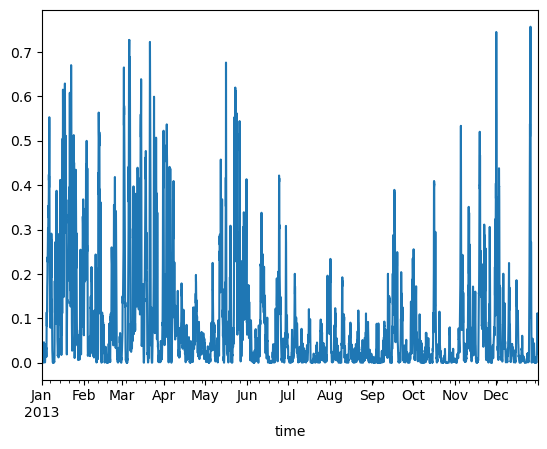

In [31]:
df_on.iloc[:,1].plot()

In [32]:
cutout.prepare()
offwind = cutout.wind(
    atlite.windturbines.NREL_ReferenceTurbine_5MW_offshore,
    matrix=capacity_matrix_off,
    index=joined.index,
    per_unit=True,
)

2023-02-05 09:02:07,216 INFO Cutout already prepared.
2023-02-05 09:02:07,226 INFO Convert and aggregate 'wind'.


In [33]:
df_off = offwind.to_pandas()
df_off.head()

dim_0,EEZ,CALA,CNOR,CSUD,NORD,SARD,SICI,SUD
time,,,,,,,,
2013-01-01 00:00:00,0.041426,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2013-01-01 01:00:00,0.032546,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2013-01-01 02:00:00,0.024645,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2013-01-01 03:00:00,0.023863,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2013-01-01 04:00:00,0.021411,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<AxesSubplot: xlabel='time'>

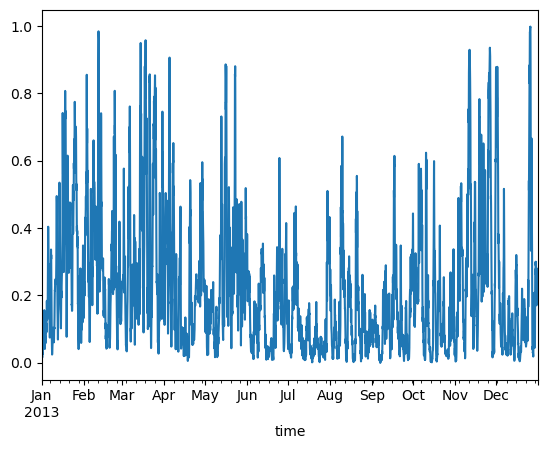

In [34]:
df_off.iloc[:,0].plot()

# **3.** PyPSA model

## **3.1.** Costs

At first we set the costs:

In [379]:
year = 2030
url = f"https://raw.githubusercontent.com/PyPSA/technology-data/master/outputs/costs_{year}.csv"
costs = pd.read_csv(url, index_col=[0,1])
costs
costs.loc[costs.unit.str.contains("/kW"), "value"] *= 1e3
costs.unit = costs.unit.str.replace("/kW", "/MW")

defaults = {
    "FOM": 0,
    "VOM": 0,
    "efficiency": 1,
    "fuel": 0,
    "investment": 0,
    "lifetime": 25,
    "CO2 intensity": 0,
    "discount rate": 0.07,
}
costs = costs.value.unstack().fillna(defaults)

#costs.loc["gas",:] = costs.loc["OCGT",:] # we assume gas is OCGT

costs.at["gas","investment"] = costs.at["OCGT","investment"]
costs.at["gas","fuel"] = costs.at["OCGT","fuel"]
costs.at["gas","FOM"] = costs.at["OCGT","FOM"]
costs.at["gas","VOM"] = costs.at["OCGT","VOM"]
costs.at["gas","efficiency"] = costs.at["OCGT","efficiency"]

costs.loc["geothermal","CO2 intensity"] = 0 # otherwise we don't get the 0 emission scenario

Let's also write a small utility function that calculates the **annuity** to annualise investment costs. The formula is

$$
a(r, n) = \frac{r}{1-(1+r)^{-n}}
$$
where $r$ is the discount rate and $n$ is the lifetime.

In [380]:
def annuity(r, n):
    return r / (1.0 - 1.0 / (1.0 + r) ** n)

Based on this, we can calculate the short-term marginal generation costs (STMGC, €/MWh):

In [491]:
costs.fuel.coal

8.15

In [382]:
costs["marginal_cost"] = costs["VOM"] + costs["fuel"] / costs["efficiency"]

and the annualised investment costs (`capital_cost` in PyPSA terms, €/MW/a):

In [383]:
annuity = costs.apply(lambda x: annuity(x["discount rate"], x["lifetime"]), axis=1)

In [384]:
costs["capital_cost"] = (annuity + costs["FOM"] / 100) * costs["investment"]

Now we set the geometry and the resolution:

In [385]:
resolution = 3 # hours

following cell irrelevant if same cell in chapter 1. is corrected:

2023-02-05 10:47:21,710 WARNING File /vsimem/9954fd840ac74da182f763bfc51e3119 has GPKG application_id, but non conformant file extension


<AxesSubplot: >

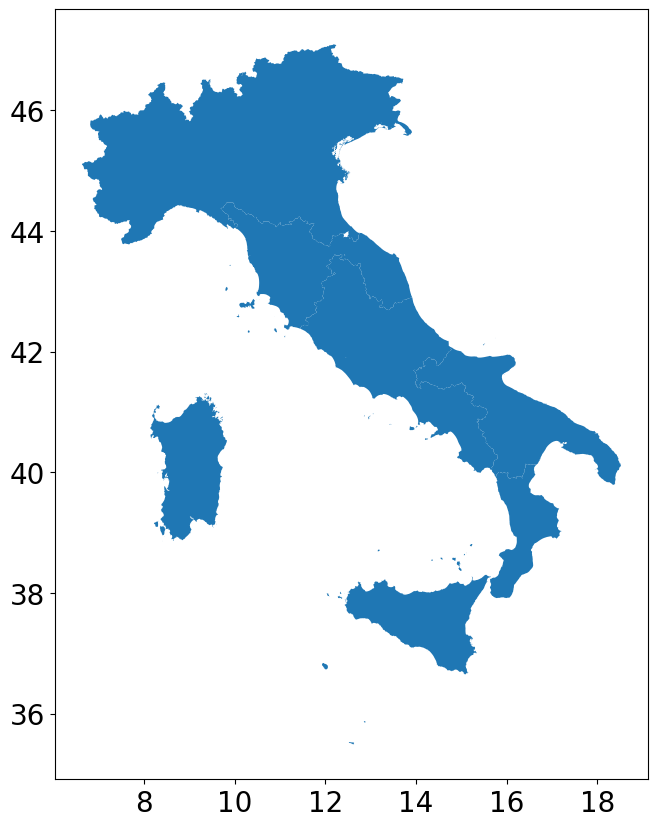

In [386]:
italy = gpd.read_file("https://tubcloud.tu-berlin.de/s/567ckizz2Y6RLQq/download?path=%2Fgadm&files=gadm_410-levels-ADM_1-ITA.gpkg")

e_market = ['CSUD','SUD','SUD','CALA','CSUD',
            'NORD','NORD','CSUD','NORD','NORD',
            'CNOR','SUD','NORD','SARD','SICI',
            'CNOR','NORD','CSUD','NORD','NORD']
italy['e_market'] = e_market

italy_geom = italy.dissolve(by = 'e_market').geometry

italy_geom.plot(figsize = (10,10))

We will need this function for analyzing the results:

In [387]:
def system_cost(n): #n.statistics.capex()
    tsc = n.statistics.capex() + n.statistics.opex()
    return tsc.droplevel(0).div(1e6) # million €/a

## **3.2.** Model Settings

In [388]:
n = pypsa.Network()

### **3.2.1** Loads and busses

The load profile of Italy is downloaded and splited through out the regions according to thier population. The snapshots are set for year 2030 and under consideration of `resolution`: 

In [389]:
df_popul = pd.read_csv("https://tubcloud.tu-berlin.de/s/tNoS6SD5aAMKy3s/download/italy-population.csv",parse_dates=[0],index_col=0)
df_popul.loc["EEZ","Population"] = 0
df_popul["Share"] = df_popul["Population"] / df_popul["Population"].sum()

df_load_raw = pd.read_csv("https://tubcloud.tu-berlin.de/s/DiWBzKrsGqn8JCJ/download/load.csv",parse_dates=[0],index_col=0)
time_index = pd.date_range('2030-01-01 00:00:00', '2030-12-31 23:00:00', freq='H')
df_load_raw.index = time_index
df_load = pd.DataFrame(index=time_index, data={"Load": df_load_raw["IT"]}) # we neglect that the 01/01/2030 may be another day of the week as in 2013 (reference year)

for reg in joined.index:
    df_load[f"Load {reg}"] = df_load["Load"] * df_popul.loc[reg, "Share"]

df_load = df_load.resample(f"{resolution}H").first()

n.set_snapshots(df_load.index)

n.snapshot_weightings.loc[:,:] = resolution

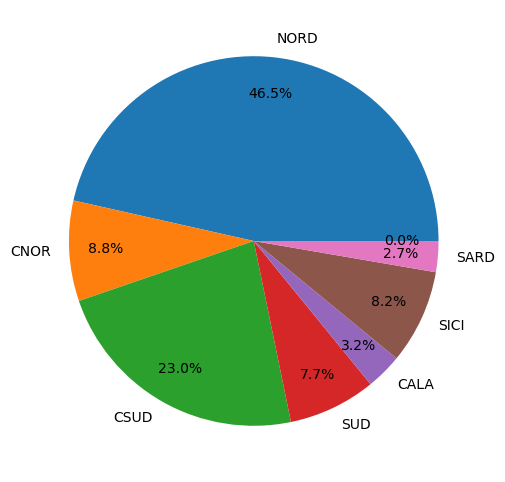

In [390]:
plt.rcParams.update({'font.size': 10})

fig = df_popul.Share.plot(kind="pie",
                            figsize=(6,6),
                            autopct='%1.1f%%',
                            radius=1,
                            pctdistance=0.8)
fig.set_ylabel("")
plt.show()

In [391]:
df_load.head(5)

,Load,Load EEZ,Load CALA,Load CNOR,Load CSUD,Load NORD,Load SARD,Load SICI,Load SUD
2030-01-01 00:00:00,33267.409791,0.0,1052.338473,2921.065131,7641.944199,15462.045126,900.316457,2741.268745,2548.431659
2030-01-01 03:00:00,31708.348537,0.0,1003.021133,2784.170811,7283.808138,14737.423774,858.123557,2612.800496,2429.000628
2030-01-01 06:00:00,43637.576697,0.0,1380.375001,3831.623938,10024.102513,20281.897037,1180.964455,3595.781152,3342.832601
2030-01-01 09:00:00,47841.985349,0.0,1513.371859,4200.794594,10989.908283,22236.024417,1294.748435,3942.228745,3664.909017
2030-01-01 12:00:00,47029.042448,0.0,1487.656268,4129.413649,10803.165031,21858.184365,1272.747748,3875.241415,3602.633972


We start creating the network.

We busses are added:

In [392]:
n.add("Bus", "NORD", y=points.loc["NORD"].y, x=points.loc["NORD"].x, v_nom=400, carrier='AC')
n.add("Bus", "CNOR", y=points.loc["CNOR"].y, x=points.loc["CNOR"].x, v_nom=400, carrier='AC')
n.add("Bus", "CSUD", y=points.loc["CSUD"].y, x=points.loc["CSUD"].x, v_nom=400, carrier='AC')
n.add("Bus", "SUD",  y=points.loc["SUD"].y,  x=points.loc["SUD"].x,  v_nom=400, carrier='AC')
n.add("Bus", "CALA", y=points.loc["CALA"].y, x=points.loc["CALA"].x, v_nom=400, carrier='AC')
n.add("Bus", "SICI", y=points.loc["SICI"].y, x=points.loc["SICI"].x, v_nom=400, carrier='AC')
n.add("Bus", "SARD", y=points.loc["SARD"].y, x=points.loc["SARD"].x, v_nom=400, carrier='AC')
n.add("Bus", "EEZ", y=points.loc["EEZ"].y, x=points.loc["EEZ"].x, v_nom=400, carrier='AC')

The transmission lines are added (numbers are estimated - close to reality - and not used):

In [393]:
transmissions = {
    "NORD-->CNOR": 5000,
    "CNOR-->CSUD": 5000,
    "CSUD-->SUD": 5000,
    "SUD-->CALA": 1500,
    "CALA-->SICI": 1000,
    "SARD-->CSUD": 1500,
    "EEZ-->NORD":1500
}

The load profiles are added:

In [394]:
for region in joined.index:
    n.add("Load",
        f"{region} demand",
        bus=region,
        carrier='electricity',
        p_set=df_load[f"Load {region}"],
    )

The carriers are added:

In [395]:
carriers = ["coal", "gas", "oil", "hydro", "onwind", "offwind", "solar", "geothermal", "biomass", "nuclear", "hydrogen", "battery"]
emissions = []
for carr in ["coal", "gas", "oil", "hydro", "onwind", "offwind", "solar", "geothermal", "biomass", "nuclear"]:
    emissions.append(costs.at[carr, "CO2 intensity"])
emissions.append(0)
emissions.append(0)

In [396]:
n.madd(
    "Carrier",
    carriers, 
    co2_emissions=emissions,
    nice_name=["Coal", "Gas", "Oil", "Hydro", "Onshore Wind", "Offshore Wind", "Solar", "Geothermal", "Biomass", "Nuclear", "Hydrogen storage underground", "Battery storage"],
    color=["grey", "indianred", "black", "blue", "dodgerblue", "aquamarine", "gold", "yellow", "darkgreen", "orangered", "magenta", "yellowgreen"],
)

Index(['coal', 'gas', 'oil', 'hydro', 'onwind', 'offwind', 'solar',
       'geothermal', 'biomass', 'nuclear', 'hydrogen', 'battery'],
      dtype='object')

<Figure size 640x480 with 0 Axes>

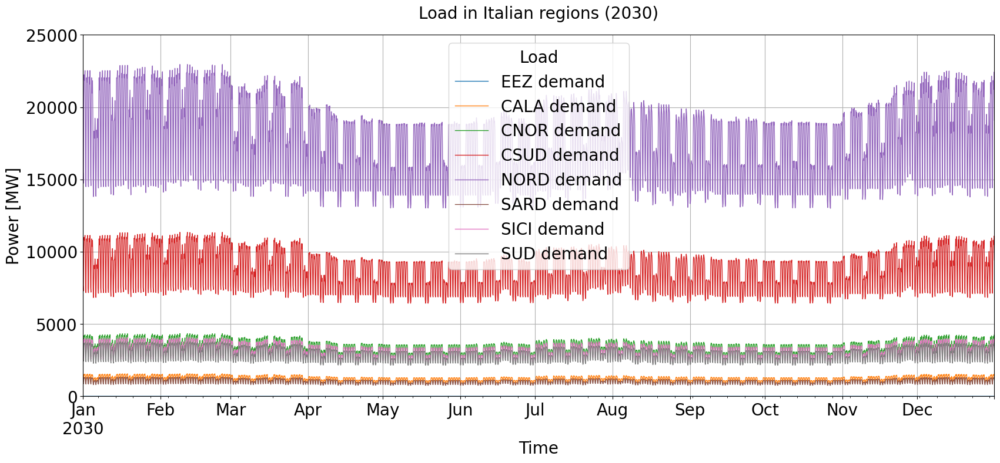

In [397]:
#n.loads_t.p_set.plot(figsize=(6,2), ylabel="MW")

plt.figure()
plt.rcParams.update({'font.size': 20})

fig = (n.loads_t.p_set).plot(figsize=(20,8),linewidth=1,grid=True)
fig.set_ylabel('Power [MW]')
fig.set_xlabel('Time')
fig.set_ylim(0,25000)
fig.tick_params(labelsize=20)
titel='Load in Italian regions (2030)'
fig.set_title(titel,pad=20, fontdict={'fontsize':20})
plt.show()

Oil, Gas, Hydropower and Geothermal power plants are downloaded and aggregated according to the regions:

### **3.2.3.** Generators

Gas, oil, coal, hydropower and geothermal generators are added according to the real data (2021):

In [398]:
df_power_plants = pd.read_csv("https://tubcloud.tu-berlin.de/s/5FRTDFqcKT9aMYb/download/global_power_plant_database.csv")
df_power_plants = df_power_plants[df_power_plants["country_long"]=="Italy"]
geometry = gpd.points_from_xy(df_power_plants.longitude,df_power_plants.latitude)
gdf_power_plants = gpd.GeoDataFrame(df_power_plants, geometry=geometry, crs=4326)

We aggregate the capacities for the regions:

In [399]:
gdf_power_plants_agg = gpd.sjoin(gdf_power_plants, italy, how="left", op='intersects')
gdf_power_plants_agg = gdf_power_plants_agg.groupby(['e_market','primary_fuel']).agg({'capacity_mw':'sum'})
gdf_power_plants_agg = gdf_power_plants_agg.query("primary_fuel in ('Oil', 'Gas', 'Hydro','Geothermal','Coal')")
gdf_power_plants_agg

capacity_mw
e_market primary_fuel             
CALA     Gas               3154.00
         Hydro              571.44
         Oil               1200.00
CNOR     Gas                630.00
         Geothermal         724.00
         Hydro              557.00
         Oil               1590.00
CSUD     Coal              2130.00
         Gas               9565.00
         Hydro             1663.00
NORD     Coal              2612.00
         Gas              17470.35
         Hydro             9689.74
         Oil               4325.70
SARD     Coal               990.00
         Gas                630.00
         Hydro              240.00
         Oil                497.00
SICI     Gas               3362.30
         Hydro              580.00
         Oil               1216.00
SUD      Coal              3280.00
         Gas               3479.00
         Hydro               83.00

We use the data from Terna (https://www.terna.it/en/electric-system/transparency-report/actual-generation) for the year 2022 for geothermal and hydropower:

In [400]:
df_terna_raw = pd.read_csv("https://tubcloud.tu-berlin.de/s/DE2HdGtRtmYzt5x/download/gen-italy-2022.csv",parse_dates=[0],index_col=0)
df_terna = pd.DataFrame(index=df_terna_raw.index)
df_terna["hydro"] = df_terna_raw[df_terna_raw["Primary Source"]=="Hydro"]["Actual Generation (GWh)"]
df_terna["geothermal"] = df_terna_raw[df_terna_raw["Primary Source"]=="Geothermal"]["Actual Generation (GWh)"]
df_terna = df_terna.resample("H").mean()
df_terna.index = time_index
df_terna = df_terna.resample(f"{resolution}H").first()
df_terna = df_terna*1000 # MW
df_terna

,hydro,geothermal
2030-01-01 00:00:00,2820.0,640.0
2030-01-01 03:00:00,2000.0,640.0
2030-01-01 06:00:00,2110.0,650.0
2030-01-01 09:00:00,2510.0,650.0
2030-01-01 12:00:00,2390.0,650.0
...,...,...
2030-12-31 09:00:00,2900.0,620.0
2030-12-31 12:00:00,2080.0,620.0
2030-12-31 15:00:00,2130.0,620.0
2030-12-31 18:00:00,5370.0,620.0


Hydropower and geothermal are considered to be constant over the year:

In [401]:
df_terna.geothermal.mean()

621.5582191780821

In [402]:
df_terna.hydro.mean()

3336.1061643835615

These mean capacities are for whole Italy. The power is noW split into regions according to the installed capacities:

In [403]:
df_constant_gen = pd.DataFrame(index=italy_geom.index)
for tech in ["Hydro","Geothermal"]:
    for region in italy_geom.index:
        #df_constant_gen[tech] = gdf_power_plants_agg.loc[region,tech].get([region,tech], 0)
        if 'Hydro' in list(gdf_power_plants_agg.loc[region].index):
            df_constant_gen.loc[region,'hydro'] = gdf_power_plants_agg.loc[region,'Hydro'].values / gdf_power_plants_agg.groupby("primary_fuel").sum().loc["Hydro"].values * df_terna.hydro.mean()
        else:
            df_constant_gen.loc[region,'hydro'] = 0

        if 'Geothermal' in list(gdf_power_plants_agg.loc[region].index):
            df_constant_gen.loc[region,'geothermal'] = gdf_power_plants_agg.loc[region,'Geothermal'].values / gdf_power_plants_agg.groupby("primary_fuel").sum().loc["Geothermal"].values * df_terna.geothermal.mean()
        else:
            df_constant_gen.loc[region,'geothermal'] = 0

In [404]:
for region in italy_geom.index:
    n.add(
        "Generator",
        f"hydro {region}",
        bus=region,
        carrier="hydro",
        p_nom=df_constant_gen.loc[region,"hydro"],
        capital_cost=0,
        marginal_cost=costs.at["hydro", "marginal_cost"],
        efficiency=costs.at["hydro", "efficiency"],
        p_nom_extendable=False,
    )

In [405]:
n.add(
    "Generator",
    "geothermal CNOR",
    bus="CNOR",
    carrier="geothermal",
    p_nom=df_constant_gen.loc["CNOR","geothermal"],
    capital_cost=0,
    marginal_cost=costs.at["geothermal", "marginal_cost"],
    efficiency=costs.at["geothermal", "efficiency"],
    p_nom_extendable=False,
)

Coal, gas, oil, hydropower and geothermal have no capital costs (since they already exist) and their capacity is not extendable:

In [406]:
gdf_power_plants_agg = gdf_power_plants_agg.rename(index={'Gas': 'gas'})
gdf_power_plants_agg = gdf_power_plants_agg.rename(index={'Oil': 'oil'})
gdf_power_plants_agg = gdf_power_plants_agg.rename(index={'Coal': 'coal'})
gdf_power_plants_agg = gdf_power_plants_agg.rename(index={'Hydro': 'hydro'})
gdf_power_plants_agg = gdf_power_plants_agg.rename(index={'Geothermal': 'geothermal'})

In [407]:
for region in italy_geom.index:
    for tech in [x for x in ['coal','gas','oil'] if x in gdf_power_plants_agg.loc[region].index]:
        n.add(
            "Generator",
            f"{tech} {region}",
            bus=region,
            carrier=tech,
            p_nom = gdf_power_plants_agg.loc[region,tech]["capacity_mw"],
            marginal_cost=costs.at[tech, "marginal_cost"],
            efficiency=costs.at[tech, "efficiency"],
            p_nom_extendable=False,
        )

Now we adapt the capacity factor matrices from the land egilibility to the needs of the model in Pypsa:

In [408]:
cf_pv = df_pv.copy()
cf_pv = cf_pv.resample(f"{resolution}H").first()
cf_pv.index = df_load.index
cf_pv.head(4)

dim_0,EEZ,CALA,CNOR,CSUD,NORD,SARD,SICI,SUD
2030-01-01 00:00:00,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
2030-01-01 03:00:00,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
2030-01-01 06:00:00,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
2030-01-01 09:00:00,0.0,0.416208,0.316561,0.369929,0.232981,0.256222,0.372819,0.45498


In [409]:
cf_off = df_off.copy()
cf_off = cf_off.resample(f"{resolution}H").first()
cf_off.index = df_load.index
cf_off.head(4)

dim_0,EEZ,CALA,CNOR,CSUD,NORD,SARD,SICI,SUD
2030-01-01 00:00:00,0.041426,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2030-01-01 03:00:00,0.023863,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2030-01-01 06:00:00,0.016619,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2030-01-01 09:00:00,0.022596,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [410]:
cf_on = df_on.copy()
cf_on = cf_on.resample(f"{resolution}H").first()
cf_on.index = df_load.index
cf_on.head(4)

dim_0,EEZ,CALA,CNOR,CSUD,NORD,SARD,SICI,SUD
2030-01-01 00:00:00,0.0,0.000009,0.000258,0.000046,0.001853,0.016016,0.000016,0.025864
2030-01-01 03:00:00,0.0,0.000084,0.007001,0.001582,0.001947,0.009063,0.000039,0.014034
2030-01-01 06:00:00,0.0,0.000046,0.022503,0.007544,0.002069,0.016451,0.000279,0.005927
2030-01-01 09:00:00,0.0,0.000003,0.039670,0.021071,0.003408,0.024137,0.000265,0.006980


We add onshore, offshore and solar generators wiht their capacity factories:

PV:

In [411]:
for region in joined.index:
    if region != 'EEZ':
        n.add(
            "Generator",
            f"solar {region}",
            bus=region,
            carrier="solar",
            p_max_pu=cf_pv[region],
            capital_cost=costs.at["solar", "capital_cost"],
            marginal_cost=costs.at["solar", "marginal_cost"],
            efficiency=costs.at["solar", "efficiency"],
            p_nom_extendable=True,
            p_nom_max=potential_pv[region]
        )

Onshore:

In [412]:
for region in joined.index:
    if region != 'EEZ':
        n.add(
            "Generator",
            f"onwind {region}",
            bus=region,
            carrier="onwind",
            p_max_pu=cf_on[region],
            capital_cost=costs.at["onwind", "capital_cost"],
            marginal_cost=costs.at["onwind", "marginal_cost"],
            efficiency=costs.at["onwind", "efficiency"],
            p_nom_extendable=True,
            p_nom_max=potential_on[region]
         )

Offwind

In [413]:
for region in joined.index:
    if region == "EEZ":
        n.add(
            "Generator",
            f"offwind {region}",
            bus=region,
            carrier="offwind",
            p_max_pu=cf_off[region],
            capital_cost=costs.at["offwind", "capital_cost"],
            marginal_cost=costs.at["offwind", "marginal_cost"],
            efficiency=costs.at["offwind", "efficiency"],
            p_nom_extendable=True,
            p_nom_max=potential_off[region]
        )

### **3.2.4.** Storages

We add storage units:

In [414]:
cap_hours = 6 # given assumption

for region in italy_geom.index:
    n.add(
        "StorageUnit",
        f"battery storage {region}",
        bus=region,
        carrier="battery storage",
        max_hours=cap_hours,
        capital_cost=costs.at["battery inverter", "capital_cost"] + cap_hours * costs.at["battery storage", "capital_cost"],
        efficiency_store=costs.at["battery inverter", "efficiency"],
        efficiency_dispatch=costs.at["battery inverter", "efficiency"],
        p_nom_extendable=True,
        cyclic_state_of_charge=True,
    )

In [415]:
cap_hours = 504 # given assumption

capital_costs = (
    costs.at["electrolysis", "capital_cost"] +
    costs.at["fuel cell", "capital_cost"] +
    cap_hours * costs.at["hydrogen storage underground", "capital_cost"]
)

for region in italy_geom.index:
    n.add(
        "StorageUnit",
        f"hydrogen storage underground {region}",
        bus=region,
        carrier="hydrogen storage underground",
        max_hours=cap_hours,
        capital_cost=capital_costs,
        efficiency_store=costs.at["electrolysis", "efficiency"],
        efficiency_dispatch=costs.at["fuel cell", "efficiency"],
        p_nom_extendable=True,
        cyclic_state_of_charge=True,
    )

### **3.2.5.** Transmission lines

We add a transmission as controllable `Link` between SICI and CSUD:


In [416]:
from geopy.distance import geodesic

def km_distance(p1, p2):
    distance = geodesic((p1.y, p1.x), (p2.y, p2.x)).km
    return distance

In [417]:
for line in transmissions.keys():
    region0 = line.split("-->")[0]
    region1 = line.split("-->")[1]
    if region0 == "EEZ":
        n.add("Link",
            line,
            bus0=region0,
            bus1=region1,
            p_min_pu=0, 
            p_nom_extendable=True,
            length=1.5*km_distance(points[region0],points[region1]), # +50% the direct length
            capital_cost=400*1.5*km_distance(points[region0],points[region1]),
    )
    elif region0 != 'EEZ':
        n.add("Link",
            line,
            bus0=region0,
            bus1=region1,
            p_min_pu=-1, 
            p_nom_min=transmissions[line],
            p_nom_extendable=True,
            length=1.5*km_distance(points[region0],points[region1]), # +50% the direct length
            capital_cost=400*1.5*km_distance(points[region0],points[region1]),
    )

# **4.** Investigation

#### At first we define some functions for plots and tables:

In [418]:
def inst_cap_plot():

    capacities = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()

    plt.rcParams.update({'font.size': 16})

    fig = plt.figure(figsize=(17,17))
    ax = plt.axes(projection=ccrs.EqualEarth())

    n.plot(
        ax=ax,
        margin=0.3,
        bus_sizes= capacities / 1e5,
        title=f"Installed power capacities in Italy in {year}"
    )

    add_legend_patches(
        ax,
        n.carriers.color,
        n.carriers.index,
        legend_kw=dict(frameon=False, bbox_to_anchor=(0,1))
    )

    return capacities

In [419]:
def inst_cap_table(colors):

    capacities = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
    capacities.fillna(0, inplace=True)

    plt.figure()
    plt.rcParams.update({'font.size': 16})

    (capacities.unstack()/1000).plot.bar(figsize=(17,10),
                                stacked=True,
                                color=colors,
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                title=f"Installed power capacity in Italy in {year}"
    )

    plt.show()

In [420]:
def gen_power_plot():

    df_tot_generation = n.generators_t.p.resample("Y").mean()*8760/1000 # GWh/a

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)
    for region in joined.index:
        for tech in carriers:
            key = f"{tech} {region}"
            if key in df_tot_generation.columns:
                try:
                    generations.loc[region, tech] = df_tot_generation[key].mean()
                except KeyError:
                    pass

    generations.fillna(0, inplace=True)

    plt.rcParams.update({'font.size': 16})

    fig = plt.figure(figsize=(17,17))
    ax = plt.axes(projection=ccrs.EqualEarth())

    n.plot(
        ax=ax,
        margin=0.3,
        bus_sizes=generations / 15e4,
        title=f"Generated electricity in Italy in {year}"
    )

    add_legend_patches(
        ax,
        n.carriers.color,
        n.carriers.index,
        legend_kw=dict(frameon=False, bbox_to_anchor=(0,1))
    )

    plt.show()

    generations.fillna(0,inplace=True)

    return generations.unstack() # GWh

In [421]:
def gen_power_table(colors):

    df_tot_generation = n.generators_t.p.resample("Y").mean()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)
    for region in joined.index:
        for tech in carriers:
            key = f"{tech} {region}"
            if key in df_tot_generation.columns:
                try:
                    generations.loc[region, tech] = df_tot_generation[key].mean()
                except KeyError:
                    pass

    plt.figure()
    plt.rcParams.update({'font.size': 16})

    (generations.unstack()/1000).plot.bar(figsize=(17,10),
                                stacked=True,
                                color=colors,
                                grid=True,
                                xlabel="",
                                ylabel="Generated electricity [GWh]",
                                title=f"Generated electricity in Italy in {year}"
    )

    plt.show()

In [422]:
def inst_store_table():
    
    plt.rcParams.update({'font.size': 16})

    (n.storage_units.groupby(['bus','carrier']).p_nom_opt.sum().unstack()/1000).plot.bar(figsize=(17,10),
                                stacked=True,
                                color=["yellowgreen","magenta"],
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                title=f"Installed power capacities of storage systems in Italy in {year}",
                                ylim=[0,50]
    )

    return n.storage_units.groupby(['bus','carrier']).p_nom_opt.sum().unstack()/1000

In [423]:
def trans_lines_table():

    lines_analysis = pd.DataFrame(index=transmissions.keys())
    lines_analysis["Line capacity [MW]"] = round(n.links_t.p0.abs().max(),2)
    lines_analysis["Positive values [%]"] = round((n.links_t.p0 > 0).sum()/n.links_t.p0.count()*100,2)
    lines_analysis["Negative values [%]"] = round((n.links_t.p0 < 0).sum()/n.links_t.p0.count()*100,2)
    lines_analysis["Average power transmitted"] = round(n.links_t.p0.abs().mean(),2)
    lines_analysis["Capacity utilisation [%]"] = round(n.links_t.p0.abs().mean() / n.links_t.p0.max() * 100,2) # %
    lines_analysis.fillna(0, inplace=True)
    lines_analysis

    return lines_analysis

In [424]:
def gen_curve_month_summer(colors):

    plt.rcParams.update({'font.size': 16})

    time="2030-07"

    p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
    
    if not n.storage_units.empty:
        sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
        p_by_carrier = pd.concat([p_by_carrier, sto], axis=1)
    
    fig, ax = plt.subplots(figsize=(14, 10))
        
    p_by_carrier.where(p_by_carrier>0).loc[time].plot.area(
        ax=ax,
        linewidth=0,
        color=colors,
        grid=True,

    )
    
    charge = p_by_carrier.where(p_by_carrier<0).dropna(how='all', axis=1).loc[time]
    
    if not charge.empty:

        charge.plot.area(
            ax=ax,
            linewidth=0,
            color=["yellowgreen", "magenta"],
            grid=True,
        )
    
    n.loads_t.p_set.sum(axis=1).loc[time].div(1e3).plot(ax=ax, c='k',grid=True)

    plt.legend(loc=(1.05,0))
    
    ax.set_ylabel("Power [GW]")
    ax.set_title(f"Hourly electricity production in Italy in a summer month in {year}")


    ax.set_ylim(-200, 200)

In [425]:
def gen_curve_month_winter(colors):

    plt.rcParams.update({'font.size': 16})

    time="2030-01"

    p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
    
    if not n.storage_units.empty:
        sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
        p_by_carrier = pd.concat([p_by_carrier, sto], axis=1)
    
    fig, ax = plt.subplots(figsize=(14, 10))
        
    p_by_carrier.where(p_by_carrier>0).loc[time].plot.area(
        ax=ax,
        linewidth=0,
        color=colors,
        grid=True,

    )
    
    charge = p_by_carrier.where(p_by_carrier<0).dropna(how='all', axis=1).loc[time]
    
    if not charge.empty:

        charge.plot.area(
            ax=ax,
            linewidth=0,
            color=["yellowgreen", "magenta"],
            grid=True,
        )
    
    n.loads_t.p_set.sum(axis=1).loc[time].div(1e3).plot(ax=ax, c='k',grid=True)

    plt.legend(loc=(1.05,0))
    
    ax.set_ylabel("Power [GW]")
    ax.set_title(f"Hourly electricity production in Italy in a winter month in {year}")


    ax.set_ylim(-200, 200)

In [426]:
def price_dur_curve_plot():
    
    price_dur_curve = pd.DataFrame()
    for region in italy_geom.index:
        price_dur_curve[region] = n.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    price_dur_curve.plot(ax=ax,
                    grid=True,
                    ylabel="Marginal price [€/MWh]",
                    xlabel="Time steps",
                    title=f"Duration curves of the marginal price in the Italian regions in {year}",
                    linewidth=3,
)

plt.show()

In [427]:
def state_of_charge_plot():
    
    soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    soc.plot(ax=ax,
        grid=True,
        ylabel="State of charge [GWh]",
        xlabel="Time",
        title=f"State of charge of aggregated storage systems in Italy in {year}",
        linewidth=1.5,
)

plt.show()

In [428]:
def price_regions_table():

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    n.buses_t.marginal_price.mean().plot.bar(ax=ax,
                                        grid=True,
                                        ylabel="Marginal price [€/MWh]",
                                        xlabel="Region",
                                        title=f"Average marginal price in the Italian regions in {year}",
                                        linewidth=3,
    
    )

## **4.1.** No emission constraint:

In [429]:
n.lopf(solver_name='gurobi')

2023-02-05 10:47:37,393 INFO Prepare linear problem
2023-02-05 10:47:39,596 INFO Total preparation time: 2.2s
2023-02-05 10:47:39,597 INFO Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/k2/pp6kkkdd5fv3y276km0t2cl00000gn/T/pypsa-problem-b8mklt_n.lp
Reading time = 1.46 seconds
obj: 578160 rows, 256997 columns, 1108207 nonzeros
Gurobi Optimizer version 10.0.0 build v10.0.0rc2 (mac64[x86])

CPU model: Intel(R) Core(TM) i5-5257U CPU @ 2.70GHz
Thread count: 2 physical cores, 4 logical processors, using up to 4 threads

Optimize a model with 578160 rows, 256997 columns and 1108207 nonzeros
Model fingerprint: 0x915c4ba3
Coefficient statistics:
  Matrix range     [1e-06, 5e+02]
  Objective range  [3e-02, 3e+05]
  Bounds range     [1e+03, 2e+05]
  RHS range        [2e+01, 2e+04]
Presolve removed 322594 rows and 15995 columns
Presolve time: 1.10s
Presolved: 255566 rows, 241002 columns, 769631 nonzeros

Concurrent LP optimizer: dual simplex and barrier
Showing barrier log only...

Ordering time: 0.09s

Barrier statistics:
 Dense cols : 36
 Free vars  : 17519
 AA' NZ     : 6.659e+05
 Factor NZ  : 3.933e+06 (roughly 230 MB of memory)
 Fac

2023-02-05 10:48:18,706 INFO Optimization successful. Objective value: 2.21e+10


('ok', 'optimal')

In [430]:
tot_cost_base = n.objective/1e9     # billion €/year
system_cost_base = system_cost(n)
marg_price_region_base = n.buses_t.marginal_price.mean()

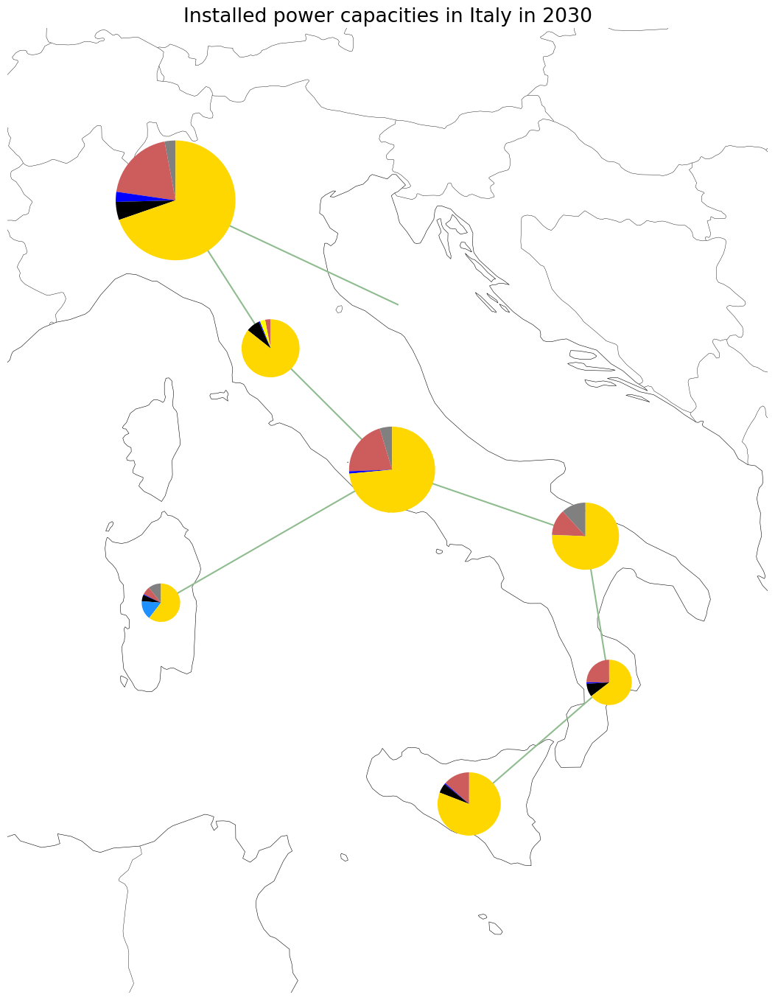

<Figure size 640x480 with 0 Axes>

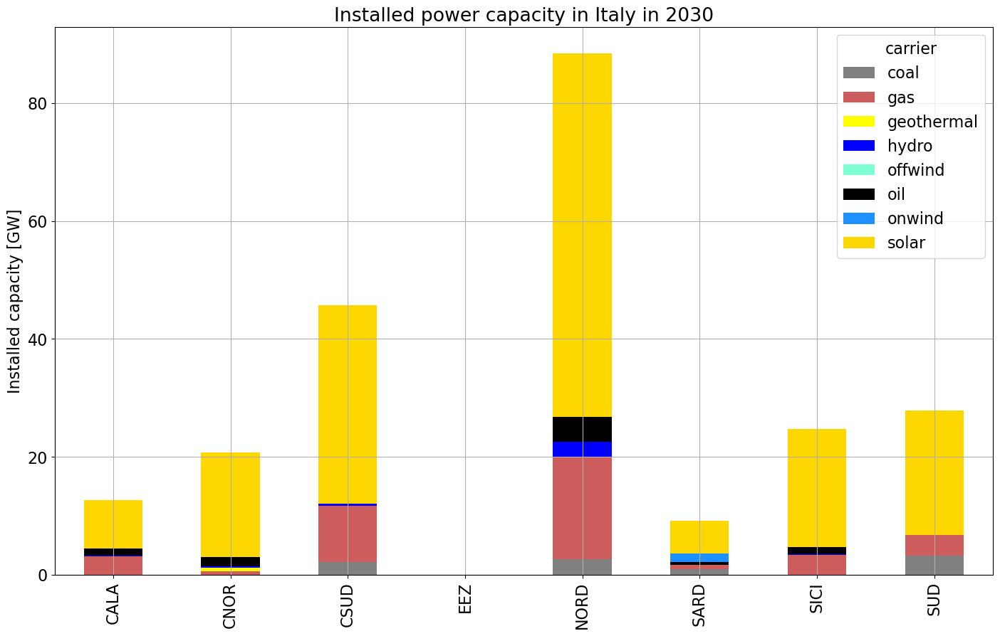

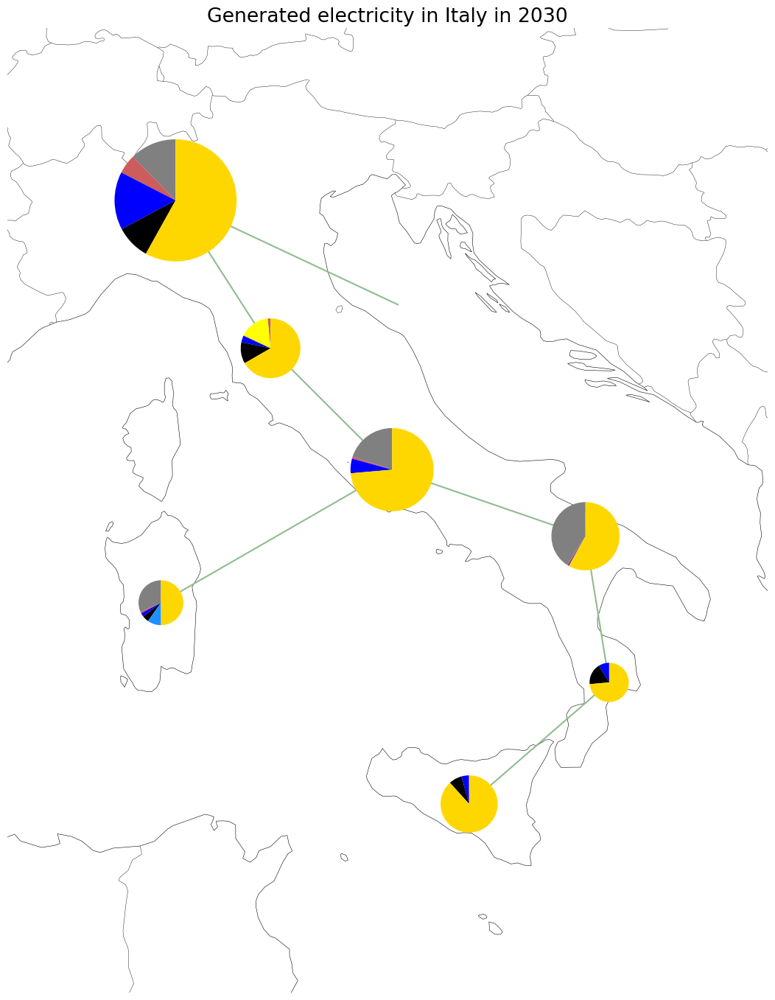

<Figure size 640x480 with 0 Axes>

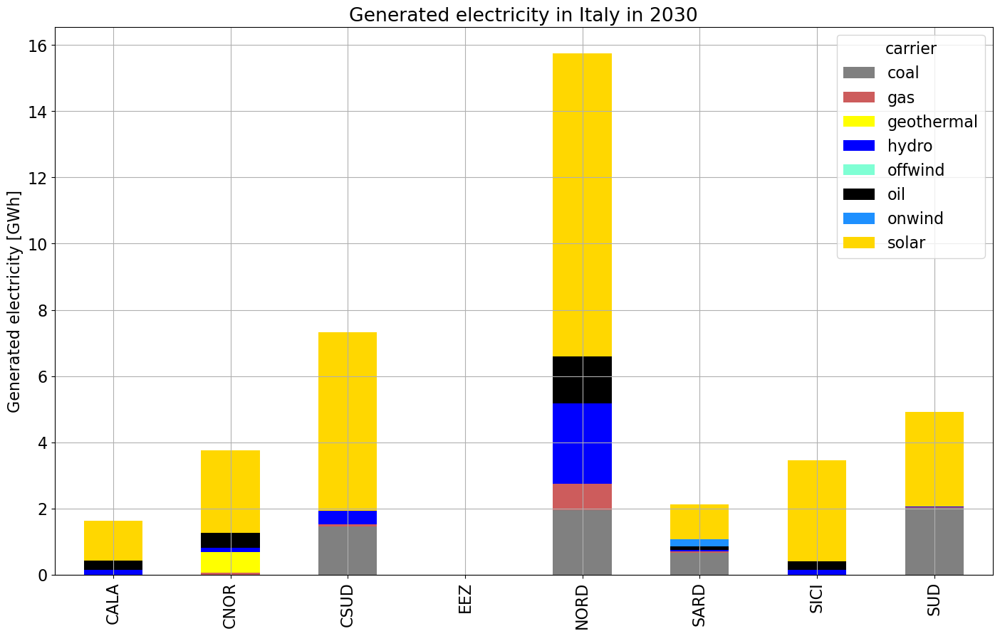

,Line capacity [MW],Positive values [%],Negative values [%],Average power transmitted,Capacity utilisation [%]
NORD-->CNOR,5000.0,25.21,74.79,3859.52,77.19
CNOR-->CSUD,5000.0,26.85,73.15,3626.53,72.53
CSUD-->SUD,5000.0,21.51,78.49,3959.43,79.19
SUD-->CALA,1500.0,31.34,68.66,1270.15,84.68
CALA-->SICI,1000.0,41.68,58.32,874.64,87.46
SARD-->CSUD,1500.0,90.17,9.83,1161.67,77.44
EEZ-->NORD,0.0,0.00,0.00,0.00,0.00


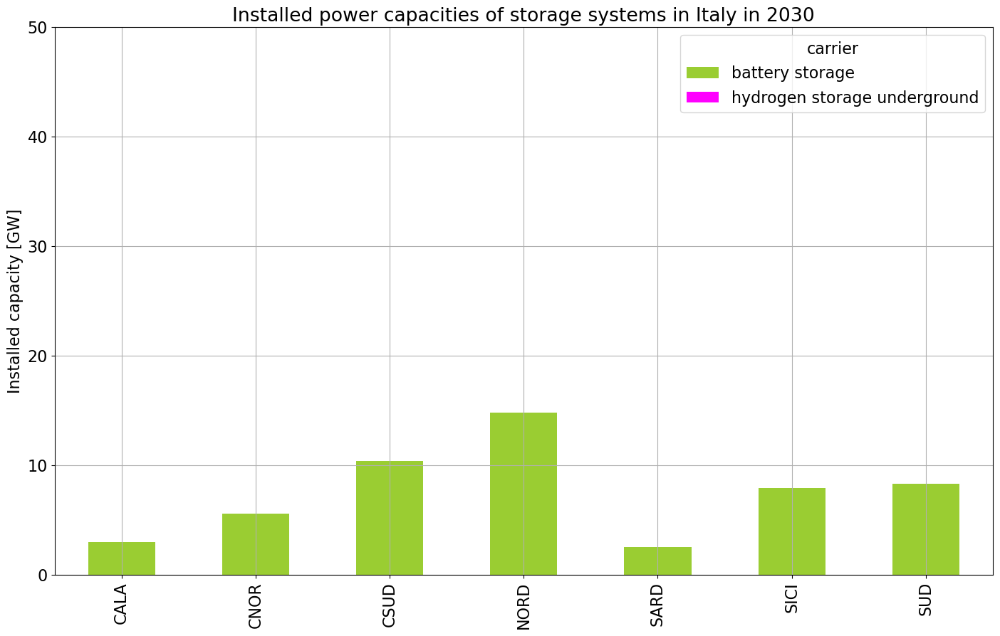

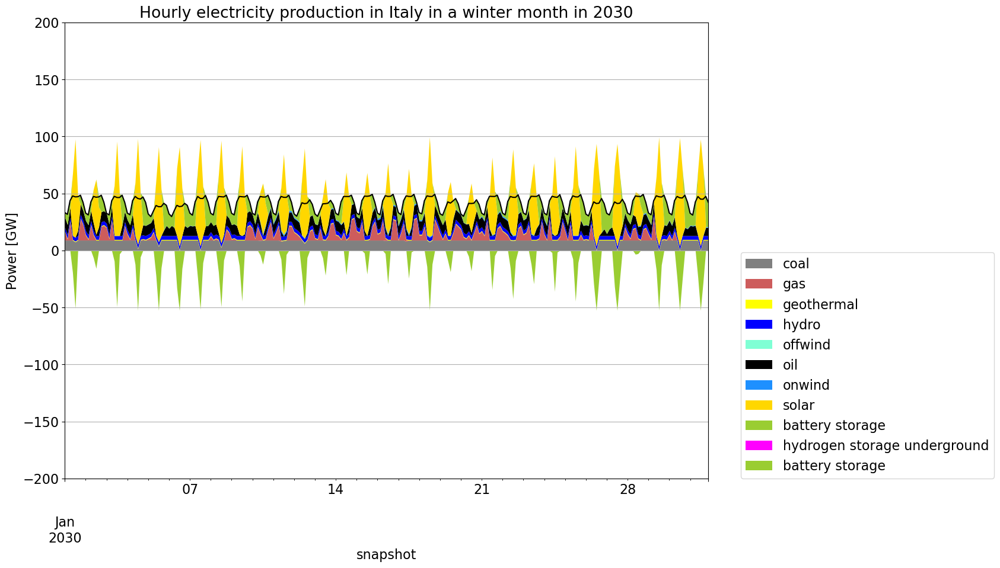

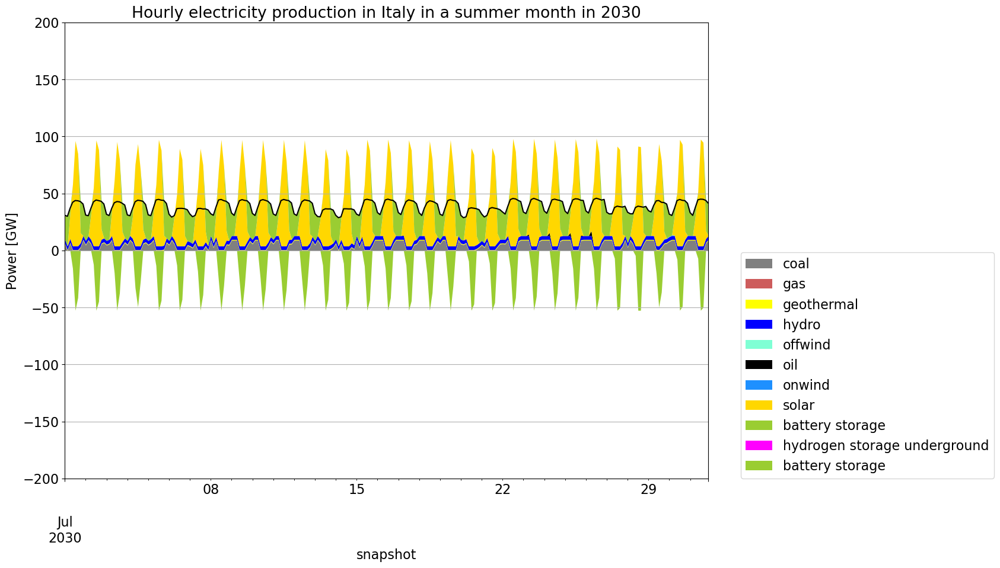

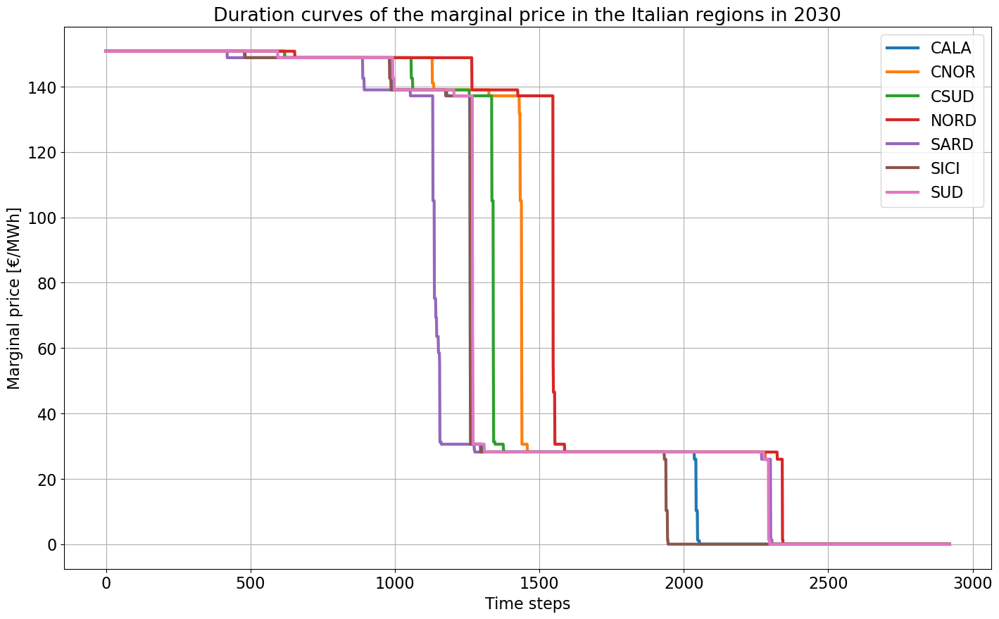

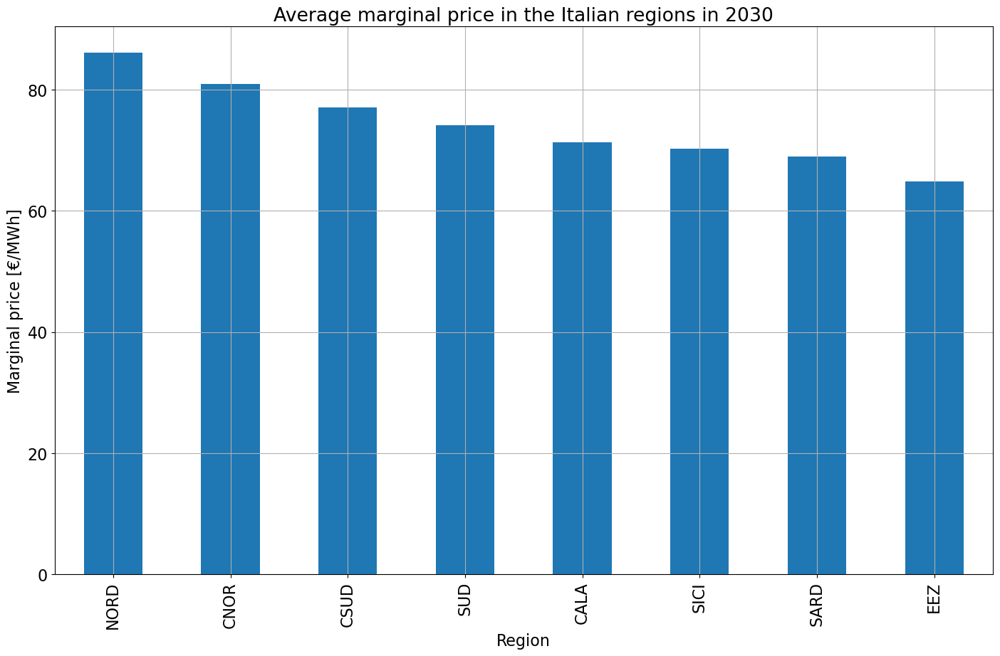

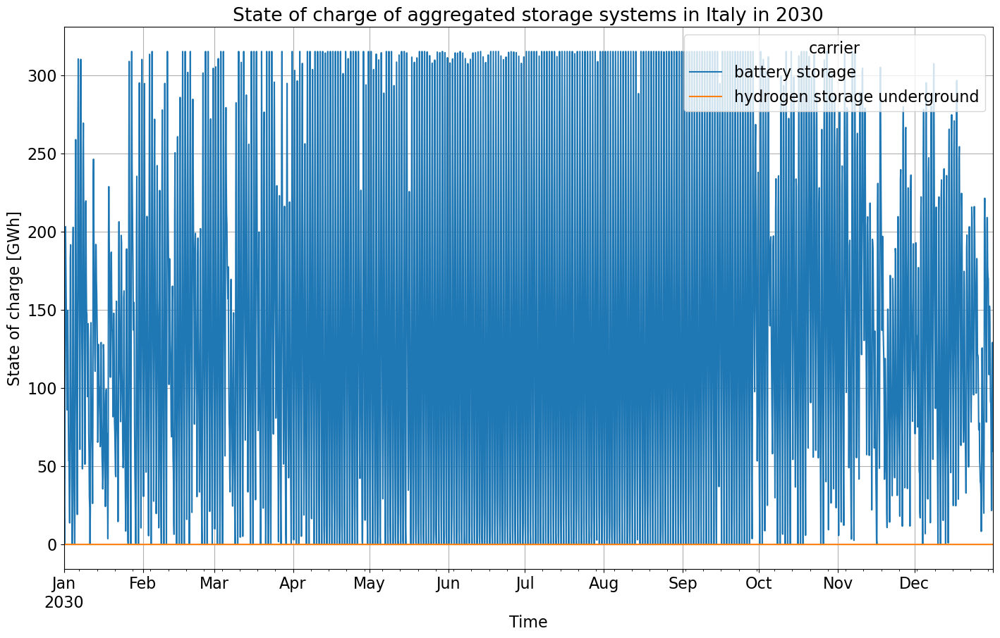

In [431]:
capacities_base = inst_cap_plot()
colors = ["grey", "indianred", "yellow", "blue", "aquamarine", "black", "dodgerblue", "gold", "yellowgreen", "magenta"]
inst_cap_table(colors)
gen_base = gen_power_plot()
gen_power_table(colors)
storages_base = inst_store_table()
gen_curve_month_winter(colors)
gen_curve_month_summer(colors)
price_dur_curve_plot()
price_regions_table()
state_of_charge_plot()
trans_line_base = trans_lines_table()
trans_line_base

In [432]:
stats_base = n.statistics()
stats_base

Capacity Factor  \
            carrier                                         
Generator   Coal                                 0.675763   
            Gas                                  0.025497   
            Geothermal                           1.000000   
            Hydro                                1.000000   
            Offshore Wind                             NaN   
            Oil                                  0.284608   
            Onshore Wind                         0.144740   
            Solar                                0.150258   
Link        AC                                   0.776418   
Load        electricity                               NaN   
StorageUnit battery storage                      0.417935   
            hydrogen storage underground              NaN   

                                          Capital Expenditure  Curtailment  \
            carrier                                                          
Generator   Coal                                 0.000000e+00     0.000000   
            Gas                                  0.000000e+00     0.000000   
            Geothermal                           0.000000e+00     0.000000   
            Hydro                                0.000000e+00     0.000000   
            Offshore Wind                        0.000000e+00     0.000000   
            Oil                                  0.000000e+00     0.000000   
            Onshore Wind                         1.387995e+08    48.375768   
            Solar                                7.804154e+09  4510.033840   
Link        AC                                   3.063424e+09          NaN   
Load        electricity                                   NaN          NaN   
StorageUnit battery storage                      5.066859e+09     0.000000   
            hydrogen storage underground         0.000000e+00     0.000000   

                                          Installed Capacity  \
            carrier                                            
Generator   Coal                                 9012.000000   
            Gas                                 38290.650000   
            Geothermal                            621.558219   
            Hydro                                3336.106164   
            Offshore Wind                           0.000000   
            Oil                                  8828.700000   
            Onshore Wind                            0.000000   
            Solar                                   0.000000   
Link        AC                                      0.000000   
Load        electricity                                  NaN   
StorageUnit battery storage                         0.000000   
            hydrogen storage underground            0.000000   

                                          Operational Expenditure  \
            carrier                                                 
Generator   Coal                                    171718.924594   
            Gas                                     147268.473488   
            Geothermal                                   0.000000   
            Hydro                                        0.000000   
            Offshore Wind                                0.000000   
            Oil                                     374035.754248   
            Onshore Wind                               282.261174   
            Solar                                      252.132416   
Link        AC                                           0.000000   
Load        electricity                                       NaN   
StorageUnit battery storage                              0.000000   
            hydrogen storage underground                 0.000000   

                                          Optimal Capacity       Revenue  \
            carrier                                                        
Generator   Coal                               9012.000000  6.707664e+05   
  

In [433]:
n.statistics.opex()

             carrier                     
Link         AC                                   0.000000
StorageUnit  battery storage                      0.000000
             hydrogen storage underground         0.000000
Generator    Coal                            171718.924594
             Gas                             147268.473488
             Geothermal                           0.000000
             Hydro                                0.000000
             Offshore Wind                        0.000000
             Oil                             374035.754248
             Onshore Wind                       282.261174
             Solar                              252.132416
Name: Operational Expenditure, dtype: float64

## **4.2.** Zero-emissions constraint

We calculated the emissions in the scenario without emissions constraint:

In [434]:
e = n.generators_t.p / n.generators.efficiency * n.generators.carrier.map(n.carriers.co2_emissions)

In [435]:
e.sum().sum()/1e6 # Million tons of CO2

25.1626975151742

We add the emission constraint:

In [436]:
n.add("GlobalConstraint",
    "emission_limit",
    carrier_attribute="co2_emissions",
    sense="<=",
    constant=0
    )

In [437]:
n.lopf(solver_name='gurobi')

2023-02-05 10:48:28,627 INFO Prepare linear problem
2023-02-05 10:48:30,850 INFO Total preparation time: 2.22s
2023-02-05 10:48:30,851 INFO Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/k2/pp6kkkdd5fv3y276km0t2cl00000gn/T/pypsa-problem-t8bm8a_q.lp
Reading time = 1.48 seconds
obj: 578161 rows, 256997 columns, 1154927 nonzeros
Gurobi Optimizer version 10.0.0 build v10.0.0rc2 (mac64[x86])

CPU model: Intel(R) Core(TM) i5-5257U CPU @ 2.70GHz
Thread count: 2 physical cores, 4 logical processors, using up to 4 threads

Optimize a model with 578161 rows, 256997 columns and 1154927 nonzeros
Model fingerprint: 0x393d69f5
Coefficient statistics:
  Matrix range     [1e-06, 5e+02]
  Objective range  [3e-02, 3e+05]
  Bounds range     [1e+03, 2e+05]
  RHS range        [2e+01, 2e+04]
Presolve removed 331318 rows and 71438 columns
Presolve time: 1.05s
Presolved: 246843 rows, 185559 columns, 804299 nonzeros

Concurrent LP optimizer: dual simplex and barrier
Showing barrier log only...

Ordering time: 0.10s

Barrier statistics:
 Dense cols : 36
 Free vars  : 8796
 AA' NZ     : 7.823e+05
 Factor NZ  : 3.946e+06 (roughly 200 MB of memory)
 Fact

   26177 PPushes remaining with PInf 4.0093836e-04                98s
    7913 PPushes remaining with PInf 1.5025460e-04               131s
       0 PPushes remaining with PInf 0.0000000e+00               133s

  Push phase complete: Pinf 0.0000000e+00, Dinf 1.9329152e+04    133s

Iteration    Objective       Primal Inf.    Dual Inf.      Time
  141092    3.5247721e+10   0.000000e+00   1.932915e+04    134s

Solved with barrier
  141968    3.5247720e+10   0.000000e+00   0.000000e+00    136s

Solved in 141968 iterations and 136.10 seconds (150.82 work units)
Optimal objective  3.524772047e+10


2023-02-05 10:50:53,970 INFO Optimization successful. Objective value: 3.52e+10


('ok', 'optimal')

In [438]:
tot_cost_zero_emiss = n.objective/1e9     # billion €/year
system_cost_zero_emiss = system_cost(n)
marg_price_region_zero_emiss = n.buses_t.marginal_price.mean()

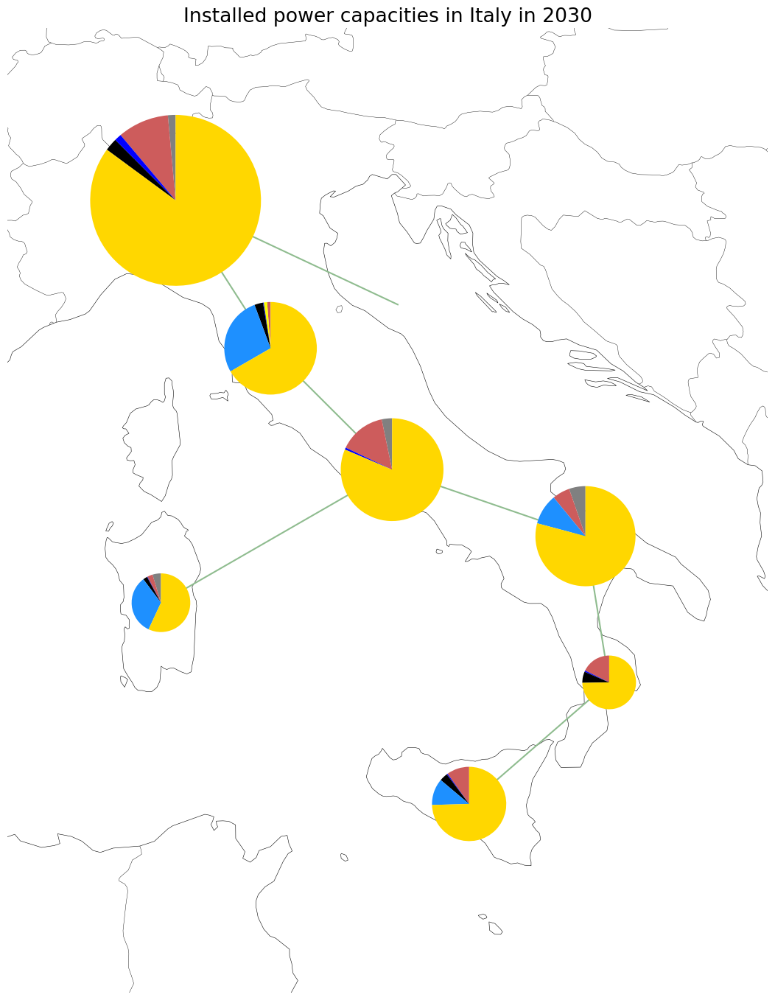

<Figure size 640x480 with 0 Axes>

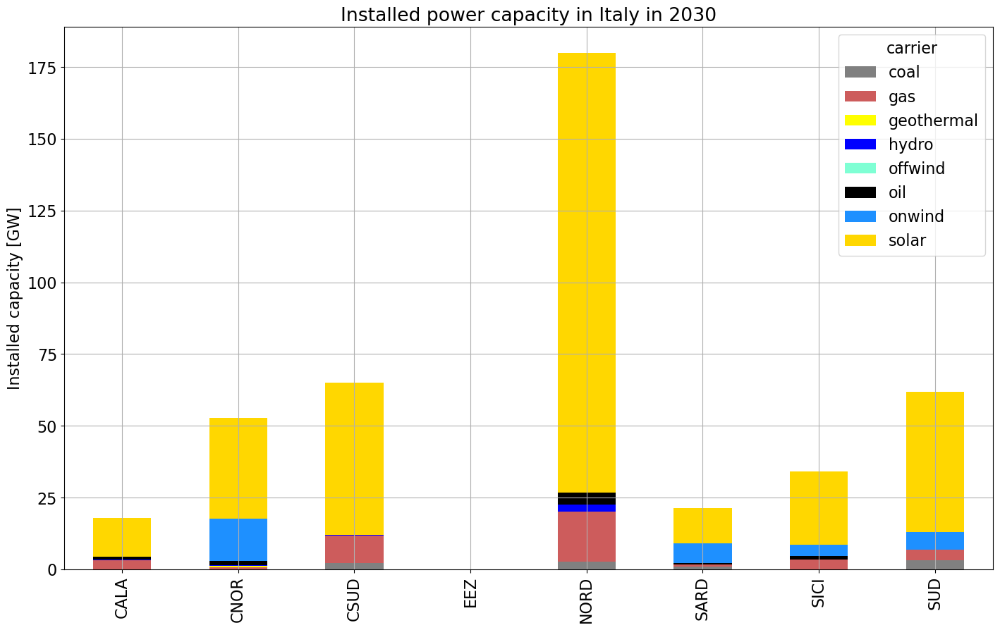

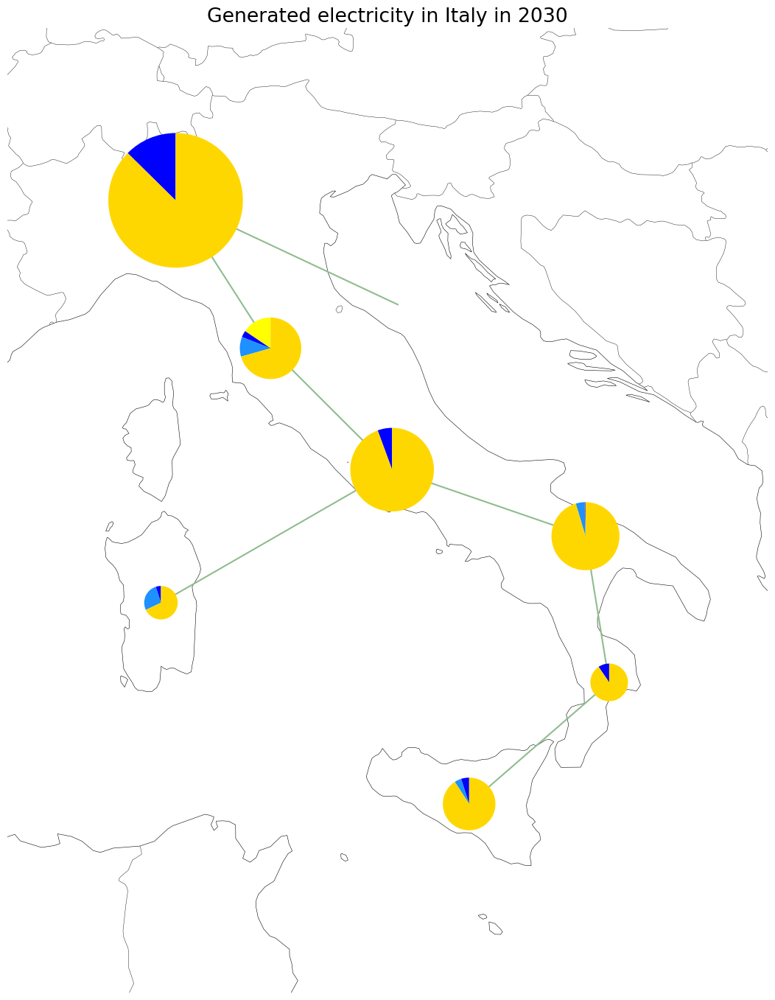

<Figure size 640x480 with 0 Axes>

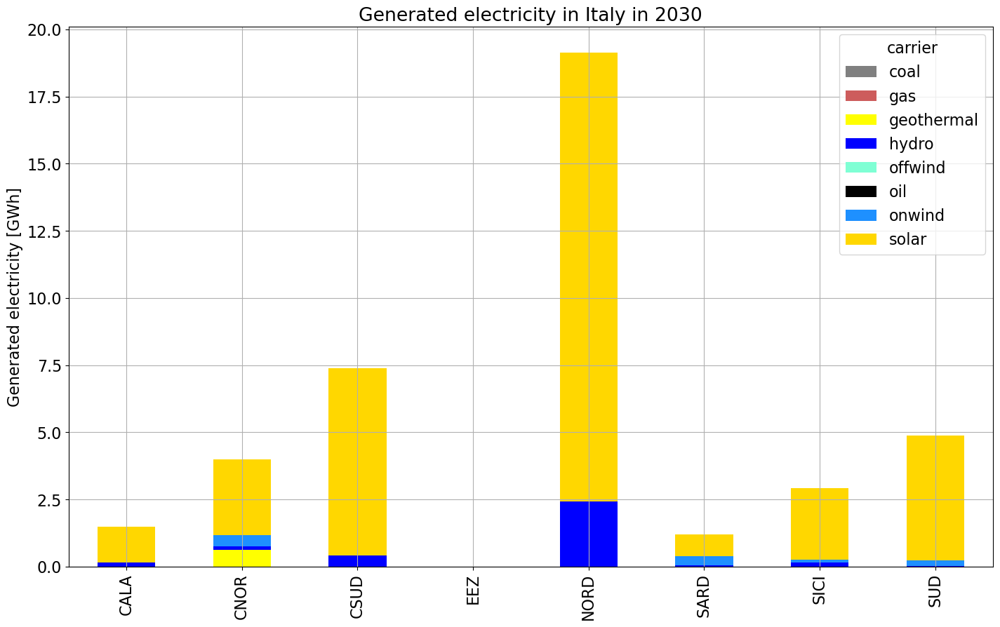

,Line capacity [MW],Positive values [%],Negative values [%],Average power transmitted,Capacity utilisation [%]
NORD-->CNOR,5338.56,49.73,50.27,4391.61,82.26
CNOR-->CSUD,5000.00,58.80,41.20,3211.95,64.24
CSUD-->SUD,5000.00,36.64,63.36,4126.56,82.53
SUD-->CALA,1500.00,59.08,40.92,1227.13,81.81
CALA-->SICI,1000.00,75.79,24.21,923.29,92.33
SARD-->CSUD,2772.00,37.43,62.57,1857.43,67.01
EEZ-->NORD,0.00,0.00,0.00,0.00,0.00


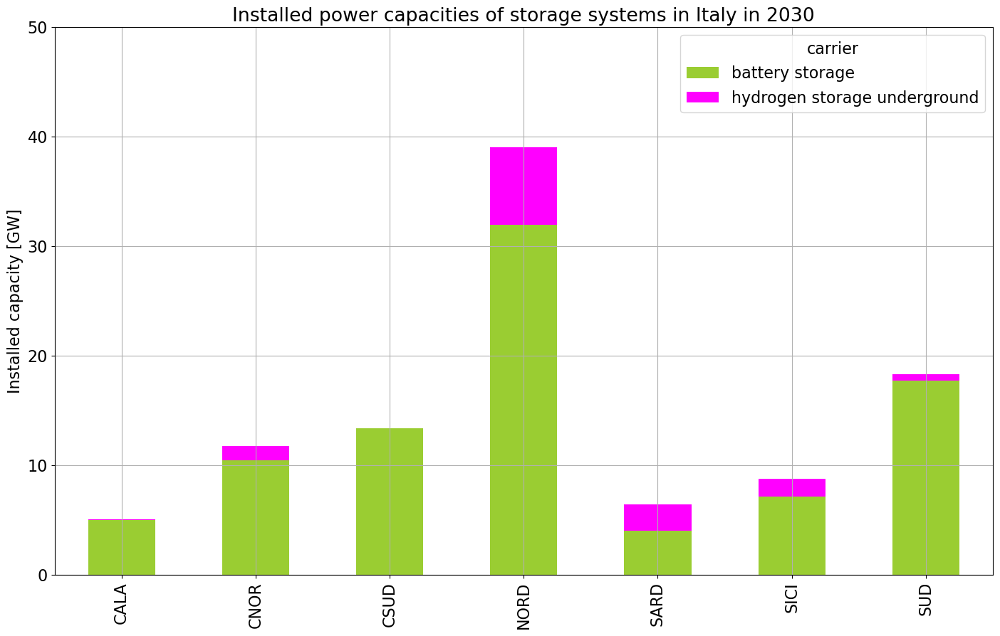

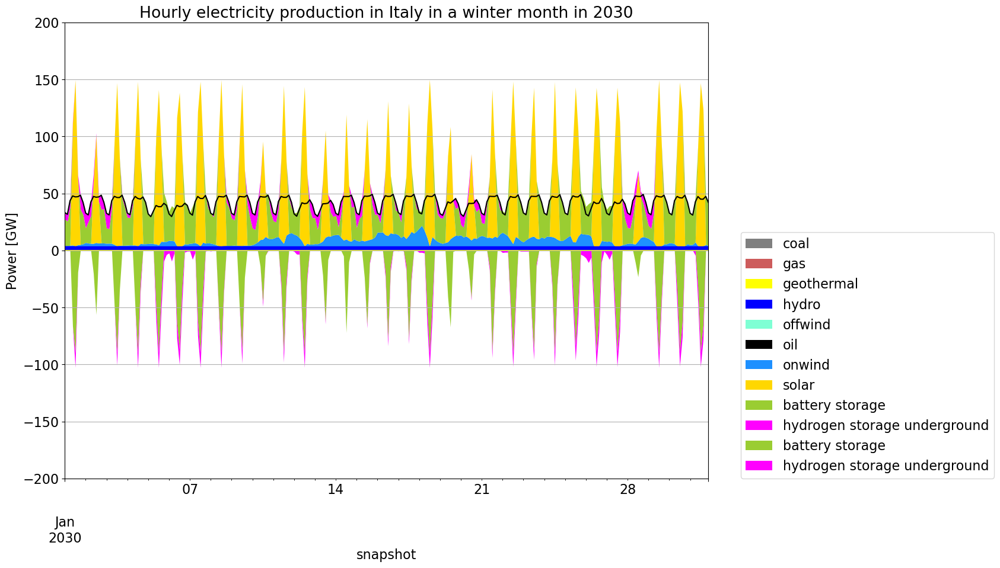

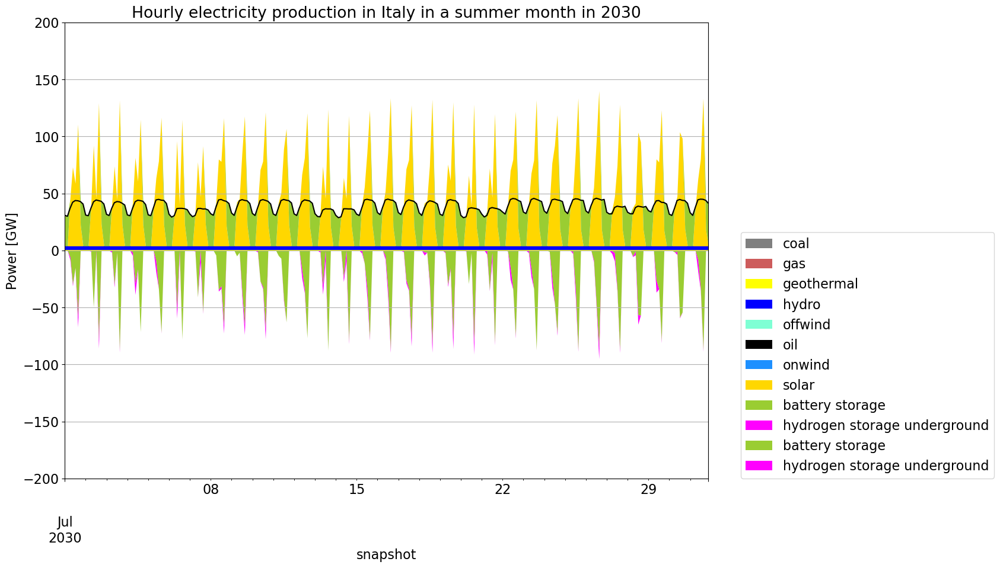

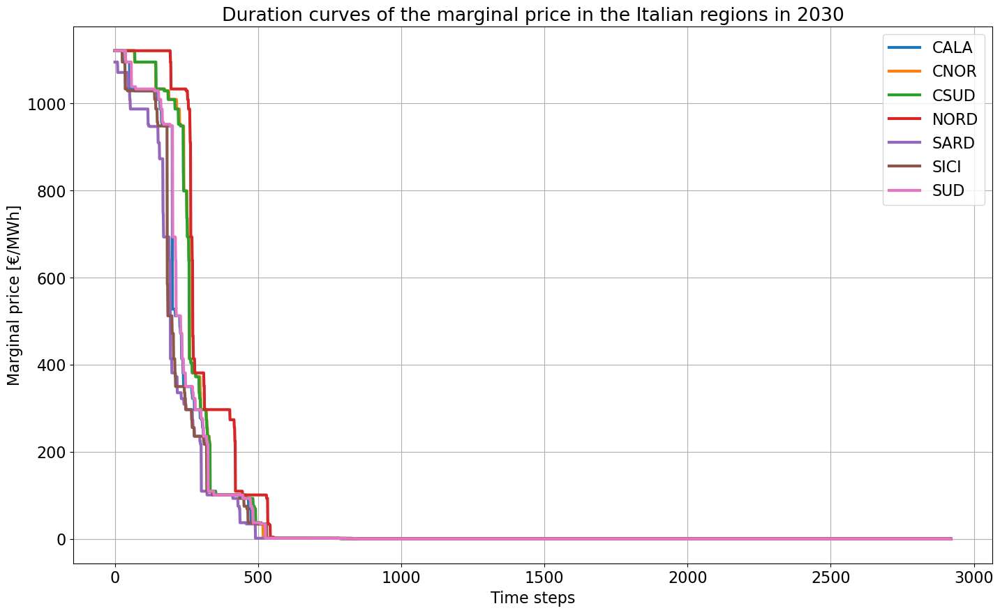

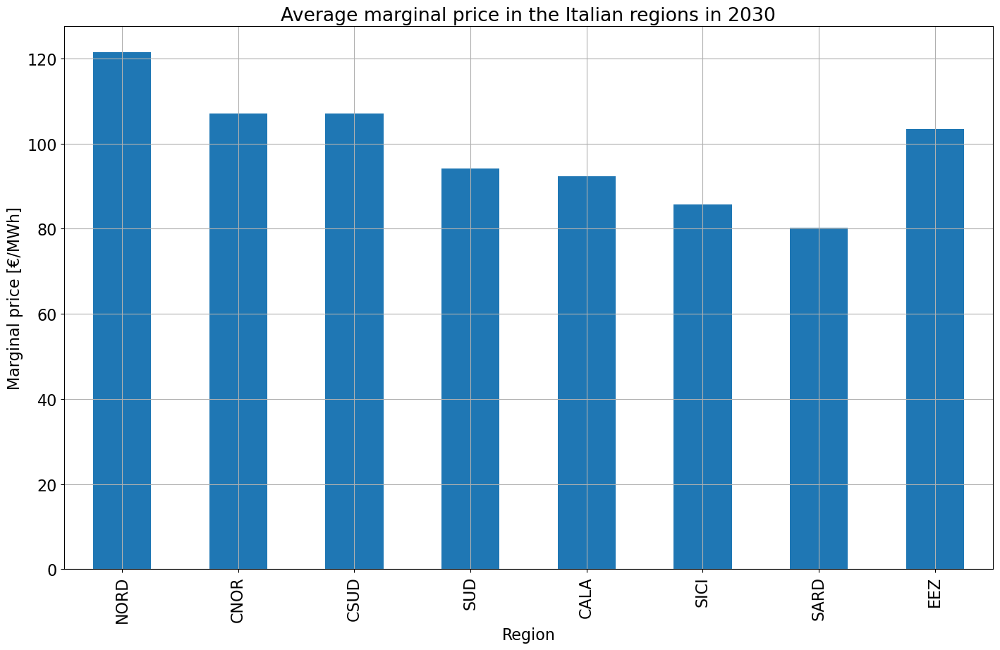

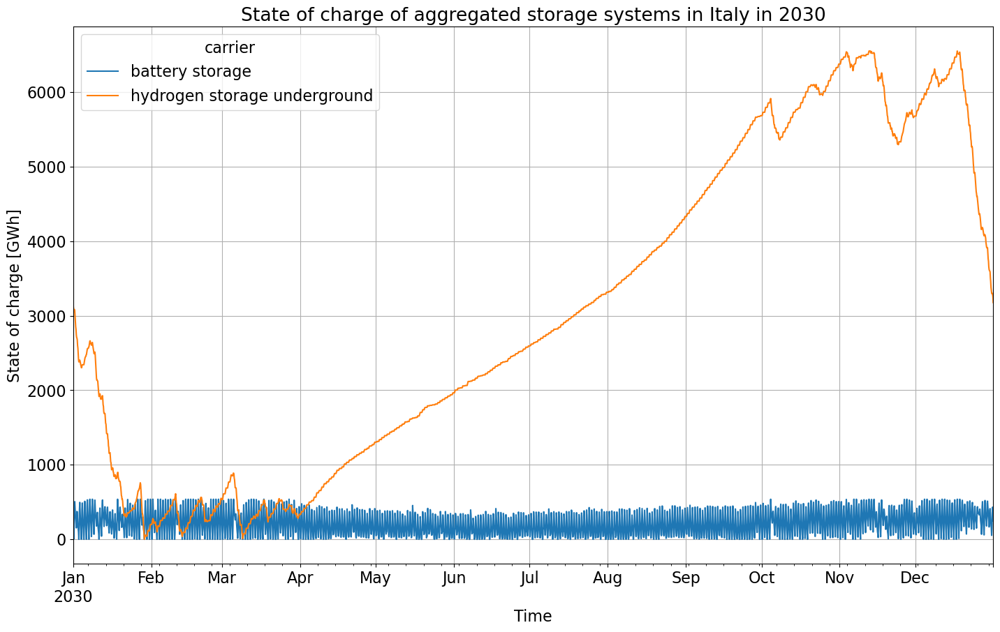

In [439]:
capacities_zero_emissions = inst_cap_plot()
colors = ["grey", "indianred", "yellow", "blue", "aquamarine", "black", "dodgerblue", "gold", "yellowgreen", "magenta"]
inst_cap_table(colors)
gen_zero_emiss = gen_power_plot()
gen_power_table(colors)
storages_zero_emiss = inst_store_table()
gen_curve_month_winter(colors)
gen_curve_month_summer(colors)
price_dur_curve_plot()
price_regions_table()
state_of_charge_plot()
trans_line_zero_emissions = trans_lines_table()
trans_line_zero_emissions

In [440]:
stats_zero_emiss = n.statistics()

## **4.3.** Sensitivity analysis 1: Variations of PV potential

In [441]:
pv_use = pd.DataFrame(index=joined.index)
for region in joined.index:
    pv_use.loc[region,"pv_usage [%]"] = round(capacities_zero_emissions.unstack().solar[region]/potential_pv[region]*100,2)
pv_use

,pv_usage [%]
EEZ,NaN
CALA,100.00
CNOR,100.00
CSUD,100.00
NORD,95.81
SARD,32.65
SICI,51.25
SUD,100.00


Even though in only one region the PV reached the maximum available capacity, even if we reduce this value, it would habe consequences over the whole system. We explore now the cases with 0%, 20%, 40%, 60%, 80% and 100% pv potentials. 0% means 0GW can be installed. 100% means than as much PV can be installed as the land eligibility analysis tells us.

In [442]:
def pv_sens_analysis(pv_pot):

    for region in italy_geom.index:
        n.remove("Generator",f"solar {region}") 

    for region in italy_geom.index:
        n.add(
            "Generator",
            f"solar {region}",
            bus=region,
            carrier="solar",
            p_max_pu=cf_pv[region],
            capital_cost=costs.at["solar", "capital_cost"],
            marginal_cost=costs.at["solar", "marginal_cost"],
            efficiency=costs.at["solar", "efficiency"],
            p_nom_extendable=True,
            p_nom_max=potential_pv[region]*pv_pot
    )

### **4.3.1** 0% PV

In [443]:
pv_sens_analysis(0)
n.lopf(solver_name='gurobi')

2023-02-05 10:51:04,304 INFO Prepare linear problem
2023-02-05 10:51:06,942 INFO Total preparation time: 2.63s
2023-02-05 10:51:06,944 INFO Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/k2/pp6kkkdd5fv3y276km0t2cl00000gn/T/pypsa-problem-p2vb44pp.lp
Reading time = 1.60 seconds
obj: 578161 rows, 256997 columns, 1154927 nonzeros
Gurobi Optimizer version 10.0.0 build v10.0.0rc2 (mac64[x86])

CPU model: Intel(R) Core(TM) i5-5257U CPU @ 2.70GHz
Thread count: 2 physical cores, 4 logical processors, using up to 4 threads

Optimize a model with 578161 rows, 256997 columns and 1154927 nonzeros
Model fingerprint: 0x449e64fc
Coefficient statistics:
  Matrix range     [1e-06, 5e+02]
  Objective range  [3e-02, 3e+05]
  Bounds range     [1e+03, 9e+04]
  RHS range        [2e+01, 2e+04]
Presolve removed 344622 rows and 84749 columns
Presolve time: 1.80s
Presolved: 233539 rows, 172248 columns, 796756 nonzeros

Concurrent LP optimizer: dual simplex and barrier
Showing barrier log only...

Ordering time: 0.09s

Barrier statistics:
 Dense cols : 29
 Free vars  : 5851
 AA' NZ     : 8.027e+05
 Factor NZ  : 3.936e+06 (roughly 200 MB of memory)
 Fact

KeyError: -1006

In [444]:
tot_cost_0_PV = n.objective/1e9     # billion €/year
system_cost_0_PV = system_cost(n)
marg_price_region_0_PV = n.buses_t.marginal_price.mean()

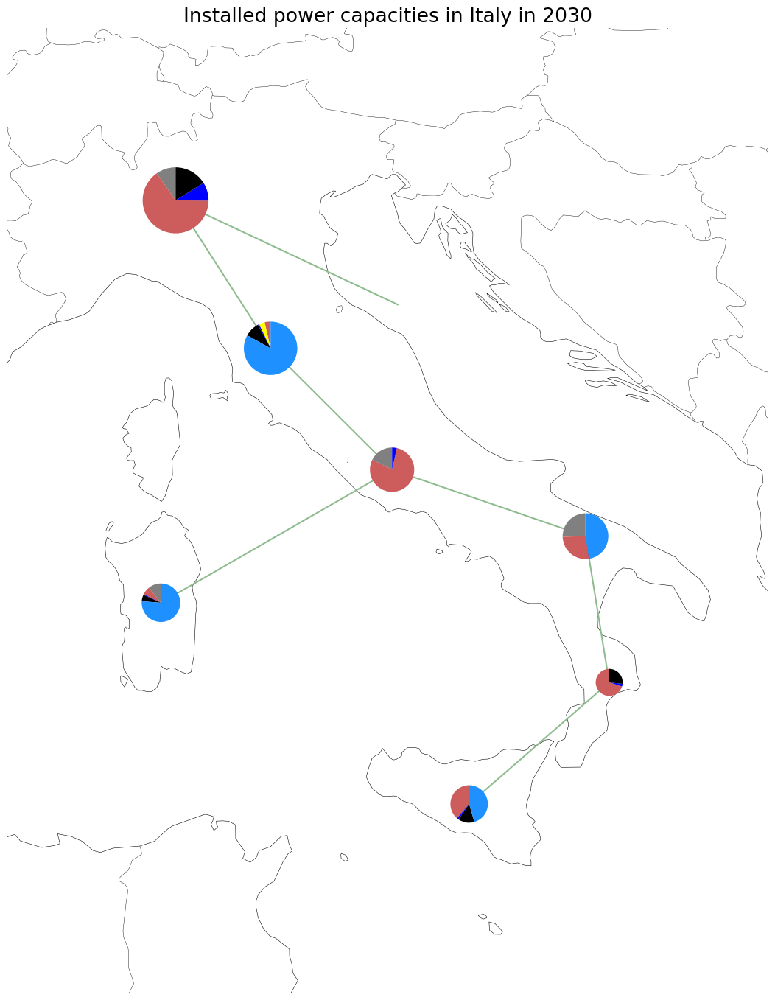

<Figure size 640x480 with 0 Axes>

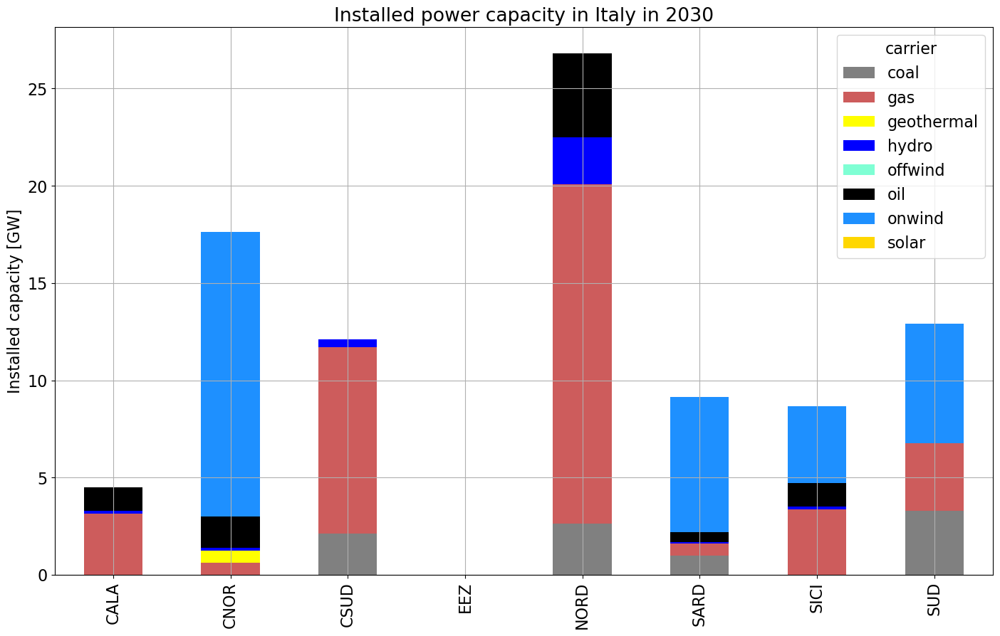

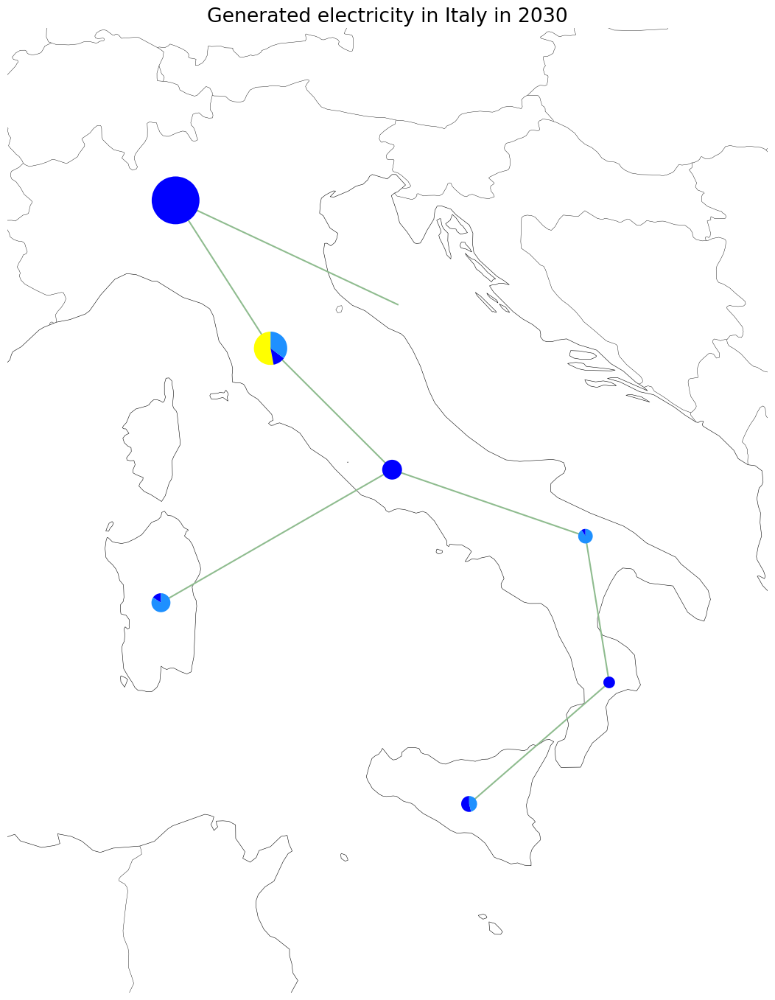

<Figure size 640x480 with 0 Axes>

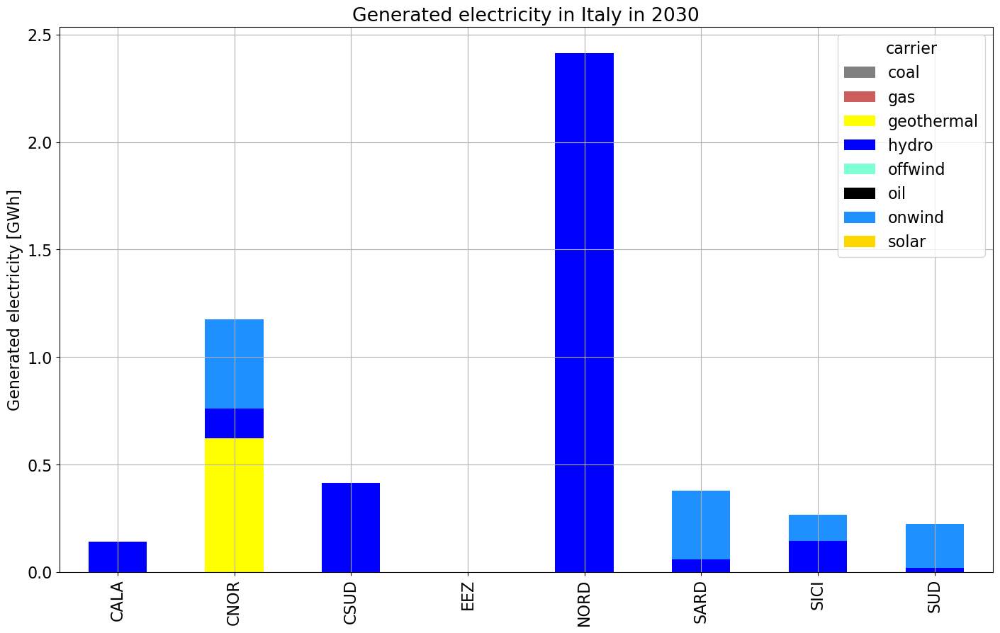

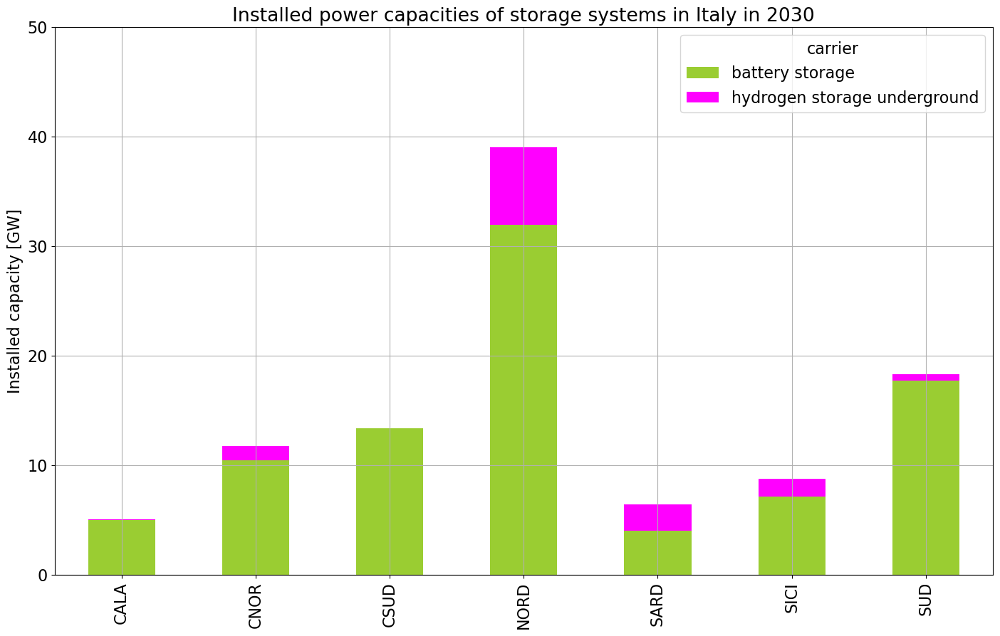

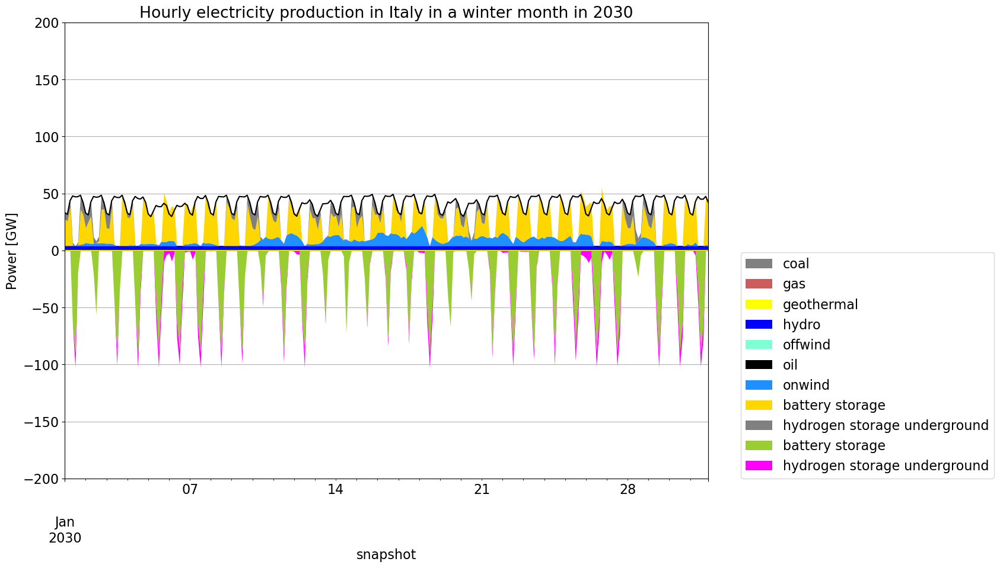

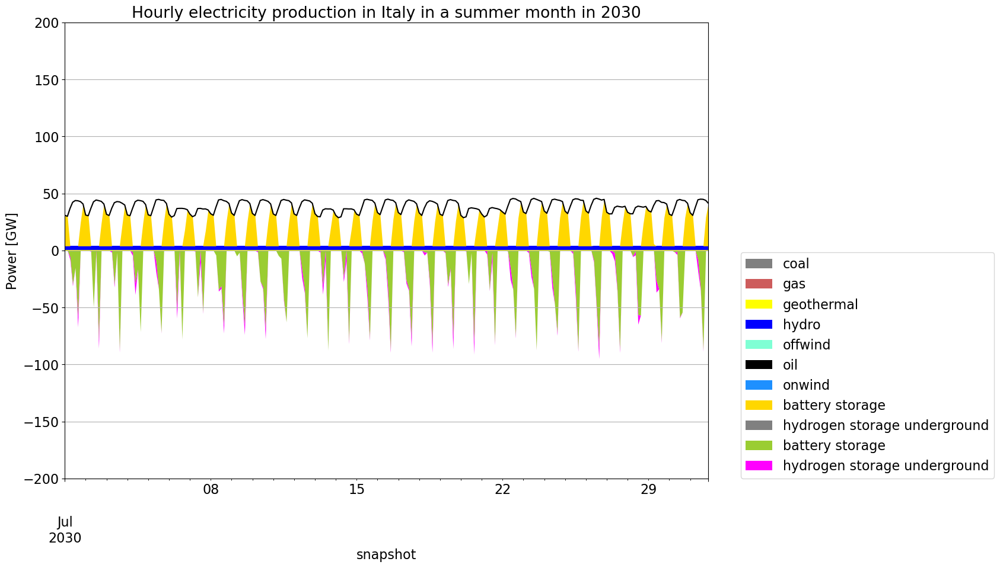

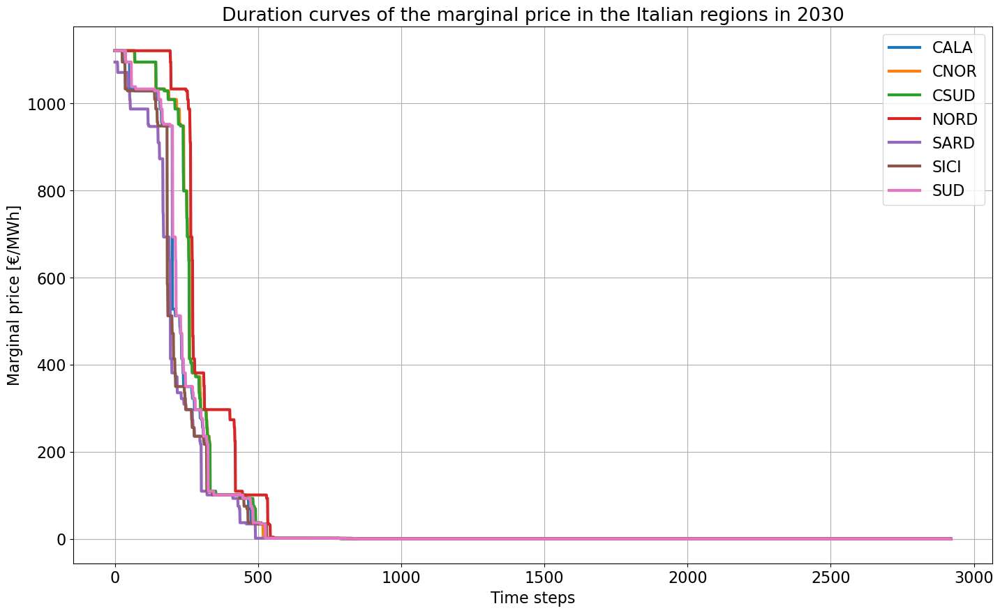

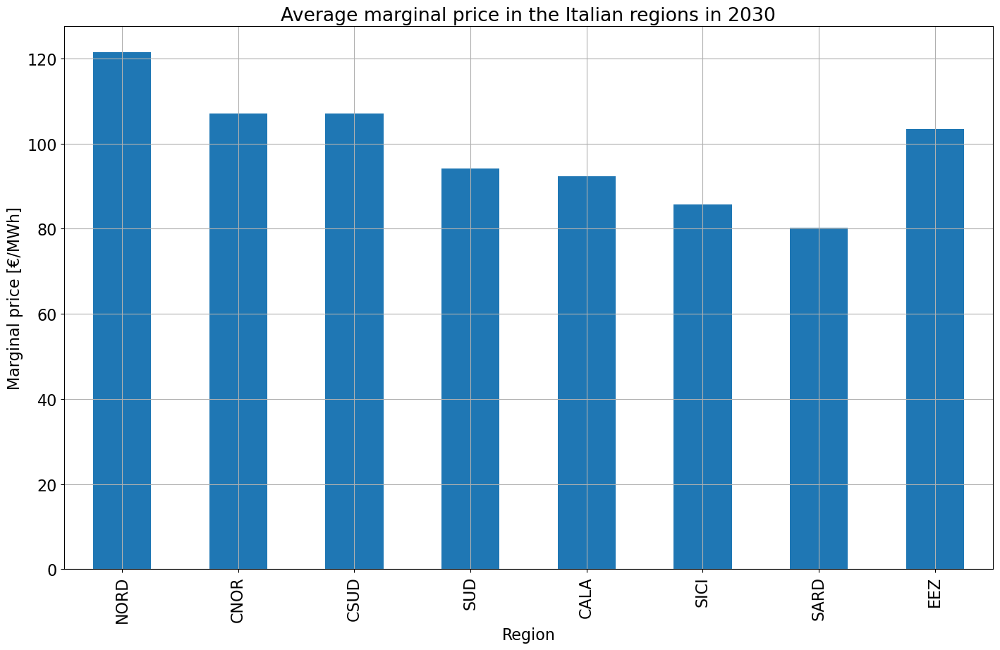

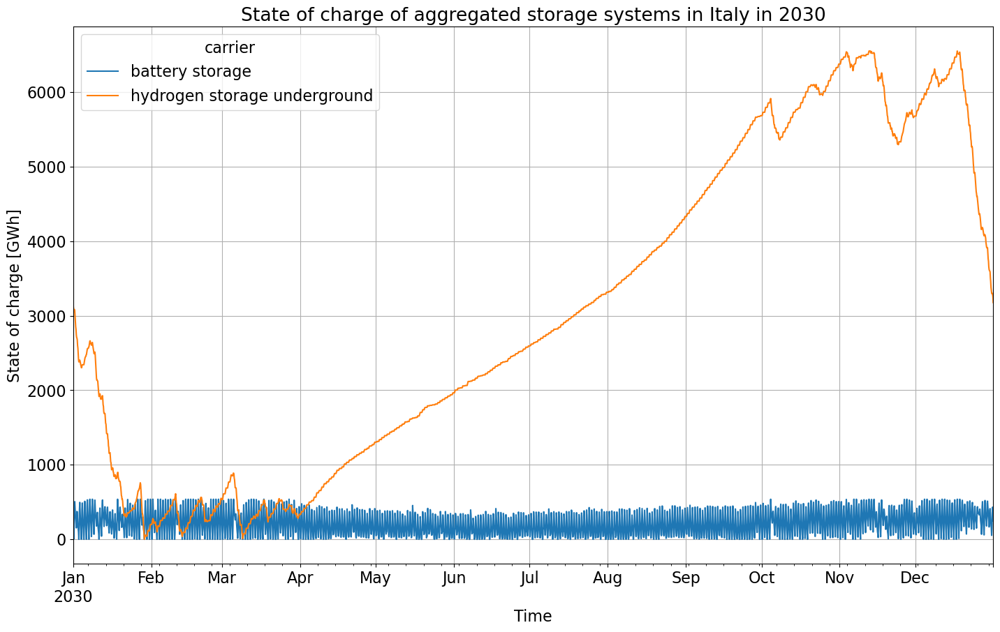

In [445]:
if n.objective > 0:
    capacities_0_PV = inst_cap_plot()
    colors=["grey", "indianred", "yellow", "blue", "aquamarine", "black", "dodgerblue", "gold"]
    inst_cap_table(colors)
    gen_0_PV = gen_power_plot()
    gen_power_table(colors)
    storages_0_PV = inst_store_table()
    gen_curve_month_winter(colors)
    gen_curve_month_summer(colors)
    price_dur_curve_plot()
    price_regions_table()
    state_of_charge_plot()
    trans_line_0_PV = trans_lines_table()
    trans_line_0_PV

In [446]:
stats_0_PV = n.statistics()

### **4.3.2** 20% PV

In [447]:
pv_sens_analysis(0.2)
n.lopf(solver_name='gurobi')

2023-02-05 10:53:17,956 INFO Prepare linear problem
2023-02-05 10:53:20,211 INFO Total preparation time: 2.25s
2023-02-05 10:53:20,212 INFO Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/k2/pp6kkkdd5fv3y276km0t2cl00000gn/T/pypsa-problem-jmdf783r.lp
Reading time = 1.64 seconds
obj: 578161 rows, 256997 columns, 1154927 nonzeros
Gurobi Optimizer version 10.0.0 build v10.0.0rc2 (mac64[x86])

CPU model: Intel(R) Core(TM) i5-5257U CPU @ 2.70GHz
Thread count: 2 physical cores, 4 logical processors, using up to 4 threads

Optimize a model with 578161 rows, 256997 columns and 1154927 nonzeros
Model fingerprint: 0x9c36a77f
Coefficient statistics:
  Matrix range     [1e-06, 5e+02]
  Objective range  [3e-02, 3e+05]
  Bounds range     [1e+03, 9e+04]
  RHS range        [2e+01, 2e+04]
Presolve removed 331318 rows and 71438 columns
Presolve time: 1.03s
Presolved: 246843 rows, 185559 columns, 804299 nonzeros

Concurrent LP optimizer: dual simplex and barrier
Showing barrier log only...


Interrupt request received
Ordering time: 0.14s

Barrier statistics:
 Dense cols : 36
 Free vars  : 8796
 AA' NZ     : 7.823e+05
 Factor NZ  : 3.946e+06 (rou

  95   6.08644335e+10  6.08251640e+10  3.72e-03 7.14e-03  9.39e+01    46s
  96   6.08566185e+10  6.08321057e+10  2.41e-03 6.93e-03  5.86e+01    46s
  97   6.08544618e+10  6.08324064e+10  2.08e-03 6.77e-03  5.28e+01    47s
  98   6.08513391e+10  6.08358841e+10  1.51e-03 8.79e-03  3.69e+01    47s
  99   6.08490322e+10  6.08381628e+10  1.16e-03 7.80e-03  2.60e+01    48s
 100   6.08473287e+10  6.08395759e+10  8.83e-04 2.64e-03  1.85e+01    48s
 101   6.08456783e+10  6.08398574e+10  6.15e-04 2.31e-03  1.39e+01    49s
 102   6.08444324e+10  6.08409370e+10  4.14e-04 1.04e-03  8.33e+00    49s
 103   6.08426451e+10  6.08412933e+10  1.30e-04 6.81e-04  3.22e+00    49s
 104   6.08424652e+10  6.08414535e+10  1.02e-04 4.79e-04  2.41e+00    50s
 105   6.08424245e+10  6.08414747e+10  9.58e-05 4.55e-04  2.26e+00    50s
 106   6.08421910e+10  6.08416855e+10  5.93e-05 1.85e-04  1.20e+00    51s
 107   6.08421623e+10  6.08417664e+10  5.49e-05 8.49e-05  9.39e-01    51s
 108   6.08418567e+10  6.08417846e+10 

2023-02-05 10:54:27,101 INFO Optimization successful. Objective value: 6.08e+10


('ok', 'optimal')

In [448]:
tot_cost_20_PV = n.objective/1e9     # billion €/year
system_cost_20_PV = system_cost(n)
marg_price_region_20_PV = n.buses_t.marginal_price.mean()

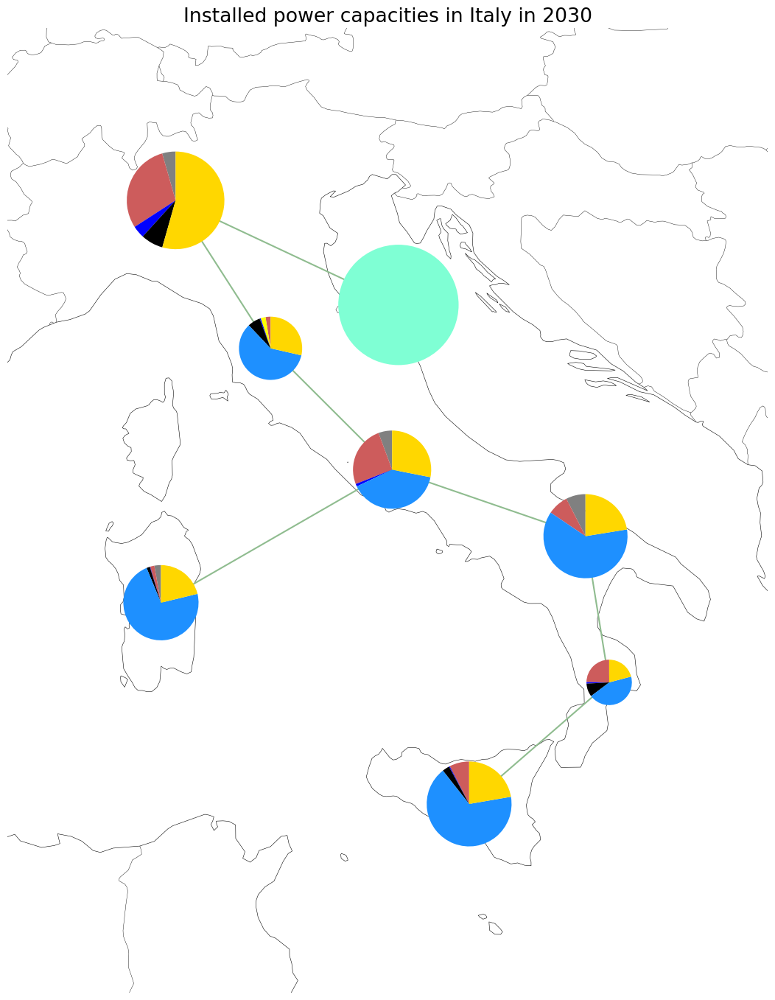

<Figure size 640x480 with 0 Axes>

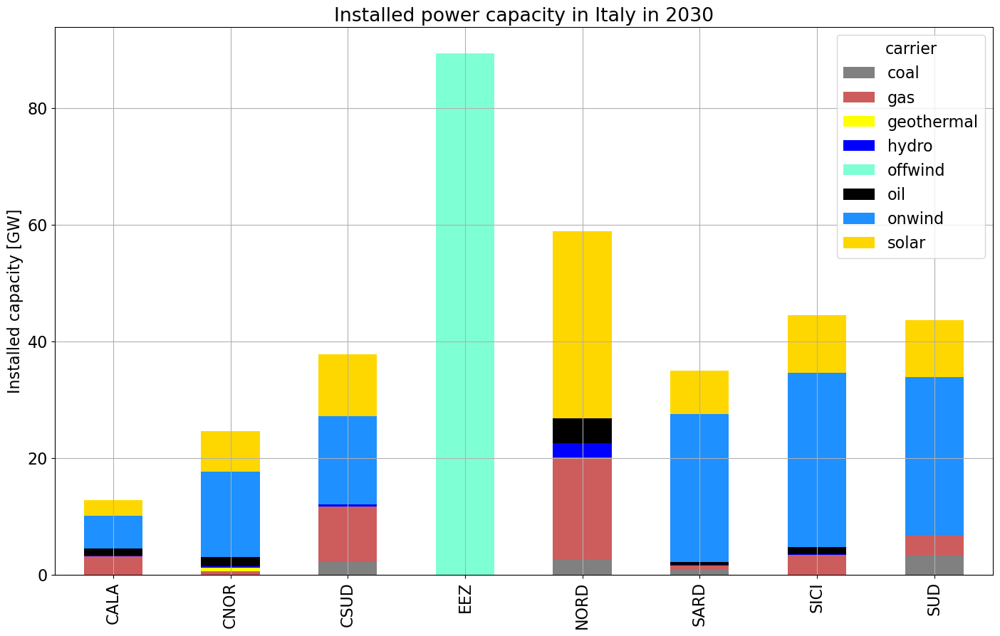

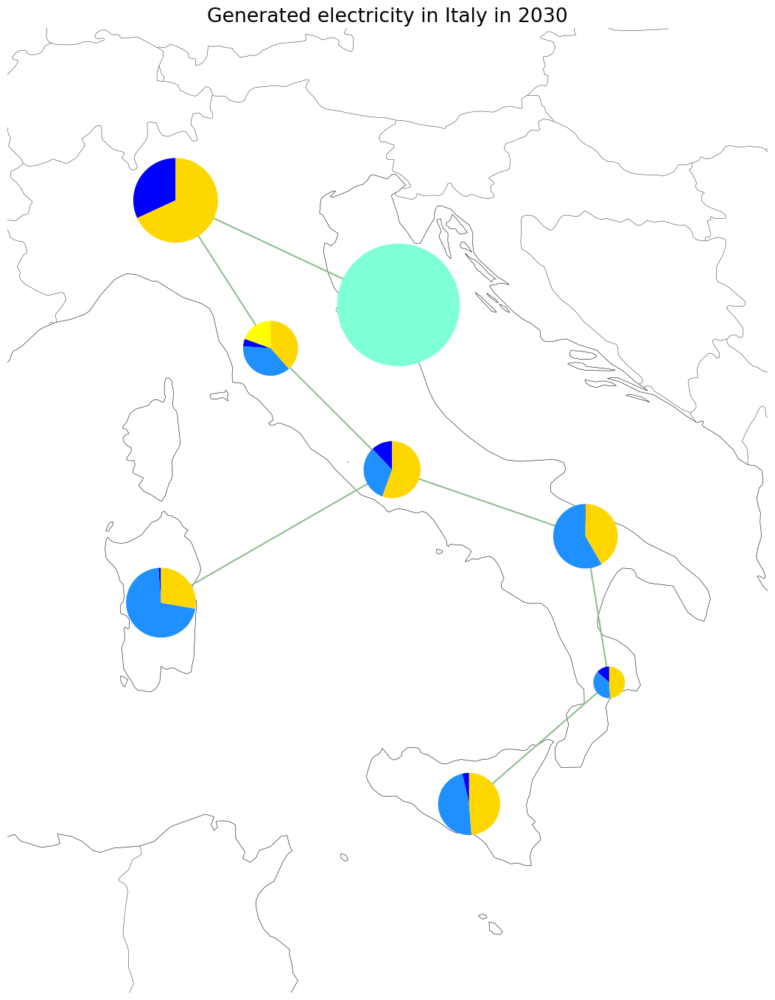

<Figure size 640x480 with 0 Axes>

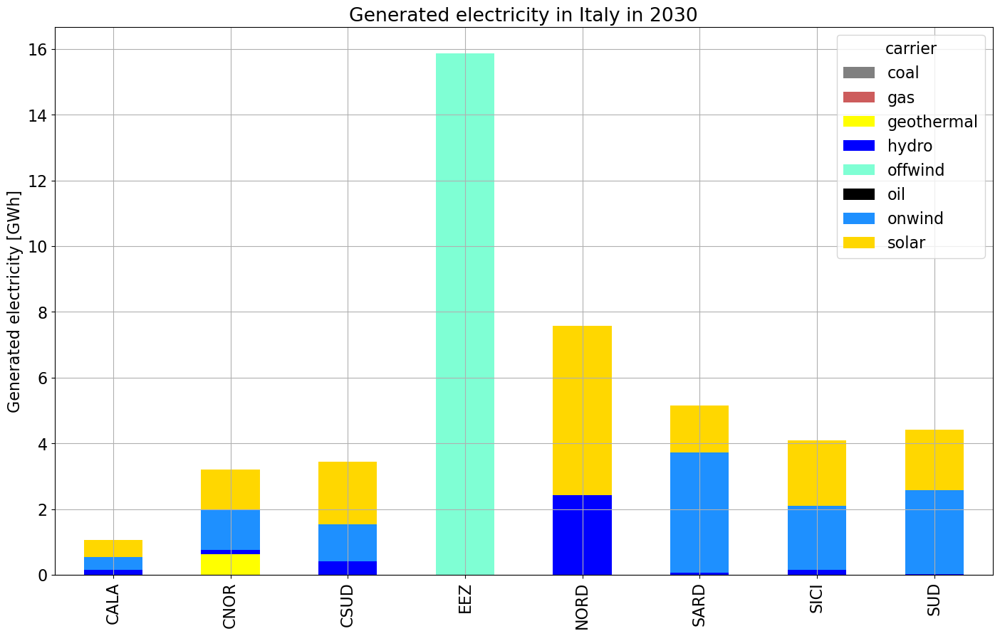

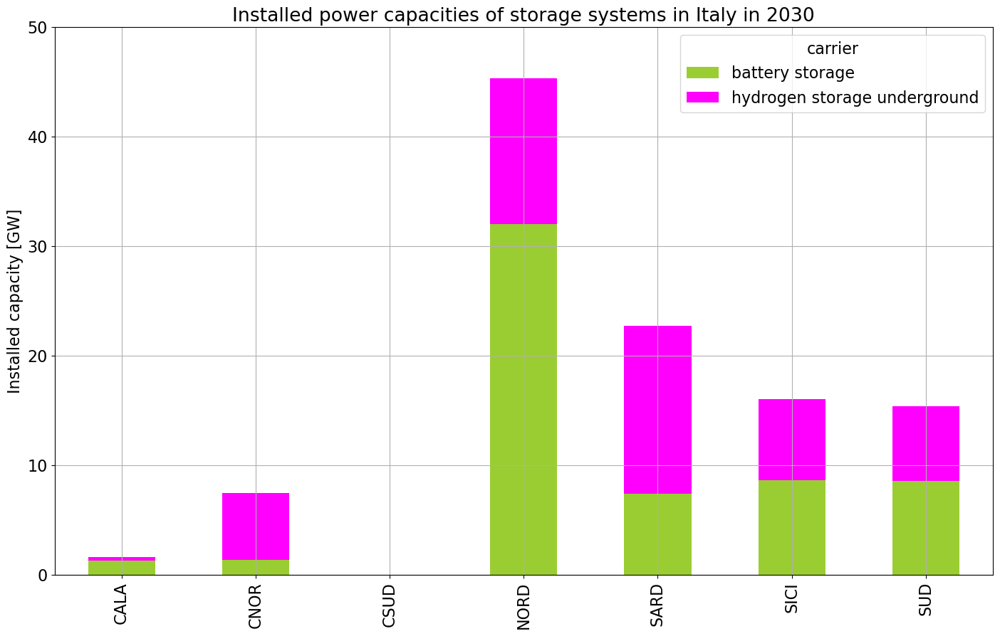

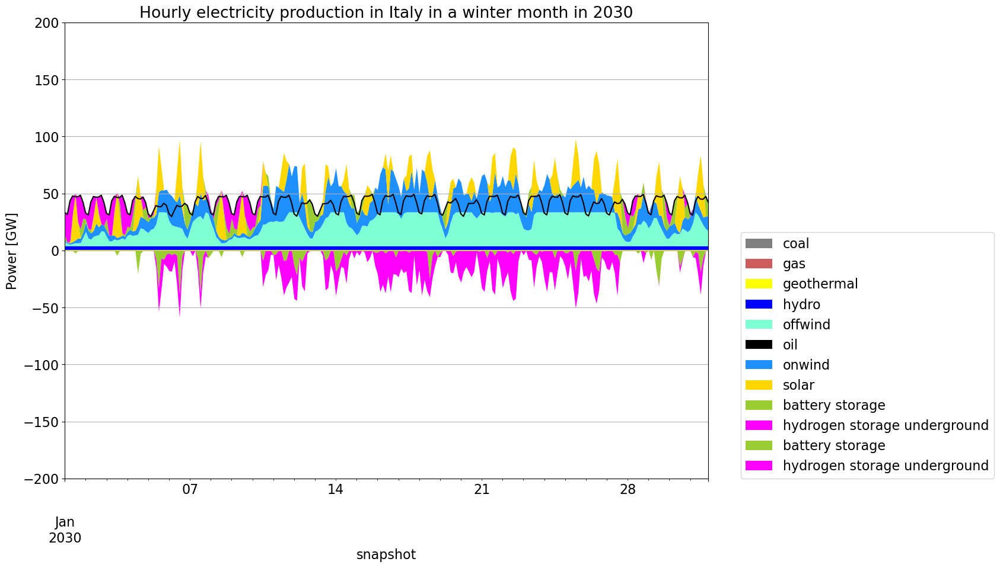

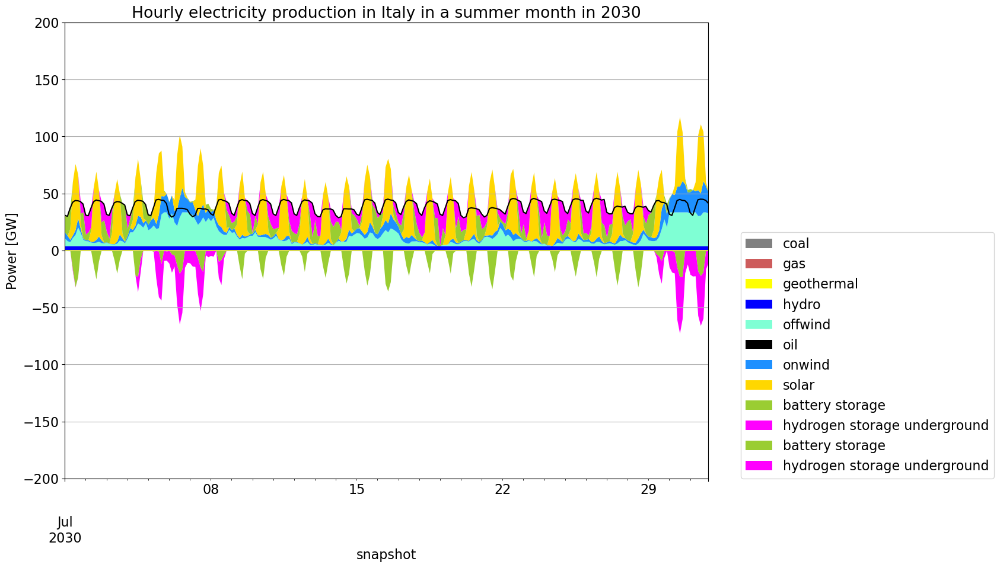

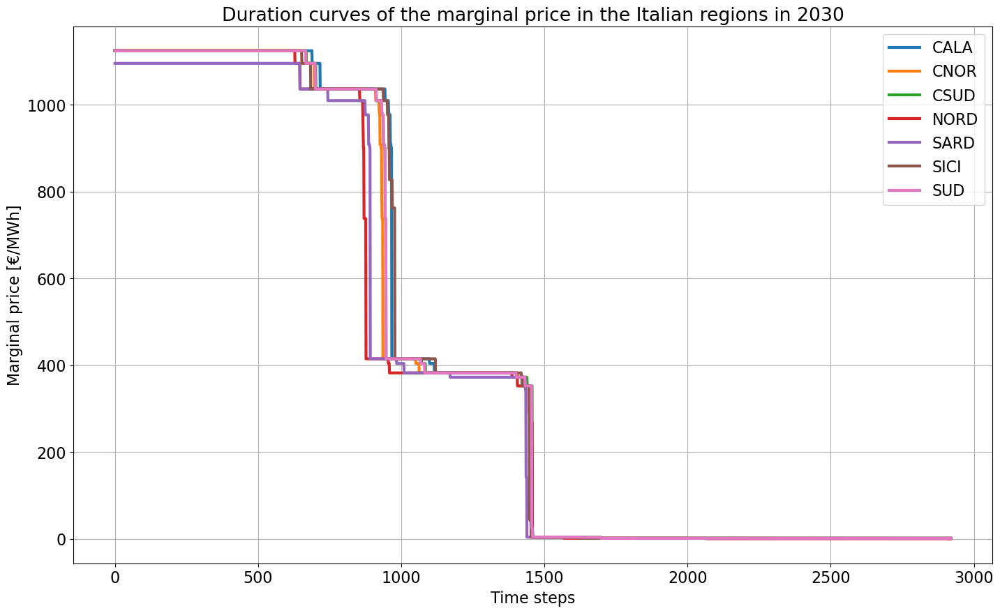

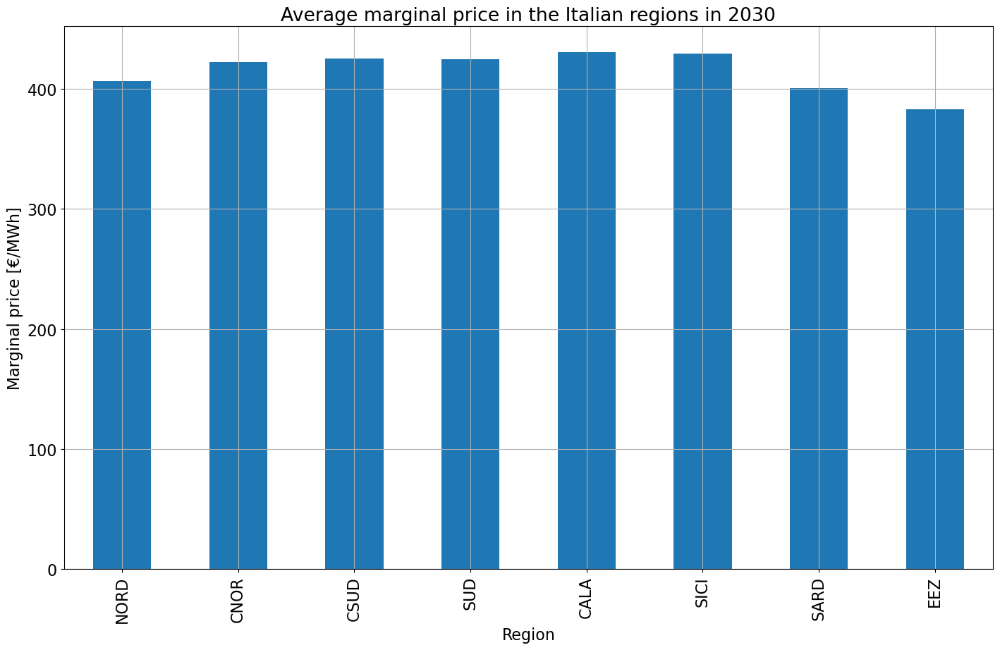

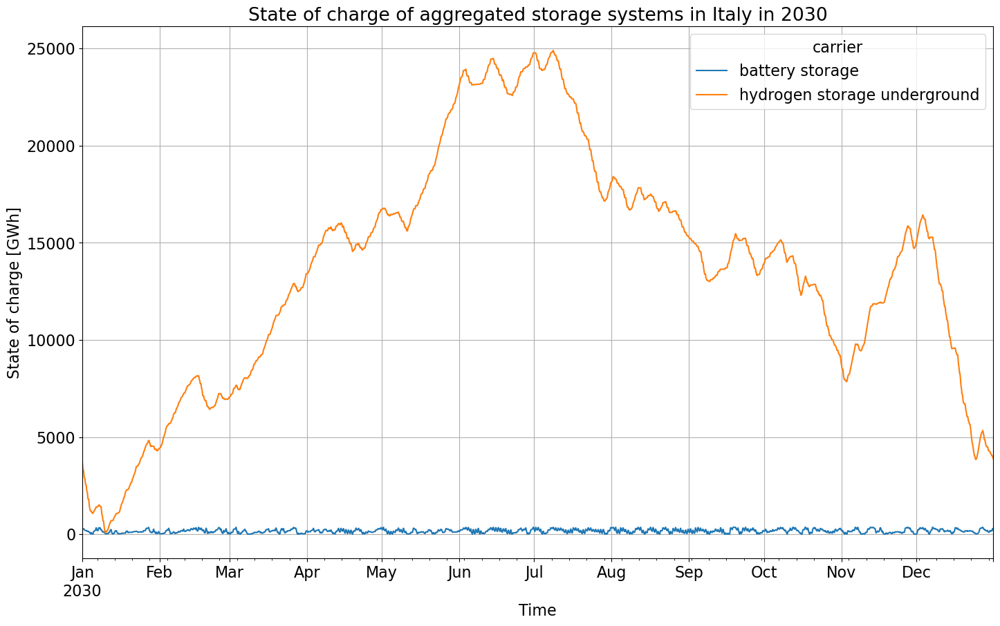

In [449]:
if n.objective > 0:
    capacities_20_PV = inst_cap_plot()
    colors = ["grey", "indianred", "yellow", "blue", "aquamarine", "black", "dodgerblue", "gold", "yellowgreen", "magenta"]
    inst_cap_table(colors)
    gen_20_PV = gen_power_plot()
    gen_power_table(colors)
    storages_20_PV = inst_store_table()
    gen_curve_month_winter(colors)
    gen_curve_month_summer(colors)
    price_dur_curve_plot()
    price_regions_table()
    state_of_charge_plot()
    trans_line_20_PV = trans_lines_table()
    trans_line_20_PV

In [450]:
stats_20_PV = n.statistics()

### **4.3.3** 40% PV

In [451]:
pv_sens_analysis(0.4)
n.lopf(solver_name='gurobi')

2023-02-05 10:54:37,834 INFO Prepare linear problem
2023-02-05 10:54:40,434 INFO Total preparation time: 2.59s
2023-02-05 10:54:40,435 INFO Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/k2/pp6kkkdd5fv3y276km0t2cl00000gn/T/pypsa-problem-v6y27ei_.lp
Reading time = 1.69 seconds
obj: 578161 rows, 256997 columns, 1154927 nonzeros
Gurobi Optimizer version 10.0.0 build v10.0.0rc2 (mac64[x86])

CPU model: Intel(R) Core(TM) i5-5257U CPU @ 2.70GHz
Thread count: 2 physical cores, 4 logical processors, using up to 4 threads

Optimize a model with 578161 rows, 256997 columns and 1154927 nonzeros
Model fingerprint: 0x290c5b69
Coefficient statistics:
  Matrix range     [1e-06, 5e+02]
  Objective range  [3e-02, 3e+05]
  Bounds range     [1e+03, 9e+04]
  RHS range        [2e+01, 2e+04]
Presolve removed 331318 rows and 71438 columns
Presolve time: 1.31s
Presolved: 246843 rows, 185559 columns, 804299 nonzeros

Concurrent LP optimizer: dual simplex and barrier
Showing barrier log only...

Ordering time: 0.12s

Barrier statistics:
 Dense cols : 36
 Free vars  : 8796
 AA' NZ     : 7.823e+05
 Factor NZ  : 3.946e+06 (roughly 200 MB of memory)
 Fact

  95   4.30323593e+10  4.30323591e+10  1.66e-05 9.62e-07  5.43e-04    57s
  96   4.30323592e+10  4.30323592e+10  7.13e-07 1.44e-07  3.52e-05    57s
  97   4.30323592e+10  4.30323592e+10  2.44e-07 1.37e-07  9.07e-08    58s
  98   4.30323592e+10  4.30323592e+10  2.41e-07 1.43e-07  3.53e-09    58s

Barrier solved model in 98 iterations and 58.13 seconds (17.01 work units)
Optimal objective 4.30323592e+10

Crossover log...

   16880 DPushes remaining with DInf 0.0000000e+00                58s
       0 DPushes remaining with DInf 0.0000000e+00                60s

   31505 PPushes remaining with PInf 7.1275083e-06                60s
    8795 PPushes remaining with PInf 0.0000000e+00                65s
       0 PPushes remaining with PInf 0.0000000e+00                66s

  Push phase complete: Pinf 0.0000000e+00, Dinf 1.2149195e-08     66s


Solved with barrier
Iteration    Objective       Primal Inf.    Dual Inf.      Time
   40276    4.3032359e+10   0.000000e+00   0.000000e+00     67s

Sol

2023-02-05 10:55:53,612 INFO Optimization successful. Objective value: 4.30e+10


('ok', 'optimal')

In [452]:
tot_cost_40_PV = n.objective/1e9     # billion €/year
system_cost_40_PV = system_cost(n)
marg_price_region_40_PV = n.buses_t.marginal_price.mean()

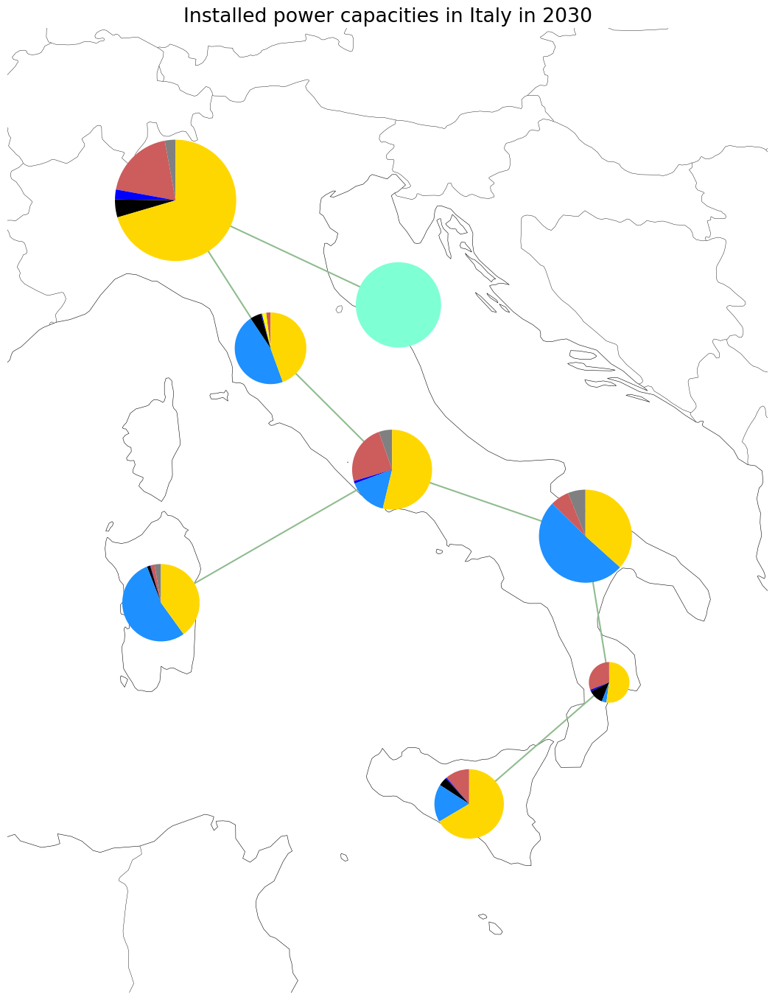

<Figure size 640x480 with 0 Axes>

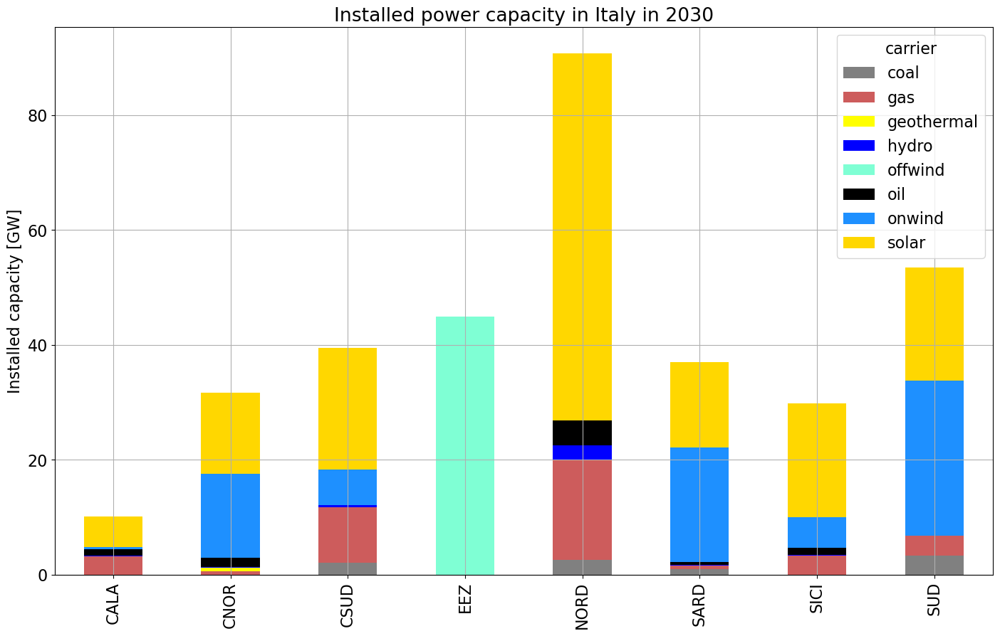

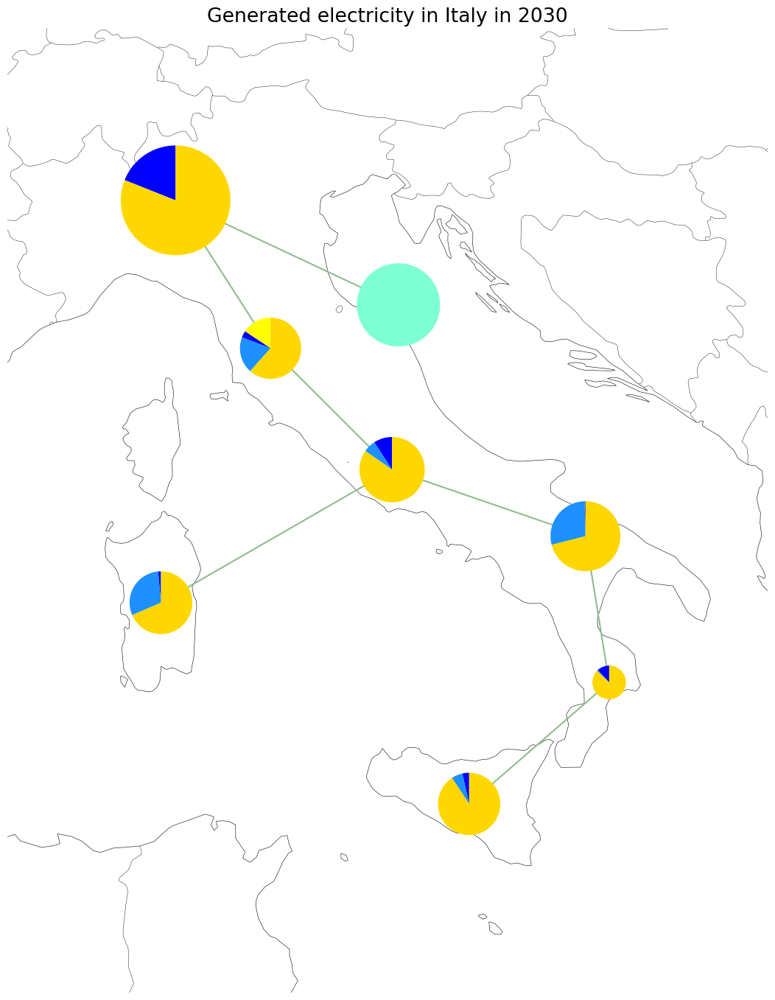

<Figure size 640x480 with 0 Axes>

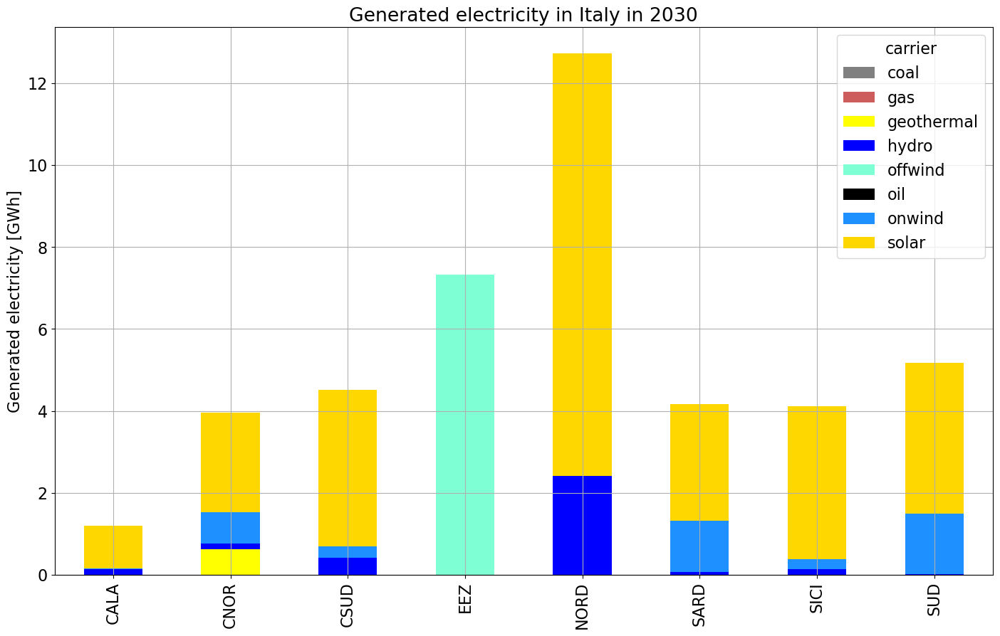

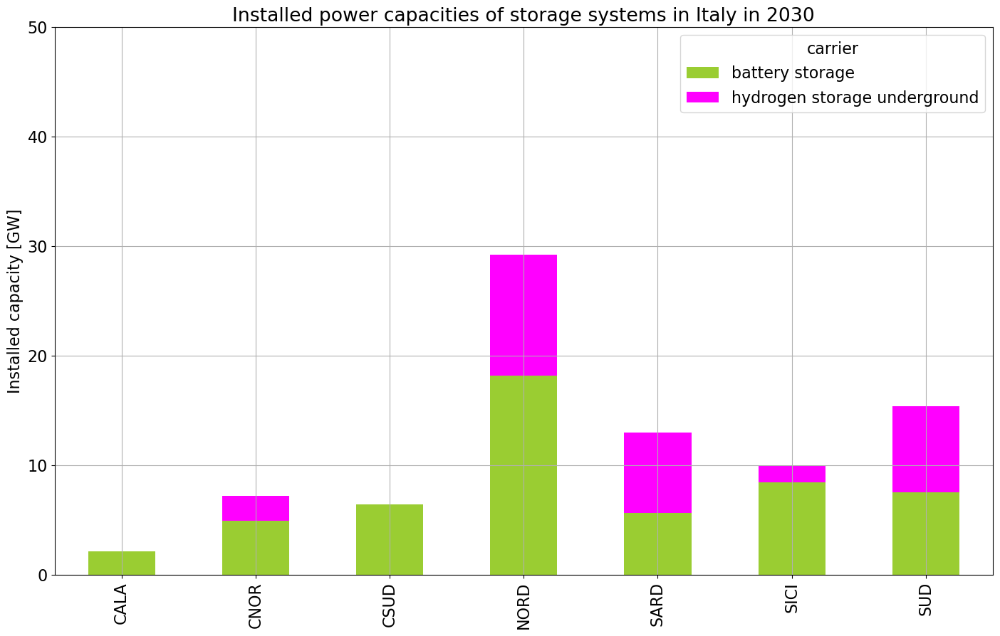

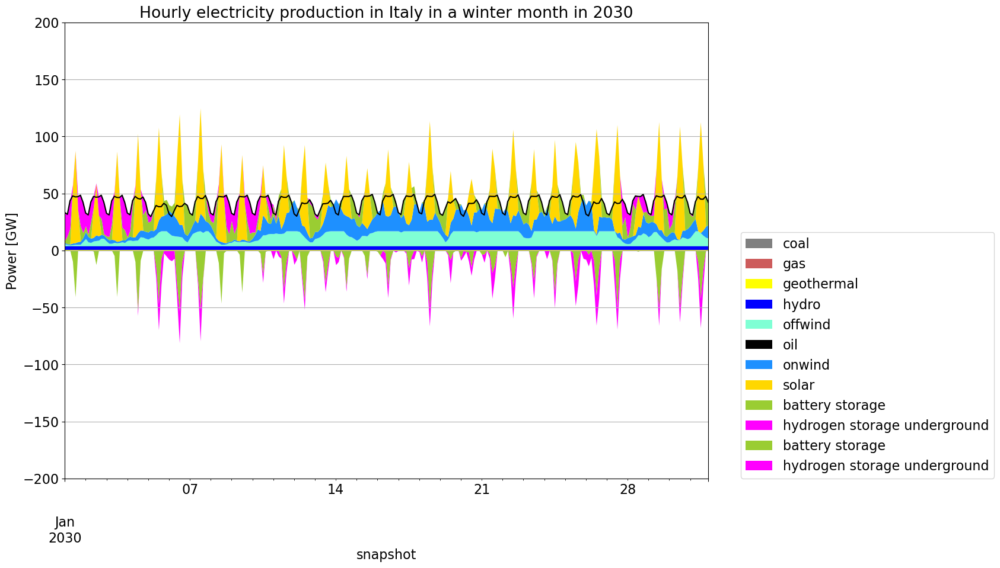

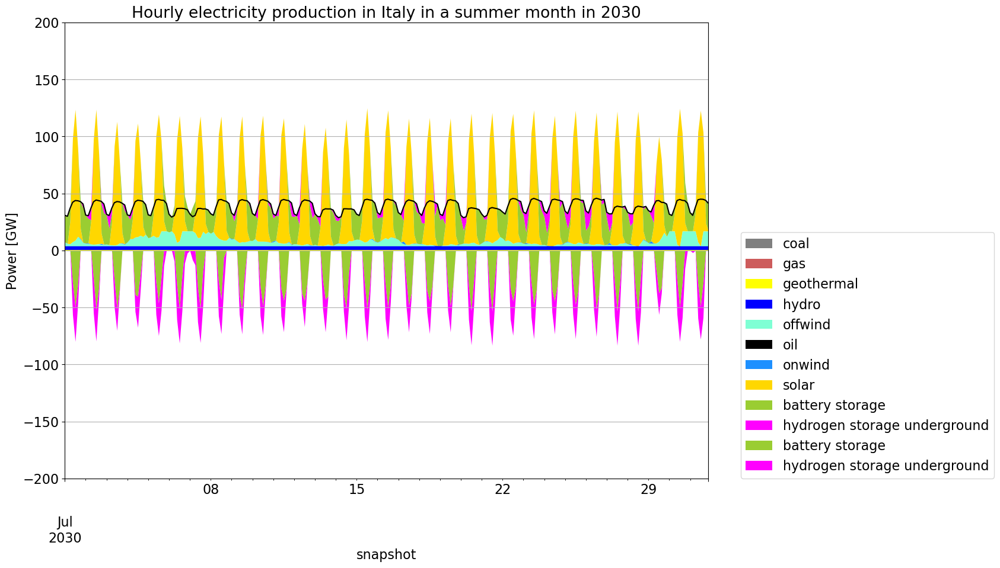

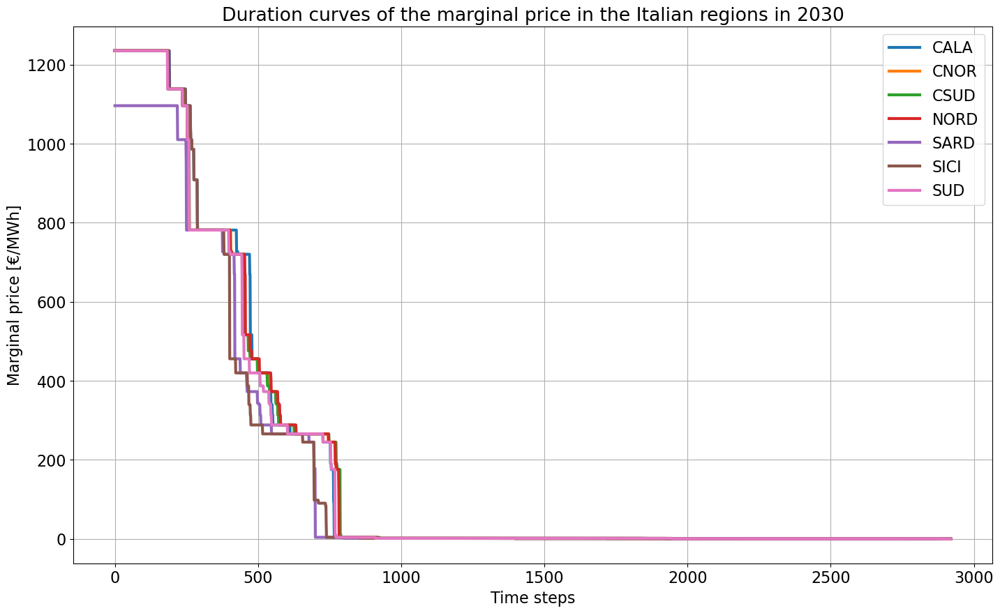

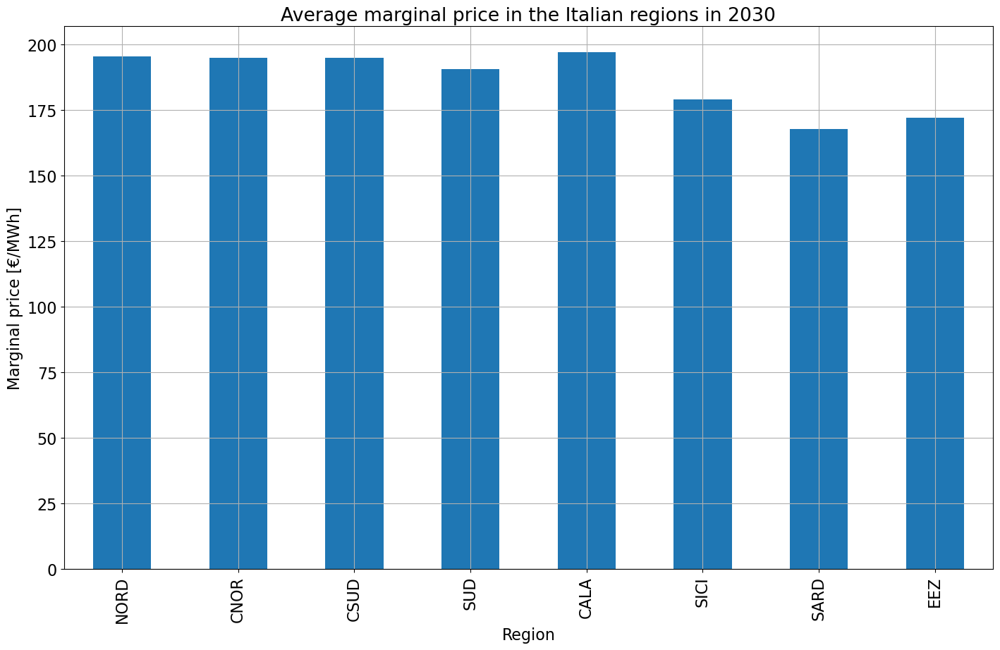

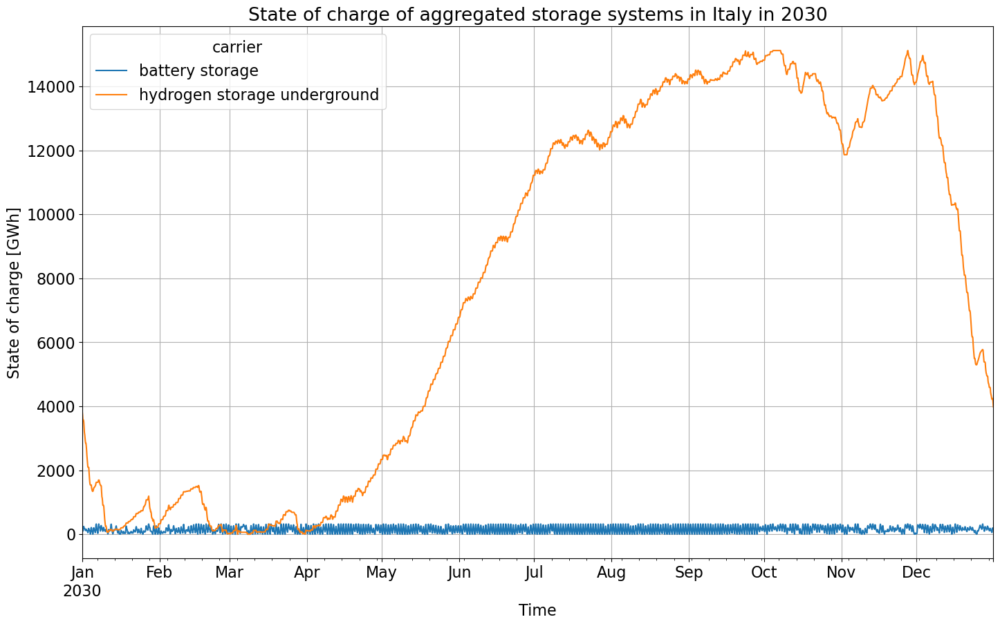

In [453]:
if n.objective > 0:
    capacities_40_PV = inst_cap_plot()
    colors = ["grey", "indianred", "yellow", "blue", "aquamarine", "black", "dodgerblue", "gold", "yellowgreen", "magenta"]
    inst_cap_table(colors)
    gen_40_PV = gen_power_plot()
    gen_power_table(colors)
    storages_40_PV = inst_store_table()
    gen_curve_month_winter(colors)
    gen_curve_month_summer(colors)
    price_dur_curve_plot()
    price_regions_table()
    state_of_charge_plot()
    trans_line_40_PV = trans_lines_table()
    trans_line_40_PV

In [454]:
stats_40_PV = n.statistics()

### **4.3.4** 60% PV

In [455]:
pv_sens_analysis(0.6)
n.lopf(solver_name='gurobi')

2023-02-05 10:56:02,924 INFO Prepare linear problem
2023-02-05 10:56:05,161 INFO Total preparation time: 2.23s
2023-02-05 10:56:05,162 INFO Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/k2/pp6kkkdd5fv3y276km0t2cl00000gn/T/pypsa-problem-otpdf44_.lp
Reading time = 1.52 seconds
obj: 578161 rows, 256997 columns, 1154927 nonzeros
Gurobi Optimizer version 10.0.0 build v10.0.0rc2 (mac64[x86])

CPU model: Intel(R) Core(TM) i5-5257U CPU @ 2.70GHz
Thread count: 2 physical cores, 4 logical processors, using up to 4 threads

Optimize a model with 578161 rows, 256997 columns and 1154927 nonzeros
Model fingerprint: 0xd49384a8
Coefficient statistics:
  Matrix range     [1e-06, 5e+02]
  Objective range  [3e-02, 3e+05]
  Bounds range     [1e+03, 1e+05]
  RHS range        [2e+01, 2e+04]
Presolve removed 331318 rows and 71438 columns
Presolve time: 0.98s
Presolved: 246843 rows, 185559 columns, 804299 nonzeros

Concurrent LP optimizer: dual simplex and barrier
Showing barrier log only...

Ordering time: 0.10s

Barrier statistics:
 Dense cols : 36
 Free vars  : 8796
 AA' NZ     : 7.823e+05
 Factor NZ  : 3.946e+06 (roughly 200 MB of memory)
 Fact

Optimal objective 3.76427610e+10

Crossover log...

   21431 DPushes remaining with DInf 0.0000000e+00                42s
       0 DPushes remaining with DInf 0.0000000e+00                44s

   68827 PPushes remaining with PInf 1.8383429e-04                44s
   40292 PPushes remaining with PInf 1.5557649e-04                45s
    4136 PPushes remaining with PInf 0.0000000e+00                50s
       0 PPushes remaining with PInf 0.0000000e+00                51s

  Push phase complete: Pinf 0.0000000e+00, Dinf 9.8662439e-09     51s


Solved with barrier
Iteration    Objective       Primal Inf.    Dual Inf.      Time
   78279    3.7642761e+10   0.000000e+00   0.000000e+00     52s

Solved in 78279 iterations and 51.73 seconds (32.63 work units)
Optimal objective  3.764276100e+10


2023-02-05 10:57:02,851 INFO Optimization successful. Objective value: 3.76e+10


('ok', 'optimal')

In [456]:
tot_cost_60_PV = n.objective/1e9     # billion €/year
system_cost_60_PV = system_cost(n)
marg_price_region_60_PV = n.buses_t.marginal_price.mean()

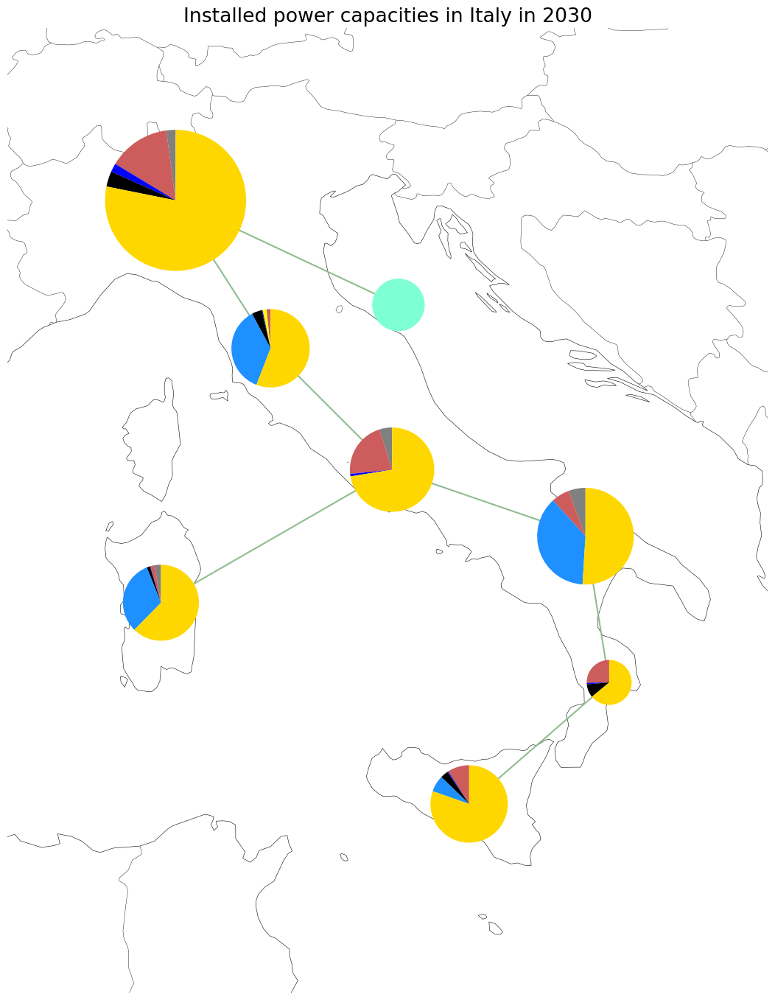

<Figure size 640x480 with 0 Axes>

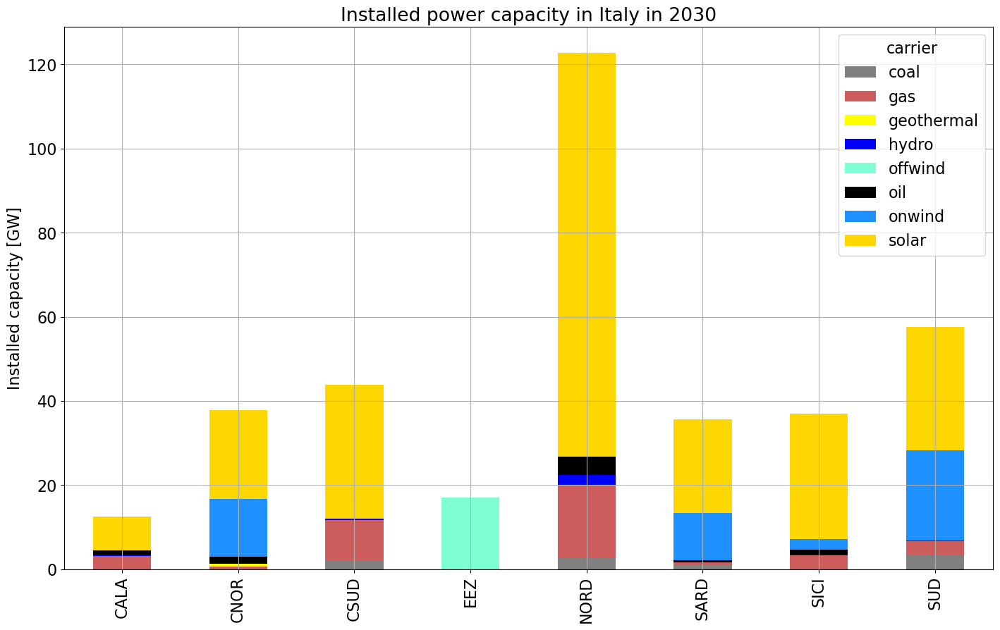

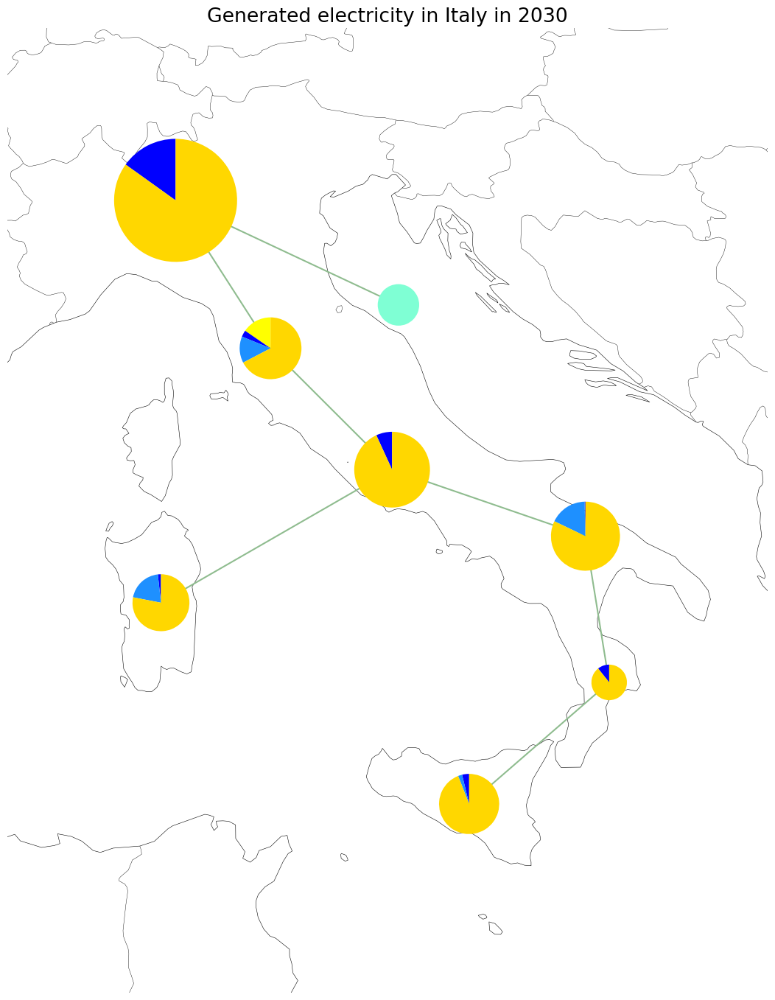

<Figure size 640x480 with 0 Axes>

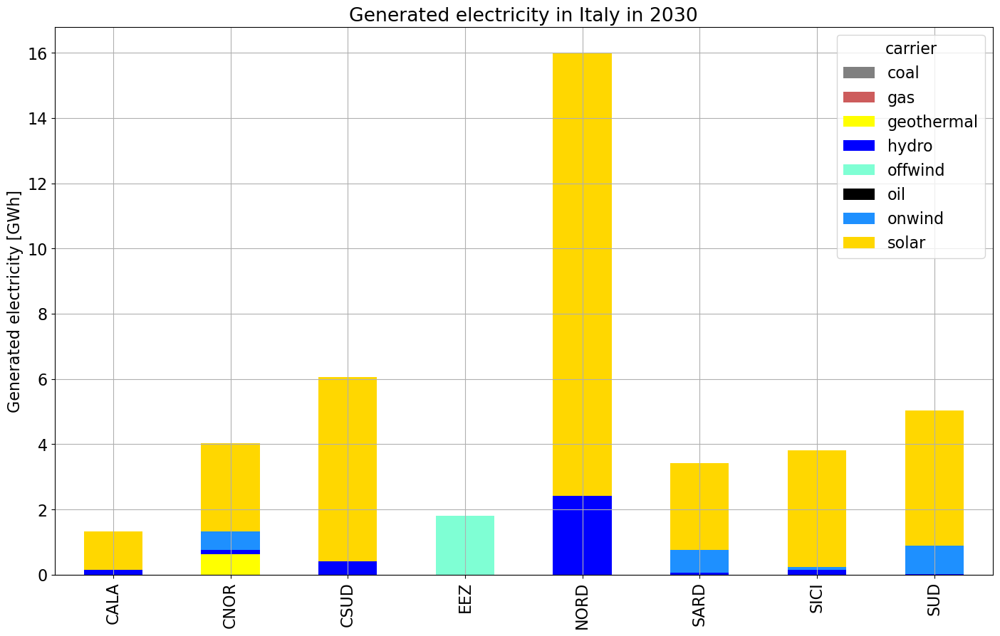

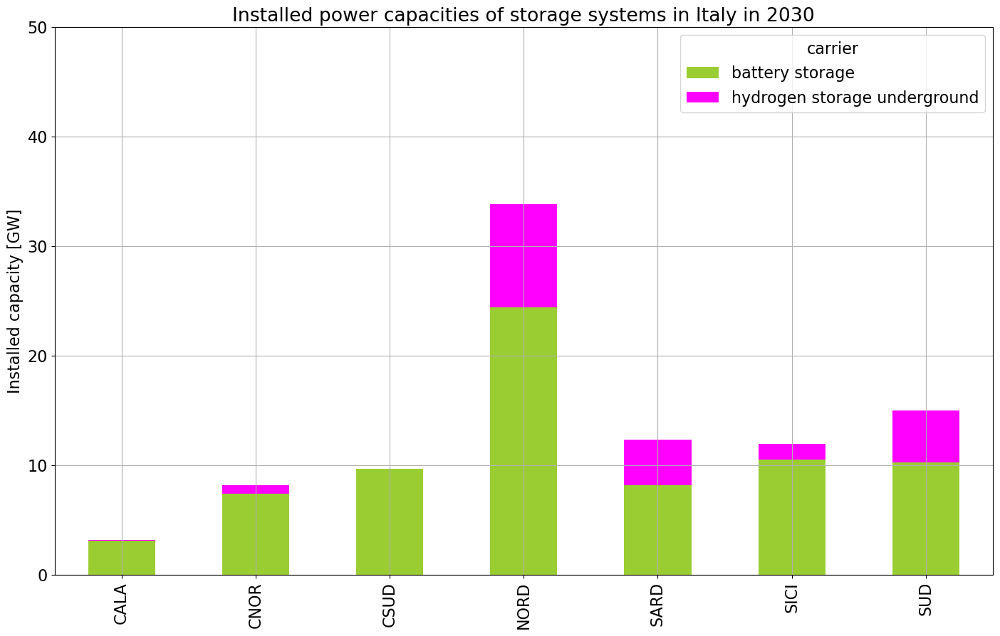

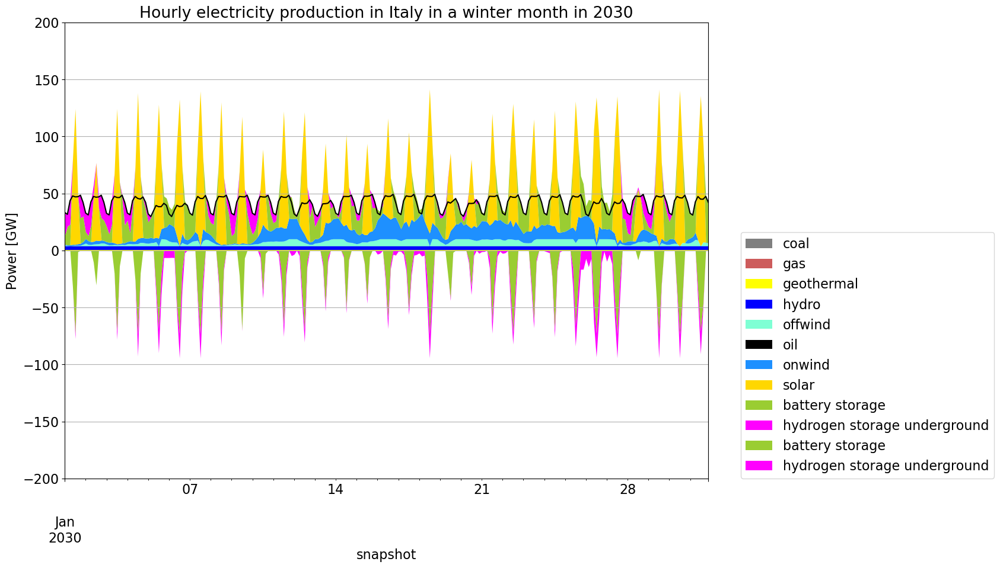

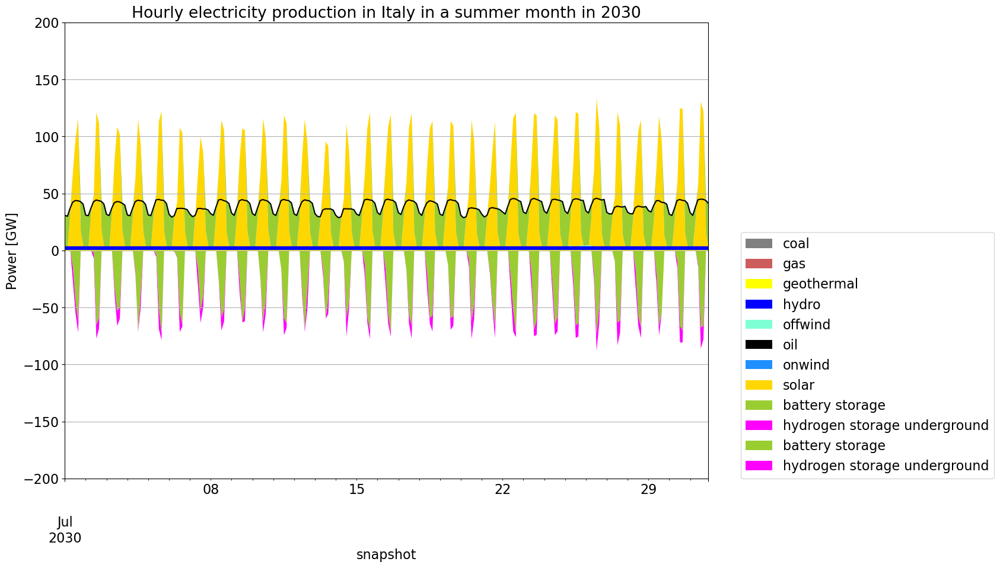

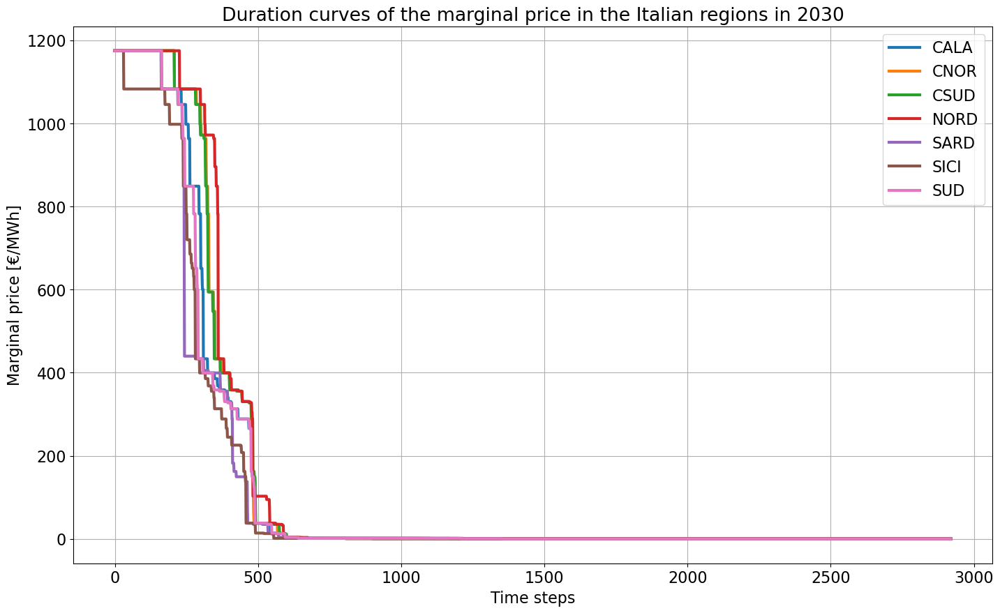

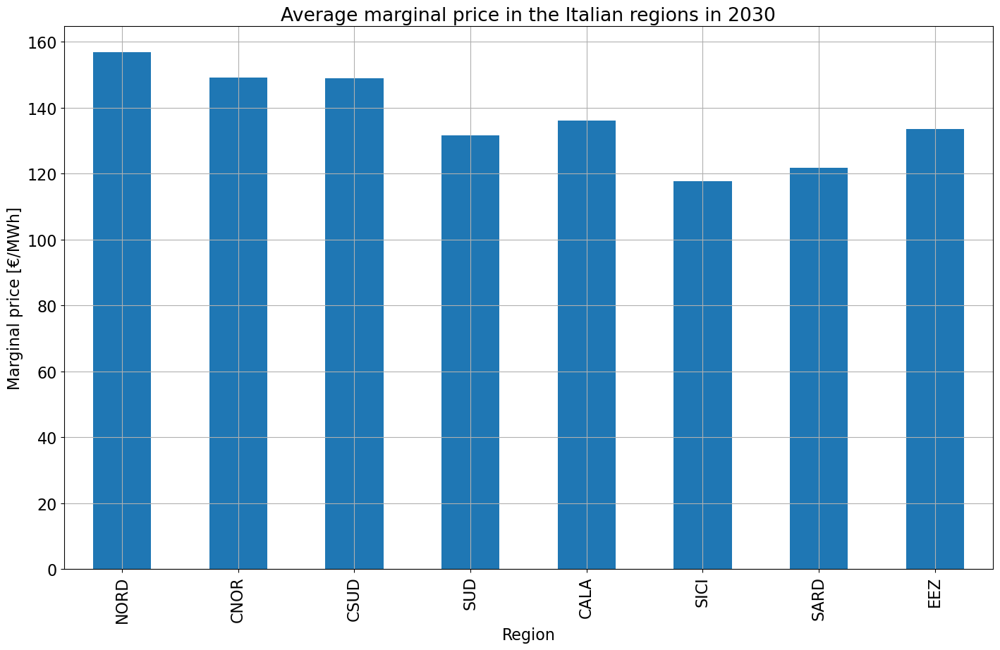

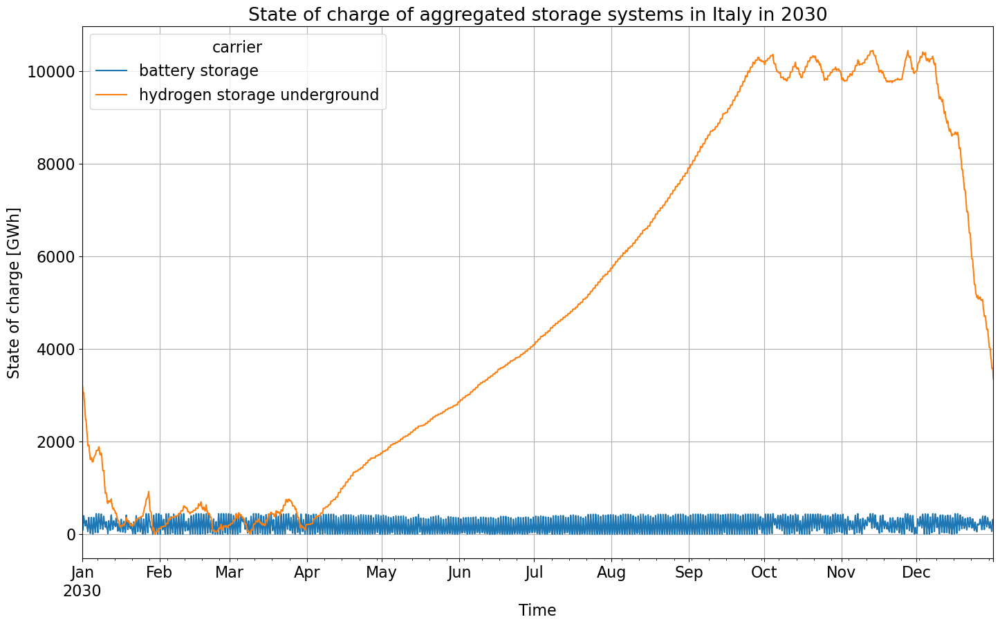

In [457]:
if n.objective > 0:
    capacities_60_PV = inst_cap_plot()
    colors = ["grey", "indianred", "yellow", "blue", "aquamarine", "black", "dodgerblue", "gold", "yellowgreen", "magenta"]
    inst_cap_table(colors)
    gen_60_PV = gen_power_plot()
    gen_power_table(colors)
    storages_60_PV = inst_store_table()
    gen_curve_month_winter(colors)
    gen_curve_month_summer(colors)
    price_dur_curve_plot()
    price_regions_table()
    state_of_charge_plot()
    trans_line_60_PV = trans_lines_table()
    trans_line_60_PV

In [458]:
stats_60_PV = n.statistics()

### **4.3.5** 80% PV

In [459]:
pv_sens_analysis(0.8)
n.lopf(solver_name='gurobi')

2023-02-05 10:57:12,560 INFO Prepare linear problem
2023-02-05 10:57:15,656 INFO Total preparation time: 3.09s
2023-02-05 10:57:15,658 INFO Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/k2/pp6kkkdd5fv3y276km0t2cl00000gn/T/pypsa-problem-wfqtfyau.lp
Reading time = 1.86 seconds
obj: 578161 rows, 256997 columns, 1154927 nonzeros
Gurobi Optimizer version 10.0.0 build v10.0.0rc2 (mac64[x86])

CPU model: Intel(R) Core(TM) i5-5257U CPU @ 2.70GHz
Thread count: 2 physical cores, 4 logical processors, using up to 4 threads

Optimize a model with 578161 rows, 256997 columns and 1154927 nonzeros
Model fingerprint: 0x8fdee8d8
Coefficient statistics:
  Matrix range     [1e-06, 5e+02]
  Objective range  [3e-02, 3e+05]
  Bounds range     [1e+03, 1e+05]
  RHS range        [2e+01, 2e+04]
Presolve removed 331318 rows and 71438 columns
Presolve time: 1.25s
Presolved: 246843 rows, 185559 columns, 804299 nonzeros

Concurrent LP optimizer: dual simplex and barrier
Showing barrier log only...

Ordering time: 0.10s

Barrier statistics:
 Dense cols : 36
 Free vars  : 8796
 AA' NZ     : 7.823e+05
 Factor NZ  : 3.946e+06 (roughly 200 MB of memory)
 Fact


  Push phase complete: Pinf 0.0000000e+00, Dinf 3.0742516e+02    112s

Iteration    Objective       Primal Inf.    Dual Inf.      Time
  121450    3.5629216e+10   0.000000e+00   3.074252e+02    112s

Solved with barrier
  121453    3.5629216e+10   0.000000e+00   0.000000e+00    113s

Solved in 121453 iterations and 112.73 seconds (107.47 work units)
Optimal objective  3.562921619e+10


2023-02-05 10:59:15,516 INFO Optimization successful. Objective value: 3.56e+10


('ok', 'optimal')

In [460]:
tot_cost_80_PV = n.objective/1e9     # billion €/year
system_cost_80_PV = system_cost(n)
marg_price_region_80_PV = n.buses_t.marginal_price.mean()

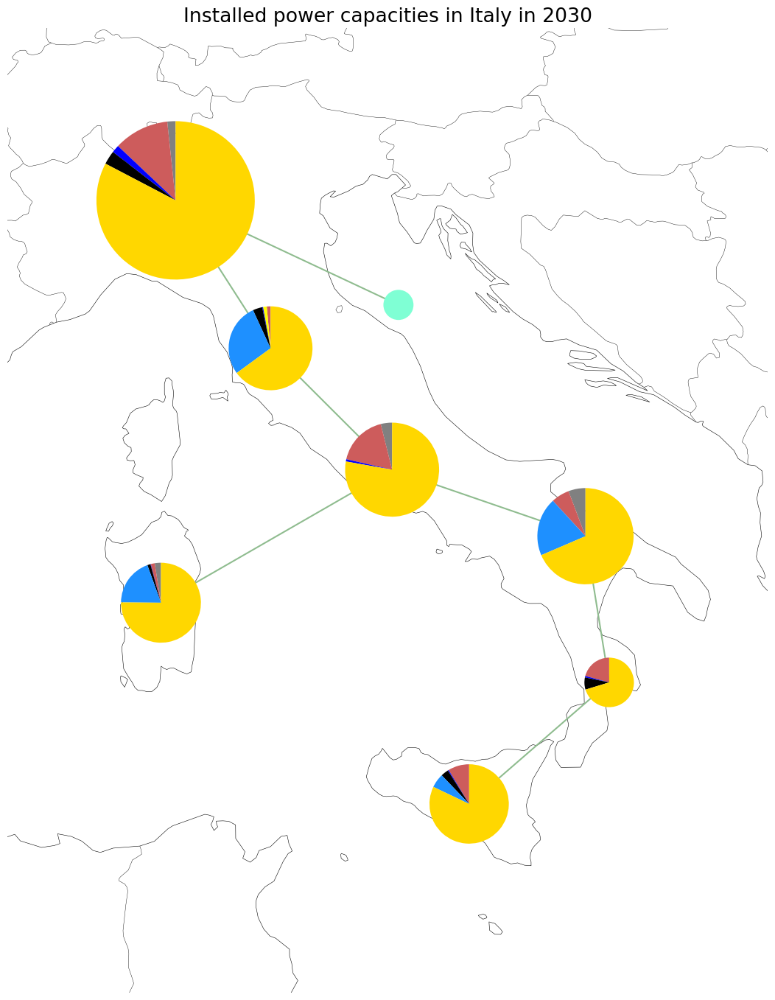

<Figure size 640x480 with 0 Axes>

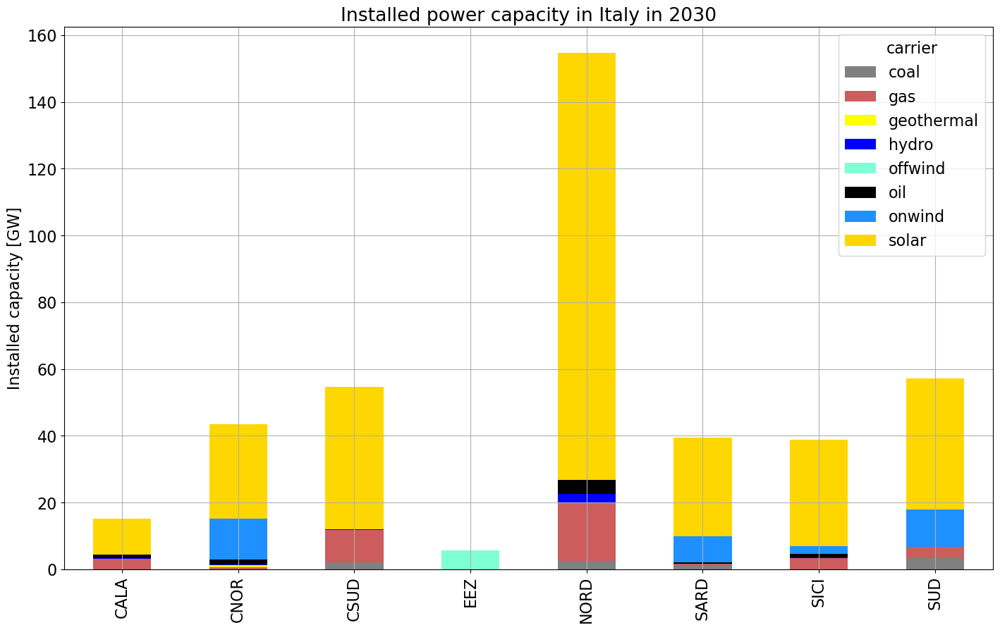

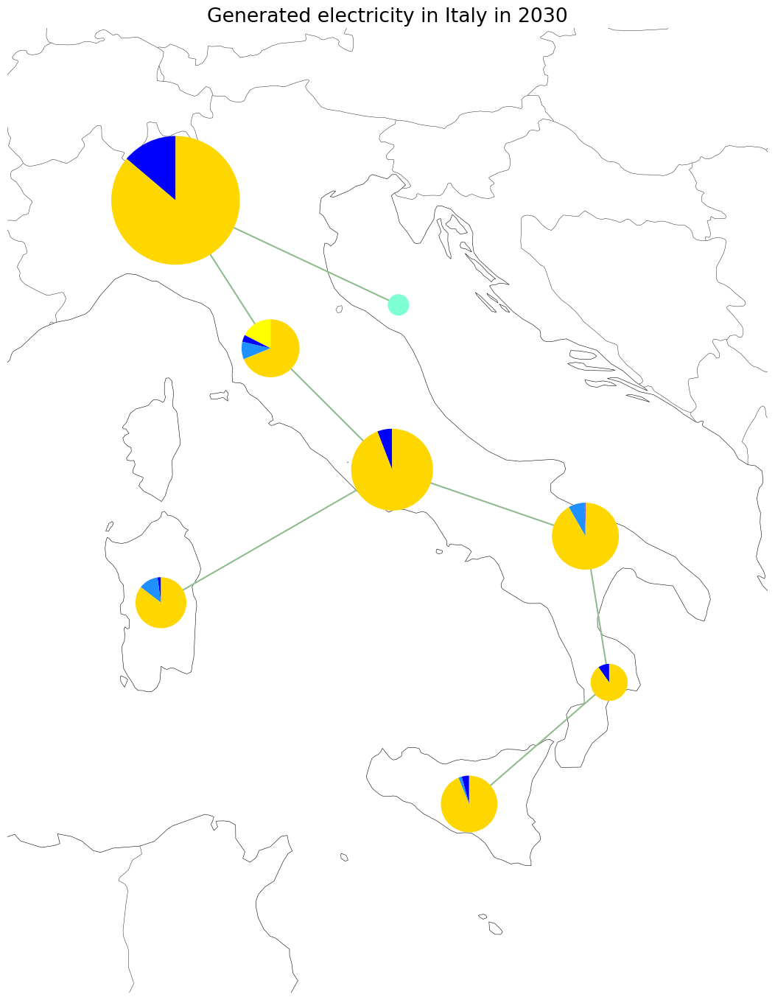

<Figure size 640x480 with 0 Axes>

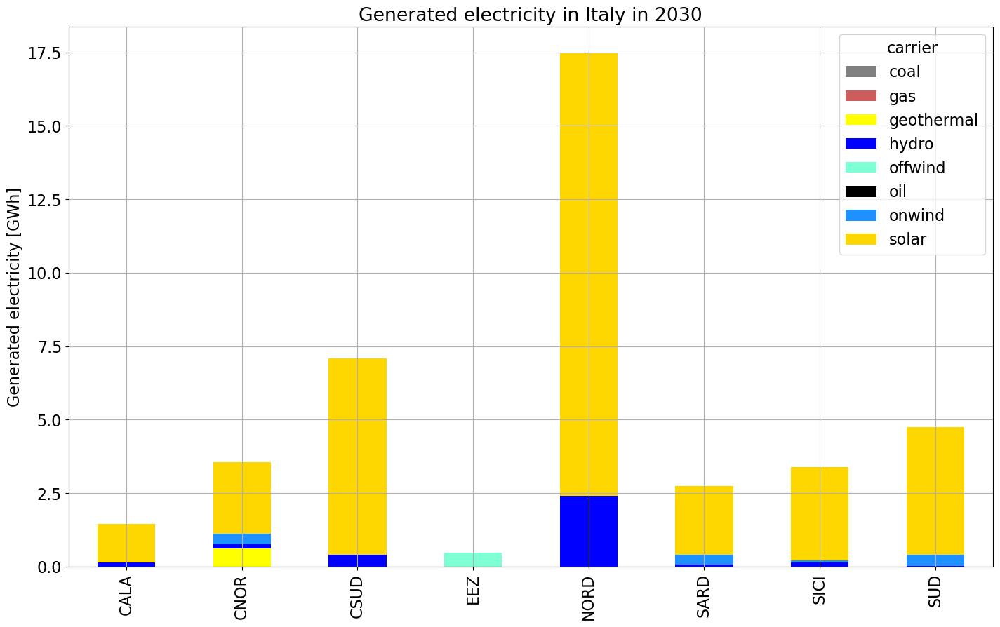

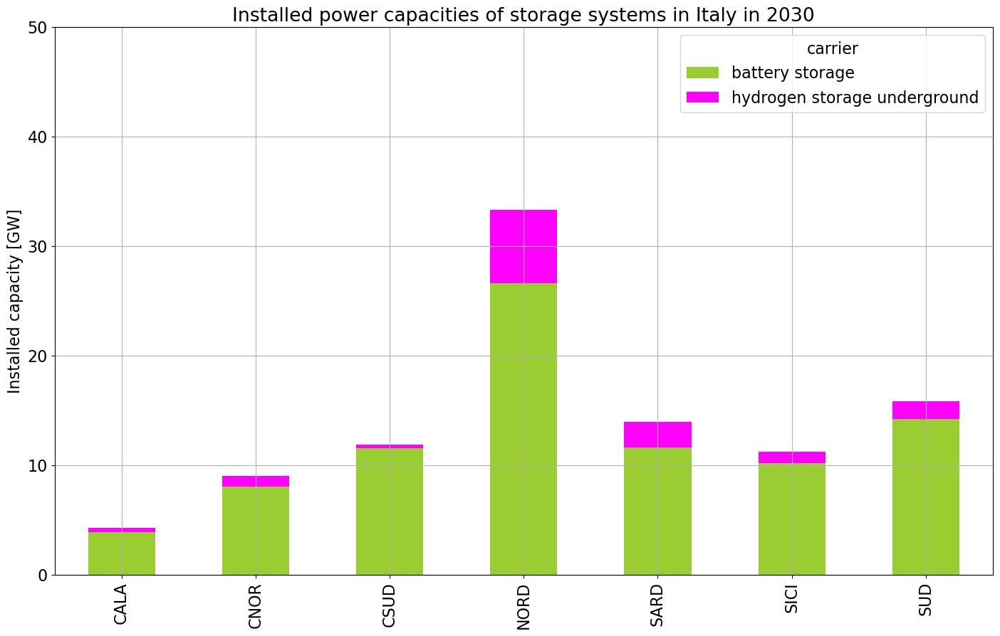

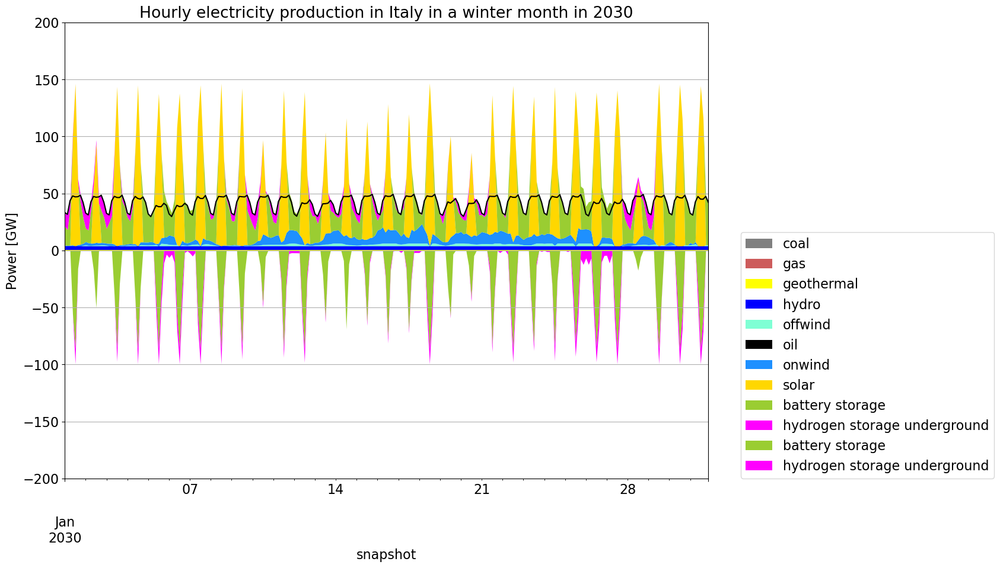

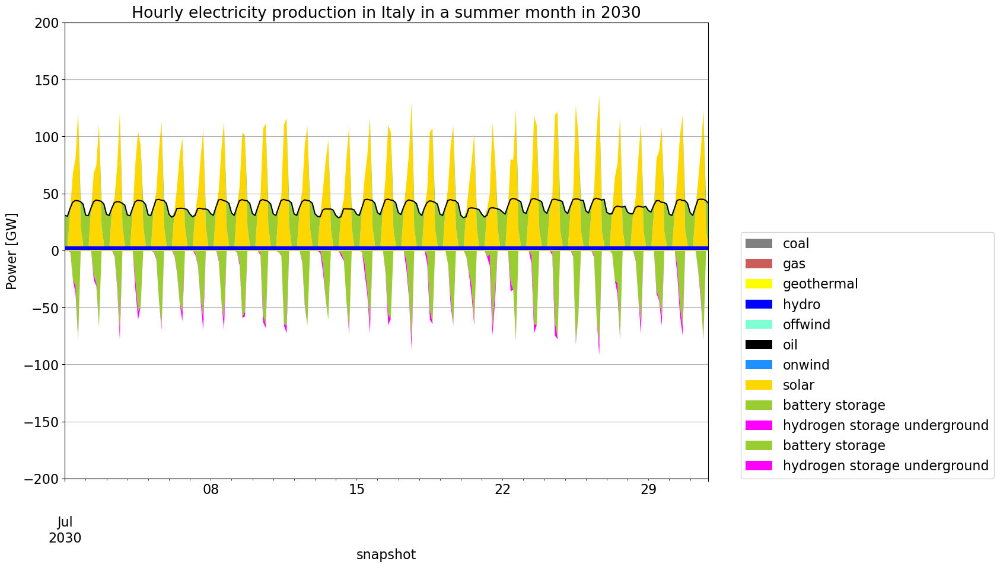

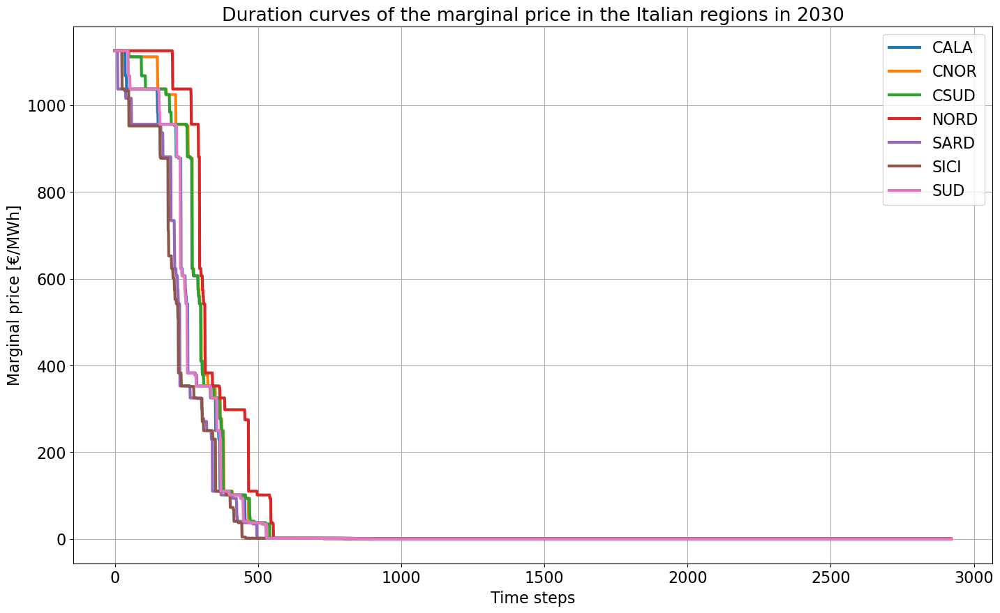

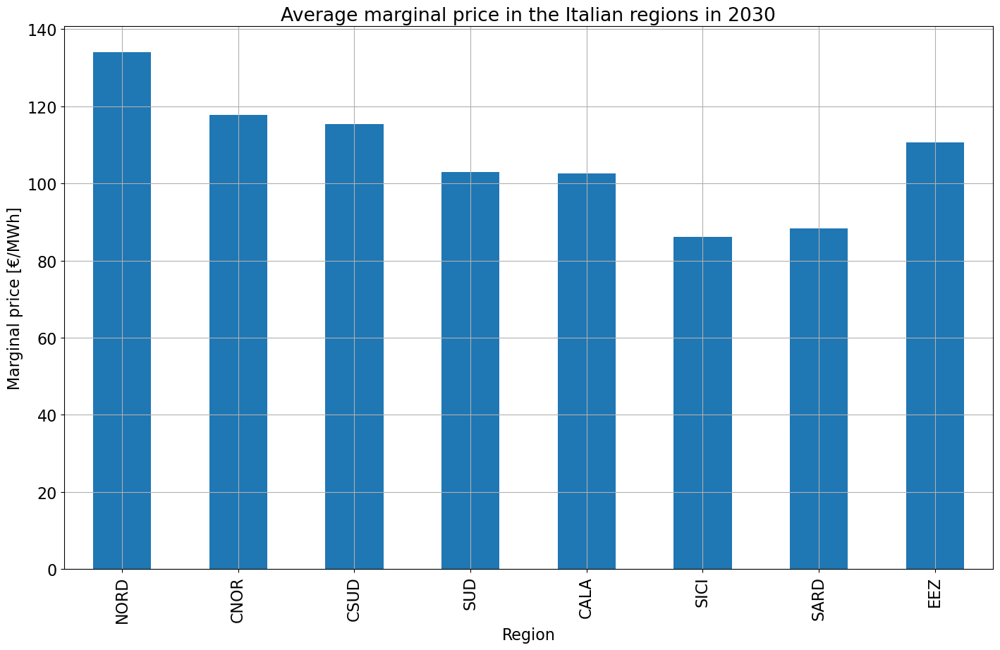

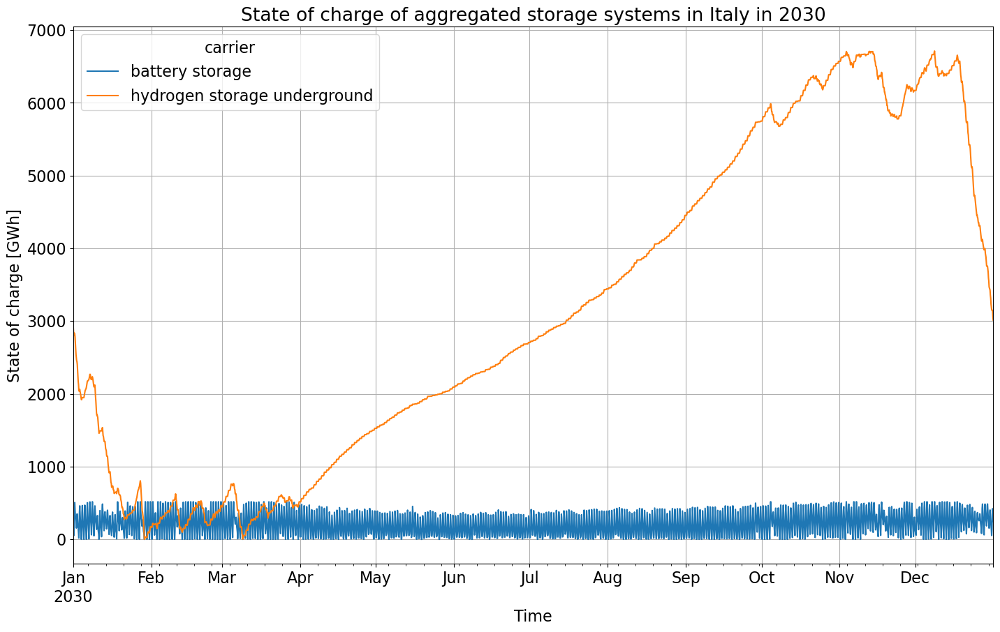

In [461]:
if n.objective > 0:
    capacities_80_PV = inst_cap_plot()
    colors = ["grey", "indianred", "yellow", "blue", "aquamarine", "black", "dodgerblue", "gold", "yellowgreen", "magenta"]
    inst_cap_table(colors)
    gen_80_PV = gen_power_plot()
    gen_power_table(colors)
    storages_80_PV = inst_store_table()
    gen_curve_month_winter(colors)
    gen_curve_month_summer(colors)
    price_dur_curve_plot()
    price_regions_table()
    state_of_charge_plot()
    trans_line_80_PV = trans_lines_table()
    trans_line_80_PV

In [462]:
stats_80_PV = n.statistics()

### **4.3.6** Comparison

In [463]:
sensit_analysis_pv = pd.DataFrame(index=italy_geom.index)

if tot_cost_0_PV > 0: 
    sensit_analysis_pv["0% PV potential"] = capacities_0_PV.unstack().solar
else: sensit_analysis_pv["0% PV potential"] = 0.0

if tot_cost_20_PV > 0: 
    sensit_analysis_pv["20% PV potential"] = capacities_20_PV.unstack().solar
else: sensit_analysis_pv["20% PV potential"] = 0.0 

sensit_analysis_pv["40% PV potential"] = capacities_40_PV.unstack().solar
sensit_analysis_pv["60% PV potential"] = capacities_60_PV.unstack().solar
sensit_analysis_pv["80% PV potential"] = capacities_80_PV.unstack().solar
sensit_analysis_pv["100% PV potential"] = capacities_zero_emissions.unstack().solar

sensit_analysis_pv.fillna(0, inplace=True)

sensit_analysis_pv.div(1000).round(2)

,0% PV potential,20% PV potential,40% PV potential,60% PV potential,80% PV potential,100% PV potential
e_market,,,,,,
CALA,0.0,2.66,5.32,7.98,10.64,13.30
CNOR,0.0,7.05,14.10,21.15,28.20,35.25
CSUD,0.0,10.61,21.22,31.83,42.44,53.05
NORD,0.0,31.99,63.98,95.97,127.96,153.26
SARD,0.0,7.40,14.81,22.21,29.62,12.09
SICI,0.0,9.91,19.82,29.72,31.89,25.39
SUD,0.0,9.79,19.58,29.37,39.16,48.95


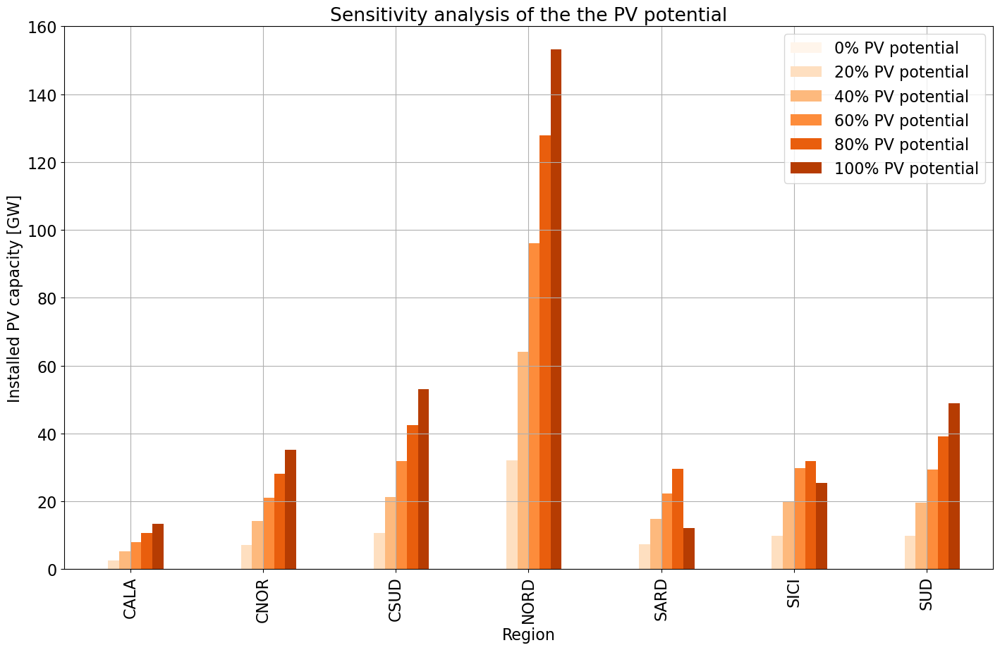

In [464]:
colors = cm.Oranges(np.linspace(0, 1, len(sensit_analysis_pv)))

(sensit_analysis_pv/1000).plot.bar( figsize=(17,10),
                                color=colors,
                                grid=True,
                                xlabel="Region",
                                ylabel="Installed PV capacity [GW]",
                                title="Sensitivity analysis of the the PV potential",
                                ylim=[0,160]
)
plt.show()

In [465]:
sensit_analysis_wind = pd.DataFrame(index=joined.index)

if tot_cost_0_PV > 0: 
    sensit_analysis_wind["0% PV potential"] = capacities_0_PV.unstack().onwind
else: sensit_analysis_wind["0% PV potential"] = 0.0

if tot_cost_20_PV > 0: 
    sensit_analysis_wind["20% PV potential"] = capacities_20_PV.unstack().onwind
else: sensit_analysis_wind["20% PV potential"] = 0.0 

sensit_analysis_wind["40% PV potential"] = capacities_40_PV.unstack().onwind
sensit_analysis_wind["60% PV potential"] = capacities_60_PV.unstack().onwind
sensit_analysis_wind["80% PV potential"] = capacities_80_PV.unstack().onwind
sensit_analysis_wind["100% PV potential"] = capacities_zero_emissions.unstack().onwind

if tot_cost_0_PV > 0: 
    sensit_analysis_wind.loc["EEZ","0% PV potential"] = capacities_0_PV.unstack().loc["EEZ","offwind"]
else: sensit_analysis_wind.loc["EEZ","0% PV potential"] = 0.0

if tot_cost_20_PV > 0: 
    sensit_analysis_wind.loc["EEZ","20% PV potential"] = capacities_20_PV.unstack().loc["EEZ","offwind"]
else: sensit_analysis_wind.loc["EEZ","20% PV potential"] = 0.0 

sensit_analysis_wind.loc["EEZ","40% PV potential"] = capacities_40_PV.unstack().loc["EEZ","offwind"]
sensit_analysis_wind.loc["EEZ","60% PV potential"] = capacities_60_PV.unstack().loc["EEZ","offwind"]
sensit_analysis_wind.loc["EEZ","80% PV potential"] = capacities_80_PV.unstack().loc["EEZ","offwind"]
sensit_analysis_wind.loc["EEZ","100% PV potential"] = capacities_zero_emissions.unstack().loc["EEZ","offwind"]
sensit_analysis_wind.fillna(0, inplace=True)

sensit_analysis_wind.div(1000).round(2)

,0% PV potential,20% PV potential,40% PV potential,60% PV potential,80% PV potential,100% PV potential
EEZ,0.00,89.38,44.93,17.04,5.59,0.00
CALA,0.00,5.57,0.38,0.00,0.00,0.00
CNOR,14.64,14.64,14.64,13.72,12.23,14.64
CSUD,0.00,15.04,6.15,0.00,0.00,0.00
NORD,0.00,0.00,0.00,0.00,0.00,0.00
SARD,6.97,25.33,19.98,11.25,7.63,6.97
SICI,3.94,29.82,5.25,2.54,2.24,3.94
SUD,6.11,27.06,27.06,21.48,11.19,6.11


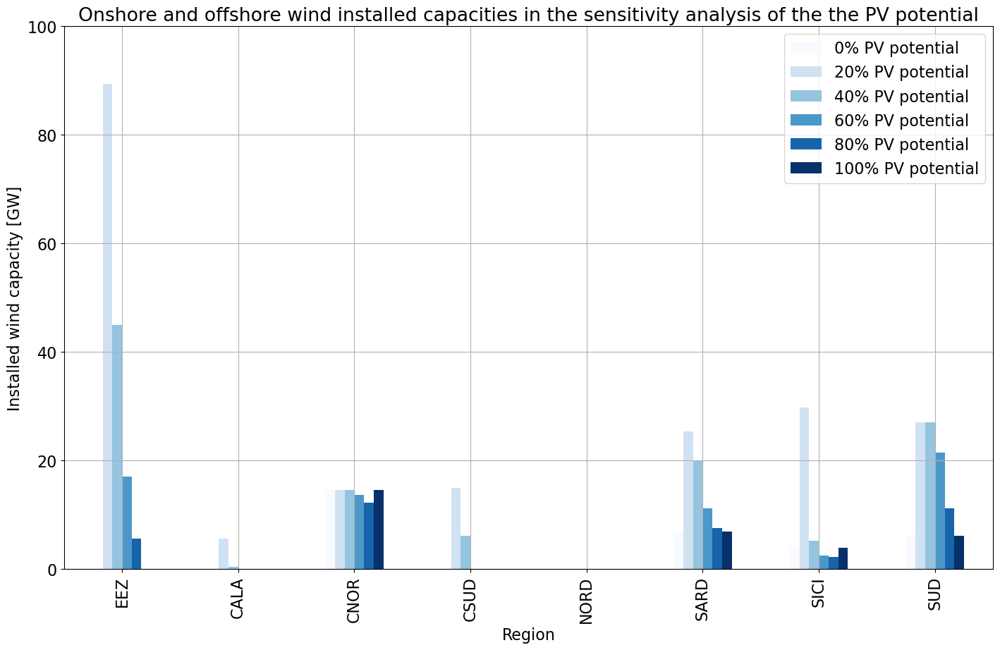

In [466]:
colors = cm.Blues(np.linspace(0, 1, len(sensit_analysis_wind.iloc[1:7])))

(sensit_analysis_wind/1000).plot.bar( figsize=(17,10),
                                color=colors,
                                grid=True,
                                xlabel="Region",
                                ylabel="Installed wind capacity [GW]",
                                title="Onshore and offshore wind installed capacities in the sensitivity analysis of the the PV potential",
                                ylim=[0,100]
)
plt.show()

In [467]:
sensit_analysis_lines = pd.DataFrame(index=transmissions.keys())

if tot_cost_0_PV > 0: 
    sensit_analysis_lines["0% PV potential"] = trans_line_0_PV.unstack()["Line capacity [MW]"]
else: sensit_analysis_lines["0% PV potential"] = 0.0

if tot_cost_20_PV > 0: 
    sensit_analysis_lines["20% PV potential"] = trans_line_20_PV.unstack()["Line capacity [MW]"]
else: sensit_analysis_lines["20% PV potential"] = 0.0 

sensit_analysis_lines["40% PV potential"] = trans_line_40_PV.unstack()["Line capacity [MW]"]
sensit_analysis_lines["60% PV potential"] = trans_line_60_PV.unstack()["Line capacity [MW]"]
sensit_analysis_lines["80% PV potential"] = trans_line_80_PV.unstack()["Line capacity [MW]"]
sensit_analysis_lines["100% PV potential"] = trans_line_zero_emissions.unstack()["Line capacity [MW]"]

sensit_analysis_lines.fillna(0, inplace=True)

sensit_analysis_lines.div(1000).round(2)

,0% PV potential,20% PV potential,40% PV potential,60% PV potential,80% PV potential,100% PV potential
NORD-->CNOR,5.34,5.02,5.00,5.00,5.62,5.34
CNOR-->CSUD,5.00,5.00,5.00,5.00,5.00,5.00
CSUD-->SUD,5.00,5.00,5.00,5.00,5.00,5.00
SUD-->CALA,1.50,1.50,1.50,1.50,1.50,1.50
CALA-->SICI,1.00,1.00,1.00,1.07,1.00,1.00
SARD-->CSUD,2.77,3.92,4.52,5.37,4.90,2.77
EEZ-->NORD,0.00,29.75,13.17,6.19,2.37,0.00


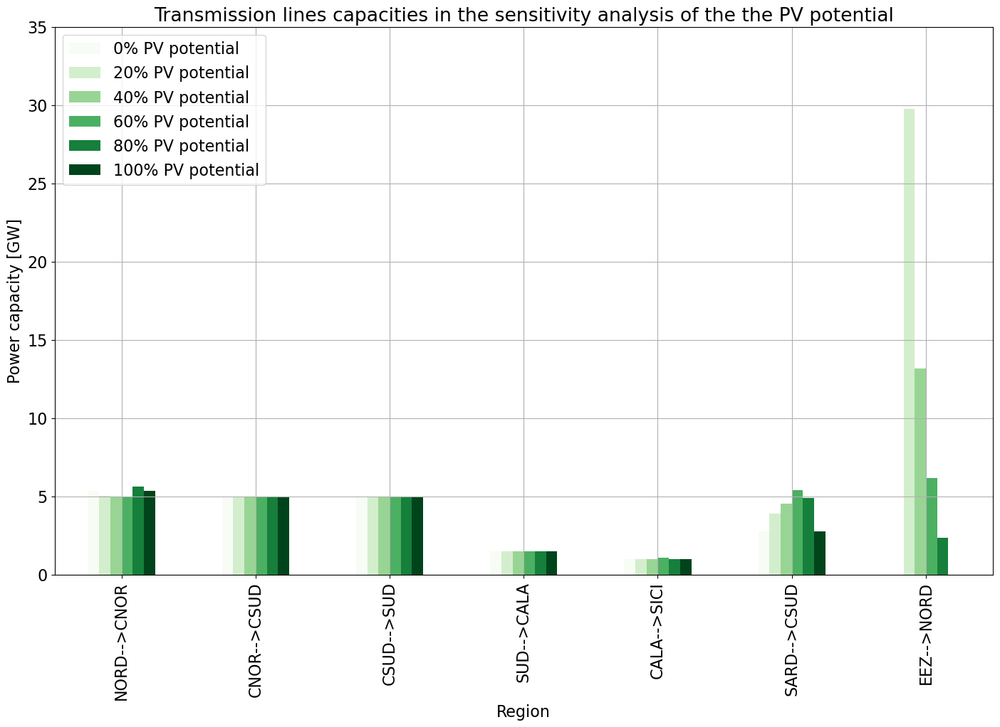

In [468]:
colors = cm.Greens(np.linspace(0, 1, len(sensit_analysis_lines.iloc[1:7])))

(sensit_analysis_lines/1000).plot.bar( figsize=(17,10),
                                color=colors,
                                grid=True,
                                xlabel="Region",
                                ylabel="Power capacity [GW]",
                                title="Transmission lines capacities in the sensitivity analysis of the the PV potential",
                                ylim=[0,35]
)
plt.show()

In [469]:
sensit_analysis_storages = pd.DataFrame(index=italy_geom.keys())

if tot_cost_0_PV > 0: 
    sensit_analysis_storages["0% PV potential"] = storages_0_PV["battery storage"]+storages_0_PV["hydrogen storage underground"]
else: sensit_analysis_storages["0% PV potential"] = 0.0

if tot_cost_20_PV > 0: 
    sensit_analysis_storages["20% PV potential"] = storages_20_PV["battery storage"]+storages_20_PV["hydrogen storage underground"]
else: sensit_analysis_storages["20% PV potential"] = 0.0 

sensit_analysis_storages["40% PV potential"] = storages_40_PV["battery storage"]+storages_40_PV["hydrogen storage underground"]
sensit_analysis_storages["60% PV potential"] = storages_60_PV["battery storage"]+storages_60_PV["hydrogen storage underground"]
sensit_analysis_storages["80% PV potential"] = storages_80_PV["battery storage"]+storages_80_PV["hydrogen storage underground"]
sensit_analysis_storages["100% PV potential"] = storages_zero_emiss["battery storage"]+storages_zero_emiss["hydrogen storage underground"]

sensit_analysis_storages.fillna(0, inplace=True)

sensit_analysis_storages.round(2)

,0% PV potential,20% PV potential,40% PV potential,60% PV potential,80% PV potential,100% PV potential
e_market,,,,,,
CALA,5.04,1.59,2.14,3.21,4.29,5.04
CNOR,11.73,7.44,7.22,8.18,9.02,11.73
CSUD,13.40,0.00,6.39,9.67,11.85,13.40
NORD,39.04,45.33,29.23,33.84,33.29,39.04
SARD,6.40,22.74,12.97,12.34,13.95,6.40
SICI,8.73,16.05,9.91,11.97,11.26,8.73
SUD,18.30,15.39,15.36,15.03,15.81,18.30


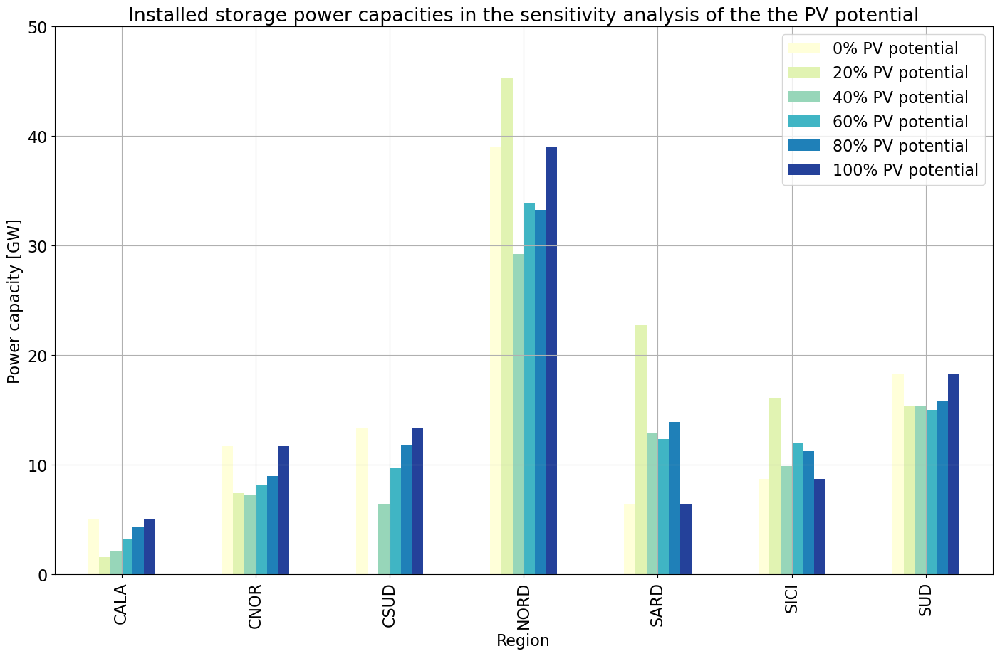

In [470]:
colors = cm.YlGnBu(np.linspace(0, 1, len(sensit_analysis_storages)))

sensit_analysis_storages.plot.bar( figsize=(17,10),
                                color=colors,
                                grid=True,
                                xlabel="Region",
                                ylabel="Power capacity [GW]",
                                title="Installed storage power capacities in the sensitivity analysis of the the PV potential",
                                ylim=[0,50]
)
plt.show()

## **4.4.** Sensitivity Analysis 2: Nuclear potential

First we remove the PV capacity limit:

In [471]:
pv_sens_analysis(1)

In [472]:
for region in joined.index:
    n.add(
        "Generator",
        f"nuclear {region}",
        bus=region,
        carrier="nuclear",
        p_max_pu=0.85, # capacity factor
        p_min_pu=0.85, # capacity factor
        capital_cost=costs.at["nuclear", "capital_cost"],
        marginal_cost=costs.at["nuclear", "marginal_cost"],
        efficiency=costs.at["solar", "efficiency"],
        p_nom_extendable=True,
    )

In [473]:
#for region in joined.index:
#    n.remove("Generator",f"nuclear {region}")

In [474]:
n.lopf(solver_name='gurobi')

2023-02-05 10:59:27,048 INFO Prepare linear problem
2023-02-05 10:59:29,434 INFO Total preparation time: 2.38s
2023-02-05 10:59:29,435 INFO Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/k2/pp6kkkdd5fv3y276km0t2cl00000gn/T/pypsa-problem-wysl71xc.lp
Reading time = 1.60 seconds
obj: 624881 rows, 280365 columns, 1271727 nonzeros
Gurobi Optimizer version 10.0.0 build v10.0.0rc2 (mac64[x86])

CPU model: Intel(R) Core(TM) i5-5257U CPU @ 2.70GHz
Thread count: 2 physical cores, 4 logical processors, using up to 4 threads

Optimize a model with 624881 rows, 280365 columns and 1271727 nonzeros
Model fingerprint: 0xa51f8f0b
Coefficient statistics:
  Matrix range     [1e-06, 5e+02]
  Objective range  [3e-02, 7e+05]
  Bounds range     [1e+03, 2e+05]
  RHS range        [2e+01, 2e+04]
Presolve removed 372227 rows and 88987 columns
Presolve time: 1.03s
Presolved: 252654 rows, 191378 columns, 778295 nonzeros

Concurrent LP optimizer: dual simplex and barrier
Showing barrier log only...

Ordering time: 0.10s

Barrier statistics:
 Dense cols : 44
 Free vars  : 14607
 AA' NZ     : 7.301e+05
 Factor NZ  : 3.896e+06 (roughly 200 MB of memory)
 Fac

2023-02-05 11:01:30,238 INFO Optimization successful. Objective value: 3.43e+10


('ok', 'optimal')

In [475]:
tot_cost_nuclear = n.objective/1e9     # billion €/year
system_cost_nuclear = system_cost(n)
marg_price_region_nuclear = n.buses_t.marginal_price.mean()

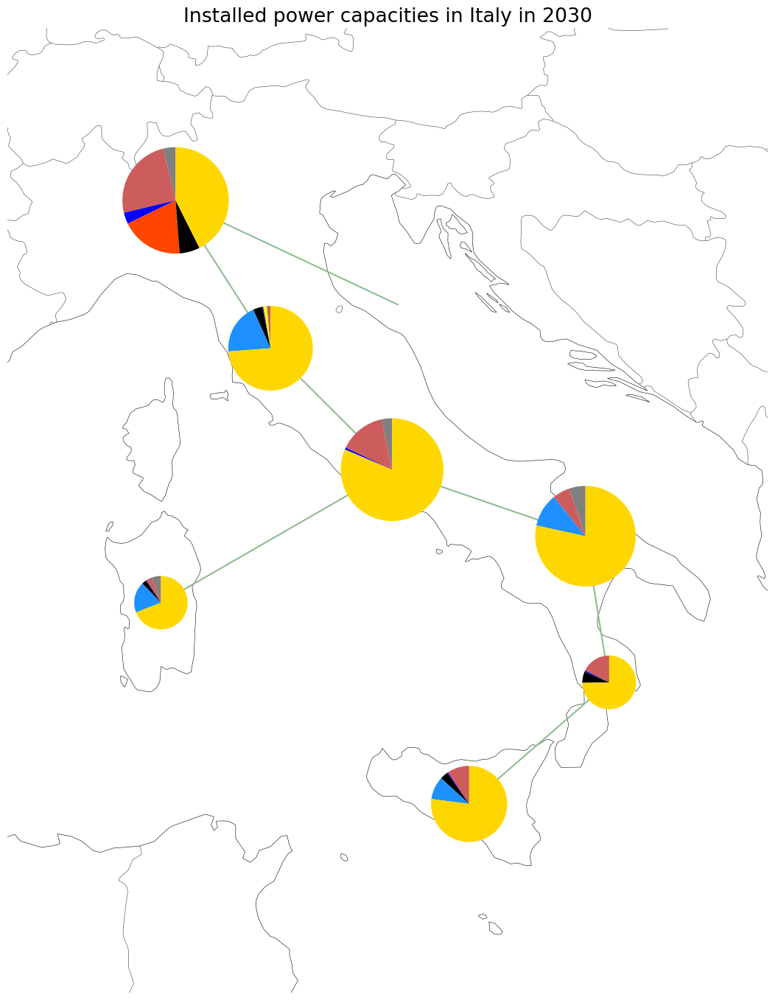

<Figure size 640x480 with 0 Axes>

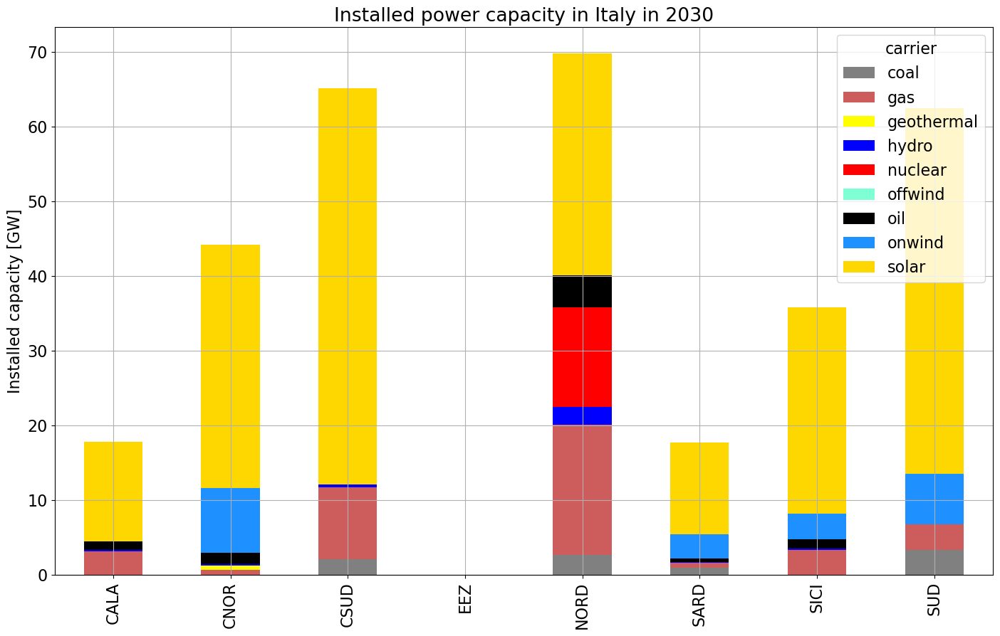

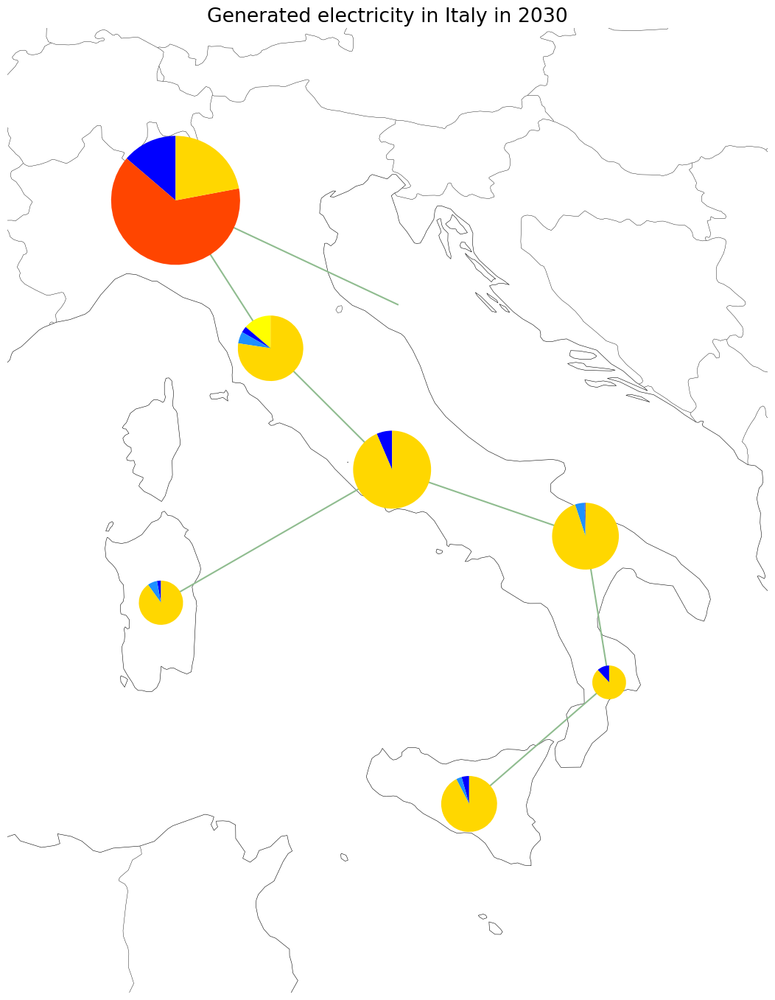

<Figure size 640x480 with 0 Axes>

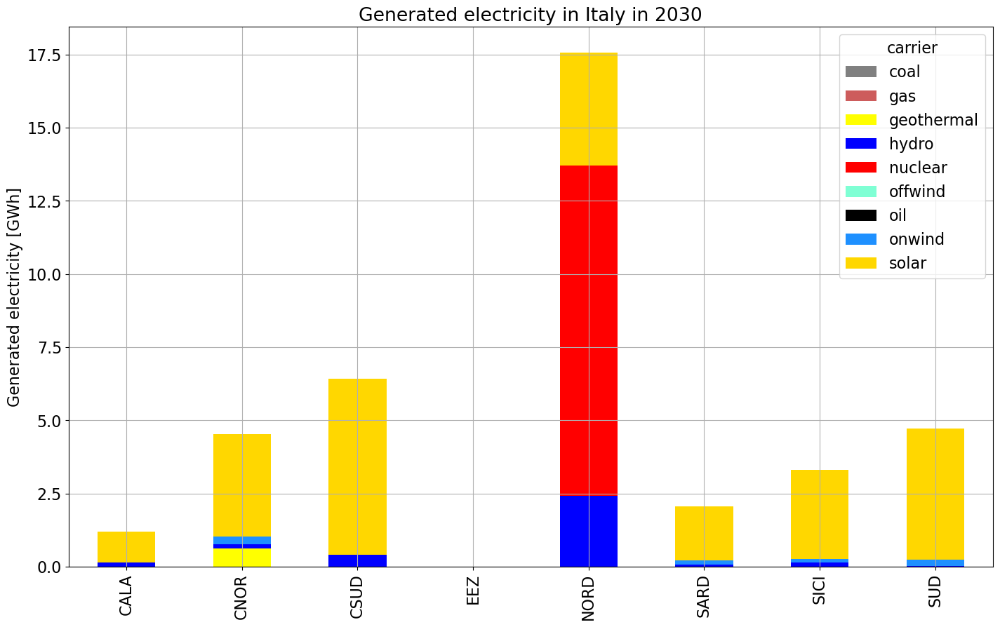

,Line capacity [MW],Positive values [%],Negative values [%],Average power transmitted,Capacity utilisation [%]
NORD-->CNOR,5000.0,39.32,60.68,2869.53,57.39
CNOR-->CSUD,5000.0,58.39,41.61,2987.92,59.76
CSUD-->SUD,5000.0,36.99,63.01,3989.62,79.79
SUD-->CALA,1500.0,56.64,43.36,1137.11,75.81
CALA-->SICI,1000.0,59.21,40.79,888.81,88.88
SARD-->CSUD,1500.0,77.50,22.50,1222.91,81.53
EEZ-->NORD,0.0,0.00,0.00,0.00,0.00


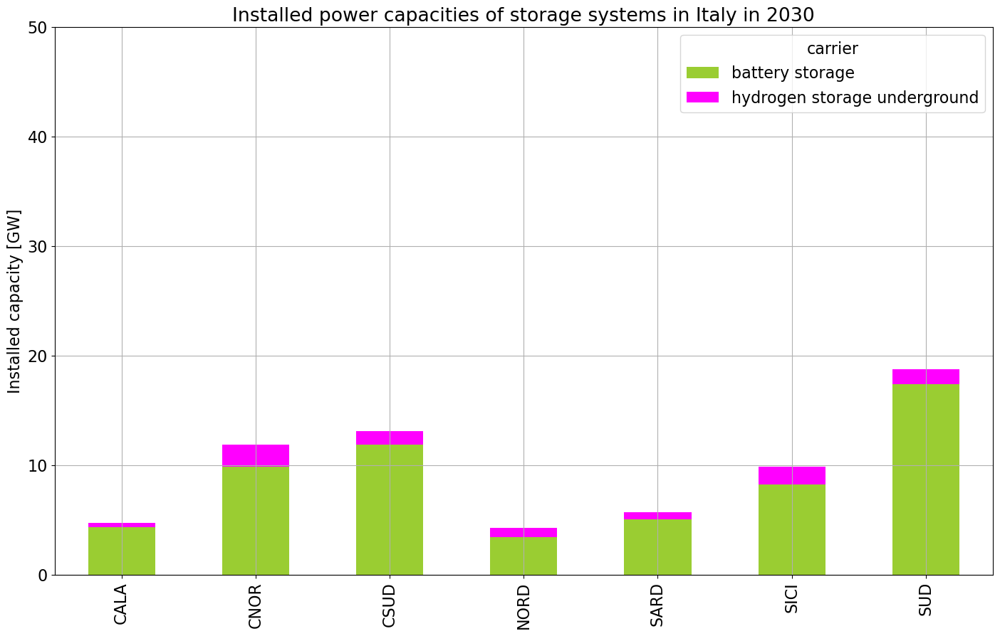

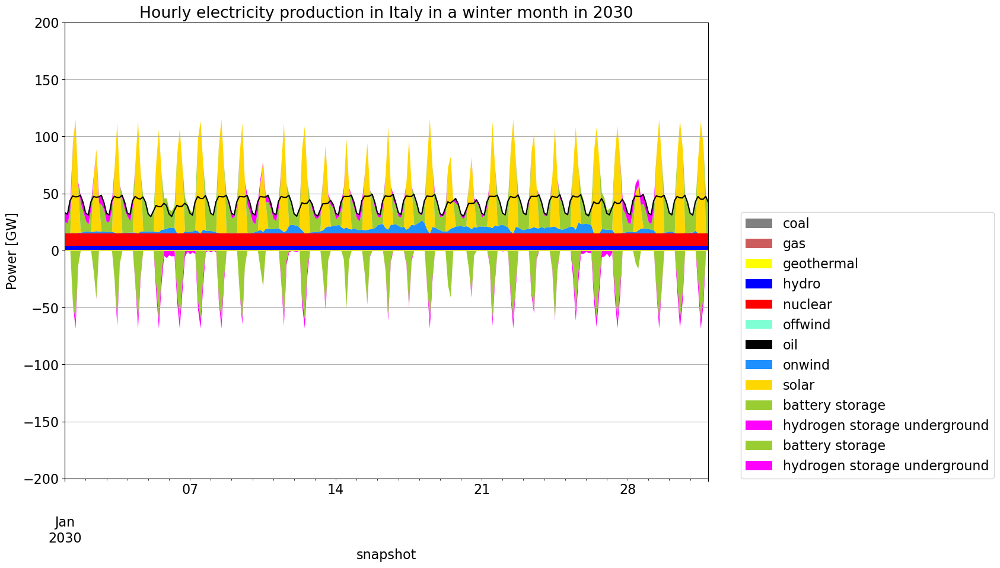

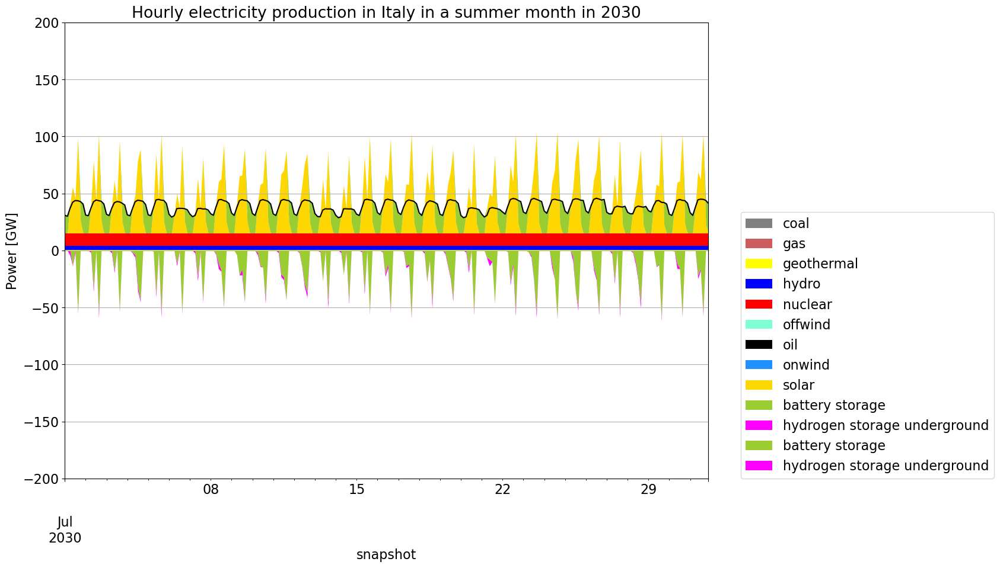

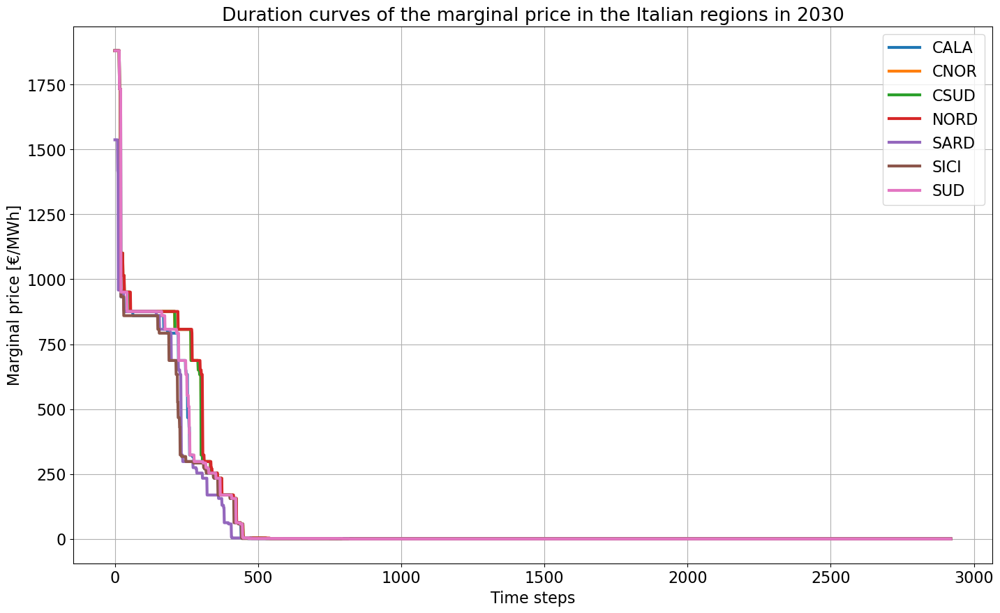

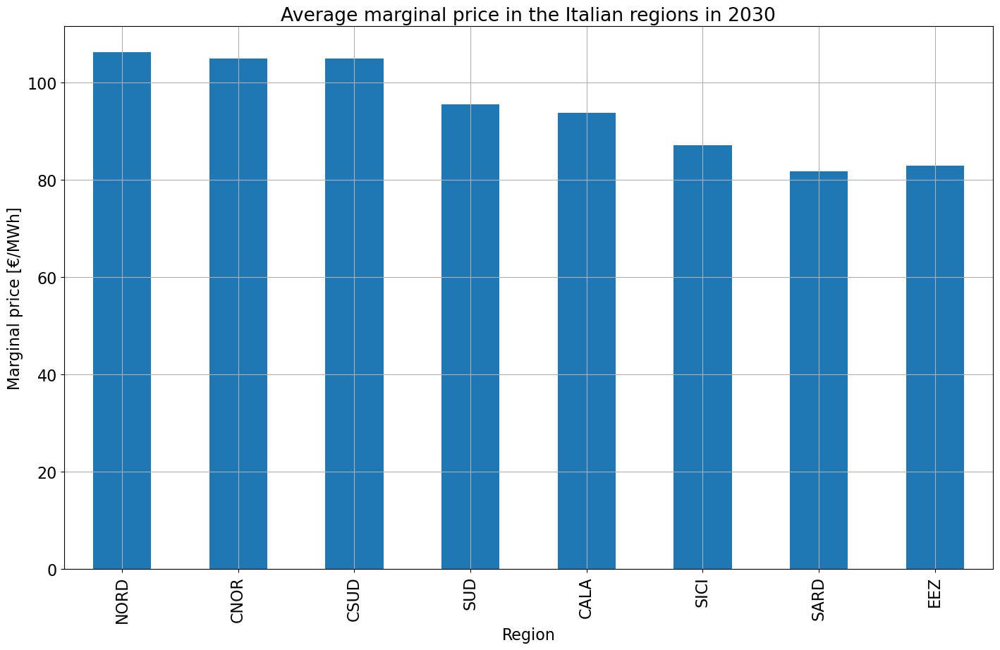

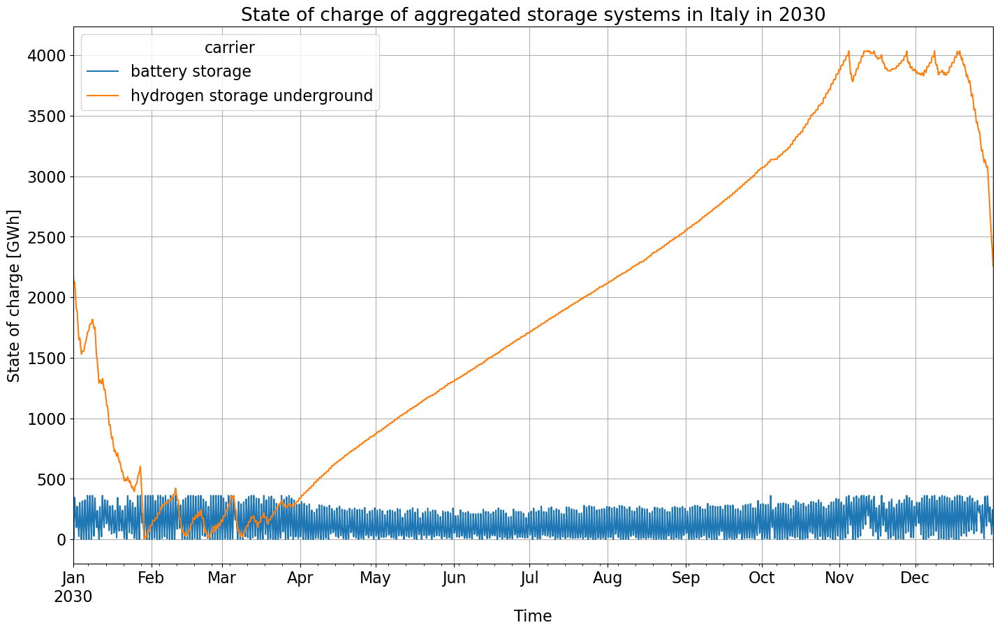

In [476]:
capacities_nuclear = inst_cap_plot()
colors = ["grey", "indianred", "yellow", "blue", "red", "aquamarine", "black", "dodgerblue", "gold", "yellowgreen", "magenta"]
inst_cap_table(colors)
gen_nuclear = gen_power_plot()
gen_power_table(colors)
storages_nuclear = inst_store_table()
gen_curve_month_winter(colors)
gen_curve_month_summer(colors)
price_dur_curve_plot()
price_regions_table()
state_of_charge_plot()
trans_line_nuclear = trans_lines_table()
trans_line_nuclear 

In [477]:
stats_nuclear = n.statistics()

# **5.** Comparison

In [502]:
comp_system_cost = pd.DataFrame(index = ["Base scenario", "0% PV potential", "20% PV potential", "40% PV potential", "60% PV potential", "80% PV potential", "Zero emissions", "Nuclear scenario"],
                                columns = ['AC', 'battery storage', 'hydrogen storage underground', 'Coal', 'Gas', 'Geothermal', 'Hydro', 'Offshore Wind', 'Oil', 'Onshore Wind', 'Solar', 'Nuclear'])

demand = n.snapshot_weightings.generators @ n.loads_t.p_set.sum(axis=1) # the same in each scenario

comp_system_cost.loc["Base scenario"] = system_cost_base # Million €/a
comp_system_cost.loc["Zero emissions"] = system_cost_zero_emiss # Million €/a
if tot_cost_0_PV > 0: 
    comp_system_cost.loc["0% PV potential"] = system_cost_0_PV # Million €/a
else: comp_system_cost.loc["0% PV potential"] = 0.0
if tot_cost_20_PV > 0: 
    comp_system_cost.loc["20% PV potential"] = system_cost_20_PV # Million €/a
else: comp_system_cost.loc["20% PV potential"] = 0.0
comp_system_cost.loc["40% PV potential"] = system_cost_40_PV # Million €/a
comp_system_cost.loc["60% PV potential"] = system_cost_60_PV # Million €/a
comp_system_cost.loc["80% PV potential"] = system_cost_80_PV # Million €/a
comp_system_cost.loc["Nuclear scenario"] = system_cost_nuclear # Million €/a

comp_system_cost.AC = comp_system_cost.AC-system_cost_base.AC # expenditure for already existing transmission lines

comp_system_cost[comp_system_cost<0] = 0 # since we subtact the AC cost (for the 0% or 20%) 
#comp_system_cost.iloc[0,0] = system_cost_base.AC


comp_system_cost = comp_system_cost.mul(1e6).div(demand) #eur0/

comp_system_cost.rename(columns = {"battery storage": "Battery storage"}, inplace=True)
comp_system_cost.rename(columns = {"hydrogen storage underground": "Hydrogen storage underground"}, inplace=True)

comp_system_cost.fillna(0, inplace=True)

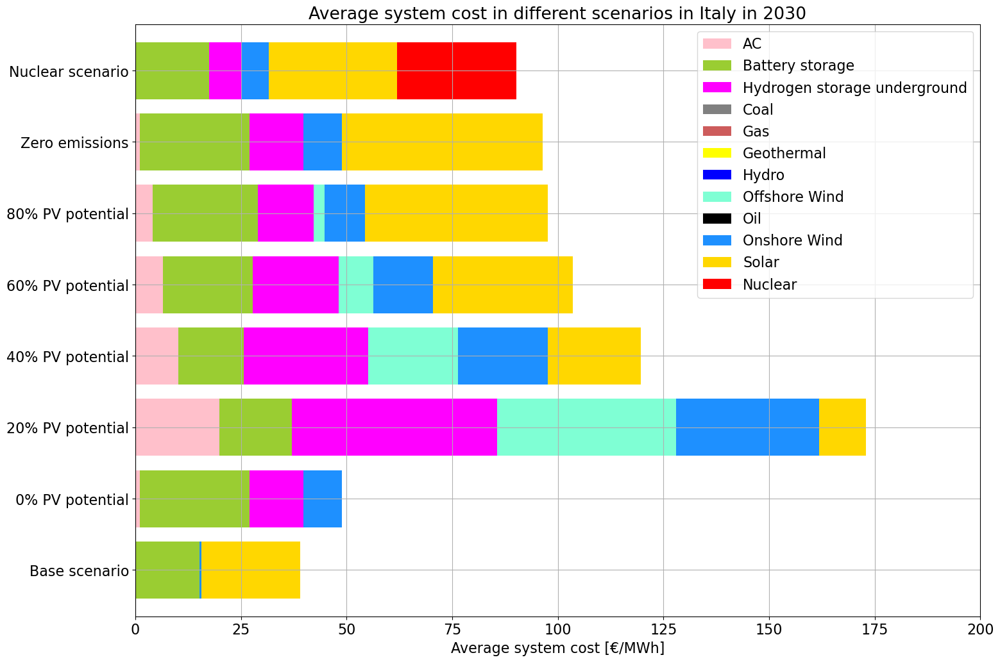

In [503]:
comp_system_cost.plot.barh(figsize=(17,12),
                        color=["pink","yellowgreen", "magenta","grey", "indianred", "yellow", "blue", "aquamarine", "black", "dodgerblue", "gold", "red"],
                        grid=True,
                        stacked=True,
                        ylabel="",
                        xlabel="Average system cost [€/MWh]",
                        title=f"Average system cost in different scenarios in Italy in {year}",
                        xlim=[0,200],
                        width=0.8
)
plt.show()

In [481]:
comp_gen_electr = pd.DataFrame(index = ["Base scenario", "0% PV potential", "20% PV potential", "40% PV potential", "60% PV potential", "80% PV potential", "Zero emissions", "Nuclear scenario"],
                                columns = ['coal', 'gas', 'geothermal', 'hydro', 'offwind', 'oil', 'onwind', 'solar', 'nuclear'])

comp_gen_electr.loc["Base scenario"] = gen_base.sum().div(1e3) # TWh/a
comp_gen_electr.loc["Zero emissions"] = gen_zero_emiss.sum().div(1e3) # TWh/a
if tot_cost_0_PV > 0: 
    comp_gen_electr.loc["0% PV potential"] = gen_0_PV.sum().div(1e3) # TWh/a
else: comp_gen_electr.loc["0% PV potential"] = 0.0
if tot_cost_20_PV > 0: 
    comp_gen_electr.loc["20% PV potential"] = gen_20_PV.sum().div(1e3) # TWh/a
else: comp_gen_electr.loc["20% PV potential"] = 0.0
comp_gen_electr.loc["40% PV potential"] = gen_40_PV.sum().div(1e3) # TWh/a
comp_gen_electr.loc["60% PV potential"] = gen_60_PV.sum().div(1e3) # TWh/a
comp_gen_electr.loc["80% PV potential"] = gen_80_PV.sum().div(1e3) # TWh/a
comp_gen_electr.loc["Nuclear scenario"] = gen_nuclear.sum().div(1e3) # TWh/a

comp_gen_electr.rename(columns = {"coal": "Coal"}, inplace=True)
comp_gen_electr.rename(columns = {"gas": "Gas"}, inplace=True)
comp_gen_electr.rename(columns = {"hydro": "Hydro"}, inplace=True)
comp_gen_electr.rename(columns = {"offwind": "Offshore Wind"}, inplace=True)
comp_gen_electr.rename(columns = {"onwind": "Onshore Wind"}, inplace=True)
comp_gen_electr.rename(columns = {"solar": "Solar"}, inplace=True)
comp_gen_electr.rename(columns = {"oil": "Oil"}, inplace=True)
comp_gen_electr.rename(columns = {"geothermal": "Geothermal"}, inplace=True)
comp_gen_electr.rename(columns = {"nuclear": "Nuclear"}, inplace=True)

comp_gen_electr.fillna(0, inplace=True)

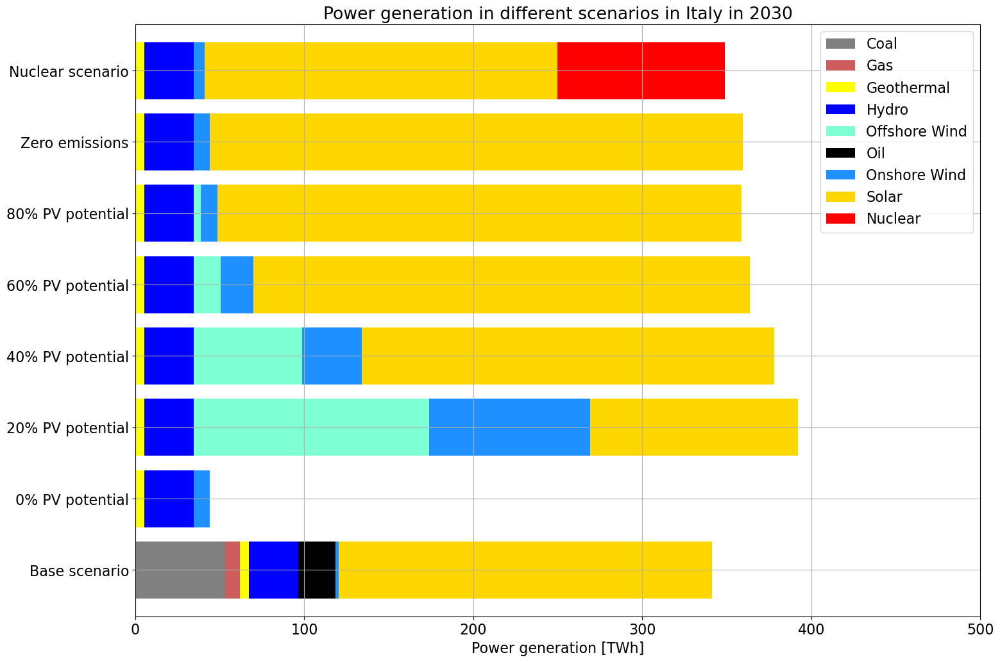

In [482]:
comp_gen_electr.plot.barh(figsize=(17,12),
                        color=["grey", "indianred", "yellow", "blue", "aquamarine", "black", "dodgerblue", "gold", "red"],
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Power generation [TWh]",
                        title=f"Power generation in different scenarios in Italy in {year}",
                        xlim=[0,500],
                        width=0.8
)
plt.show()

In [483]:
comp_inst_cap = pd.DataFrame(index=gen_nuclear.columns)

comp_inst_cap["Base scenario"] = capacities_base.groupby("carrier").sum().div(1e3)
if tot_cost_0_PV > 0: 
    comp_inst_cap["0% PV potential"] = capacities_0_PV.groupby("carrier").sum().div(1e3)
else: comp_inst_cap["0% PV potential"] = 0.0
if tot_cost_20_PV > 0: 
    comp_inst_cap["20% PV potential"] = capacities_20_PV.groupby("carrier").sum().div(1e3)
else: comp_inst_cap["20% PV potential"] = 0.0
comp_inst_cap["40% PV potential"] = capacities_40_PV.groupby("carrier").sum().div(1e3)
comp_inst_cap["60% PV potential"] = capacities_60_PV.groupby("carrier").sum().div(1e3)
comp_inst_cap["80% PV potential"] = capacities_80_PV.groupby("carrier").sum().div(1e3)
comp_inst_cap["Zero emissions"] = capacities_zero_emissions.groupby("carrier").sum().div(1e3)
comp_inst_cap["Nuclear scenario"] = capacities_nuclear.groupby("carrier").sum().div(1e3)

comp_inst_cap.fillna(0, inplace=True)


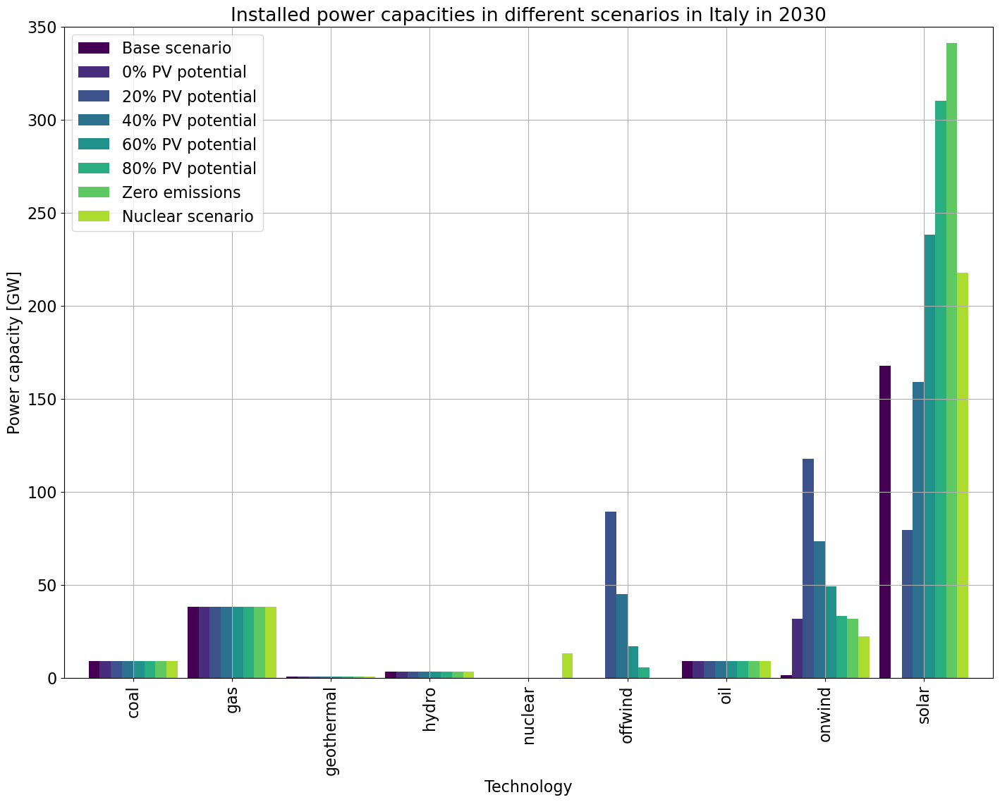

In [484]:
colors = cm.viridis(np.linspace(0, 1, len(comp_inst_cap)))

comp_inst_cap.plot.bar(figsize=(17,12),
                        color=colors,
                        grid=True,
                        xlabel="Technology",
                        ylabel="Power capacity [GW]",
                        title=f"Installed power capacities in different scenarios in Italy in {year}",
                        ylim=[0,350],
                        width=0.9
)
plt.show()

In [485]:
comp_curtailment = pd.DataFrame(index = ["Base scenario", "0% PV potential", "20% PV potential", "40% PV potential", "60% PV potential", "80% PV potential", "Zero emissions", "Nuclear scenario"],
                                columns = ['Coal', 'Gas', 'Geothermal', 'Hydro', 'Offshore Wind', 'Oil', 'Onshore Wind', 'Solar', 'Nuclear'])

comp_curtailment.loc["Base scenario"] = stats_base.loc["Generator"].Curtailment.div(1e3) # TWh
comp_curtailment.loc["Zero emissions"] = stats_zero_emiss.loc["Generator"].Curtailment.div(1e3) # TWh
if tot_cost_0_PV > 0: 
    comp_curtailment.loc["0% PV potential"] = stats_20_PV.loc["Generator"].Curtailment.div(1e3) # TWh
else: comp_curtailment.loc["0% PV potential"] = 0.0
if tot_cost_20_PV > 0: 
    comp_curtailment.loc["20% PV potential"] = stats_40_PV.loc["Generator"].Curtailment.div(1e3) # TWh
else: comp_curtailment.loc["20% PV potential"] = 0.0
comp_curtailment.loc["40% PV potential"] = stats_40_PV.loc["Generator"].Curtailment.div(1e3) # TWh
comp_curtailment.loc["60% PV potential"] = stats_60_PV.loc["Generator"].Curtailment.div(1e3) # TWh
comp_curtailment.loc["80% PV potential"] = stats_80_PV.loc["Generator"].Curtailment.div(1e3) # TWh
comp_curtailment.loc["Nuclear scenario"] = stats_nuclear.loc["Generator"].Curtailment.div(1e3) # TWh

comp_curtailment.fillna(0, inplace=True)

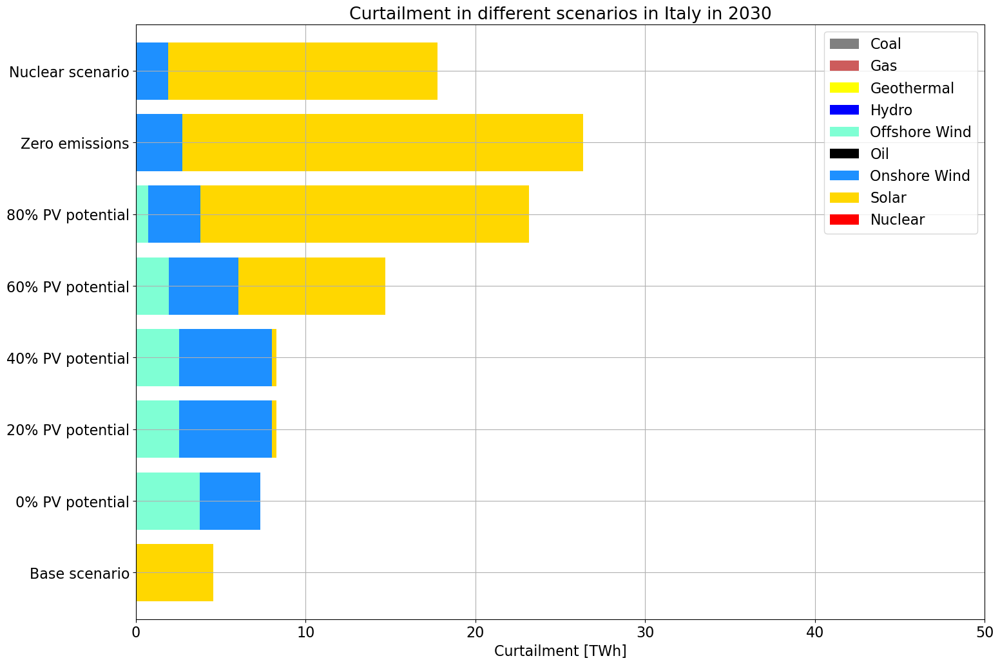

In [486]:
comp_curtailment.plot.barh(figsize=(17,12),
                        color=["grey", "indianred", "yellow", "blue", "aquamarine", "black", "dodgerblue", "gold", "red"],
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Curtailment [TWh]",
                        title=f"Curtailment in different scenarios in Italy in {year}",
                        xlim=[0,50],
                        width=0.8
)
plt.show()

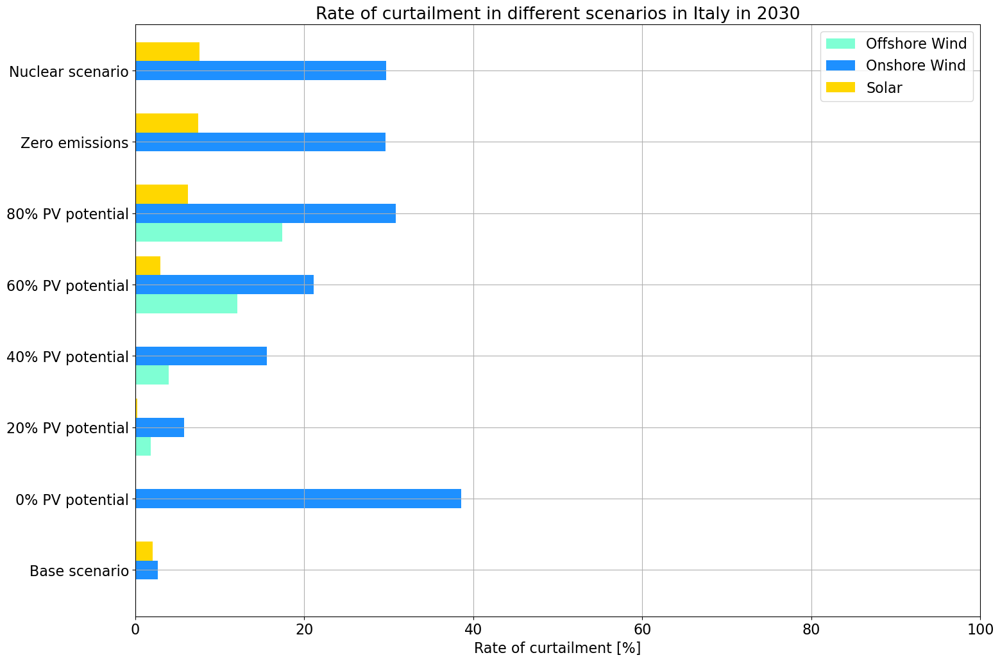

In [487]:
curtailment_share = comp_curtailment / comp_gen_electr * 100
curtailment_share.fillna(0, inplace=True)
curtailment_share.drop(columns=["Geothermal","Oil","Coal","Gas","Hydro","Nuclear"],inplace=True)
curtailment_share.plot.barh(figsize=(17,12),
                        color=["aquamarine", "dodgerblue", "gold"],
                        grid=True,
                        ylabel="",
                        xlabel="Rate of curtailment [%]",
                        title=f"Rate of curtailment in different scenarios in Italy in {year}",
                        xlim=[0,100],
                        width=0.8
)
plt.show()